# 00 General information
Note: This notebook has been prepared by Yan Bello Méndez, as part of the TFM (Trabajo de Fin de Máster) works, developments (modelling, coding, testing, improving) and experiments related to his Master in Artificial Intelligence degree by UNIR (2018-2019).

Nota: Los modelos y el código Python han sido desarrollados por Yan Bello Méndez, como parte del Trabajo Final de Máster (TFM) en el Máster en Inteligencia Artificial (UNIR, 2018-2019).

This notebook is structured as follows:
>	01. General data preparations
>	02. Define and train SVM (Linear & RBF) and KNN models
>	03. Define and train Neural Network models
>	04. Cross testing and analysis of the models
>	05. Yielding Associations Network & Context Filters
>	06. Support functions: Laser_print.py & Room_teller.py




# 01 General data preparations

## Preparing the DATA to train the models

In [0]:
# STEP 0: LOAD/MOUNT GOOGLE DRIVE INTO COLAB:
# To work with Google Colab and Google Drive: 
from google.colab import drive 
drive.mount('/content/gdrive')
FILE_DIRECTORY =  "gdrive/My Drive/"
ROS_DIRECTORY =  FILE_DIRECTORY + "ROS/SCAN/190122-CD/"

# Folder names for house scans
DIR_SCANS_SY = FILE_DIRECTORY + "ROS/SCAN/190104-SY/"
DIR_SCANS_CA = FILE_DIRECTORY + "ROS/SCAN/190105-CA/"
DIR_SCANS_ME = FILE_DIRECTORY + "ROS/SCAN/190122-ME/"
DIR_SCANS_TR = FILE_DIRECTORY + "ROS/SCAN/190123-TR/"

# Folder names for house scans
DIR_SCANS_MODELS = FILE_DIRECTORY + "ROS/SCAN/MODELS/"


#### Preparing data for cross-model comparisions

In [0]:
import pandas as pd
# STEP: READ DATASET FROM EXTERNAL FILE
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_ONLY_FEATURES_190209.txt'
df_SCAN_FEATURES_ALL = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))

In [0]:
df_FEATURES_1SY = df_SCAN_FEATURES_ALL[(df_SCAN_FEATURES_ALL["house_ID"]=="1SY")]
df_FEATURES_2CA = df_SCAN_FEATURES_ALL[(df_SCAN_FEATURES_ALL["house_ID"]=="2CA")]
df_FEATURES_3ME = df_SCAN_FEATURES_ALL[(df_SCAN_FEATURES_ALL["house_ID"]=="3ME")]
df_FEATURES_4TR = df_SCAN_FEATURES_ALL[(df_SCAN_FEATURES_ALL["house_ID"]=="4TR")]

print(df_FEATURES_1SY.shape)
print(df_FEATURES_1SY.head())

#del df_SCAN_FEATURES_ALL

(1800, 12)
   Unnamed: 0 room_ID house_ID       var      mean       std  median    max  \
0           0    R01S      1SY  1.280102  1.727656  1.129888   2.177  4.305   
1           1    R01S      1SY  1.424719  1.659540  1.191901   2.147  4.327   
2           2    R01S      1SY  1.420910  1.645136  1.190304   2.115  4.316   
3           3    R01S      1SY  1.554625  1.462976  1.245024   1.966  4.339   
4           4    R01S      1SY  1.528801  1.566290  1.234636   2.003  4.332   

   min  range  kurtosis  skewness  
0  0.0  4.305 -0.706080 -0.508396  
1  0.0  4.327 -0.924417 -0.316680  
2  0.0  4.316 -0.976682 -0.320166  
3  0.0  4.339 -1.183259 -0.013393  
4  0.0  4.332 -1.078383 -0.137667  


In [0]:
print(df_FEATURES_2CA.shape)
print(df_FEATURES_2CA.head())

In [0]:
print(df_FEATURES_3ME.shape)
print(df_FEATURES_3ME.head())

In [0]:
print(df_FEATURES_4TR.shape)
print(df_FEATURES_4TR.head())

In [0]:
# STEP 1: LOAD FILE INFO FROM THE FOLDER ROS_DIRECTORY
import os
from os import walk

file_names = []
dir_names = []

for (dirpath, dirnames, filenames) in walk(ROS_DIRECTORY):
    file_names.extend(filenames)


import pandas as pd
import numpy as np

# Creamos un data frame y cargamos los datos del fichero
df_SCAN_Files = pd.DataFrame({"File": file_names})

fn = lambda row: (row.File[5:9]) # define a function for the new column
col = df_SCAN_Files.apply(fn, axis=1) # get column data with an index
df_SCAN_Files = df_SCAN_Files.assign(Room_ID=col.values) # assign values to column 'Room_ID'

df_SCAN_Files.drop(df_SCAN_Files.loc[df_SCAN_Files['File']=="desktop.ini"].index, inplace=True)

print(df_SCAN_Files.head())
print(df_SCAN_Files.tail())


                                       File Room_ID
0  SCAN_R04P_2016-02-11_17_42_24_327653.txt    R04P
1  SCAN_R04P_2016-02-11_17_42_24_527561.txt    R04P
2  SCAN_R04P_2016-02-11_17_42_24_834221.txt    R04P
3  SCAN_R04P_2016-02-11_17_42_24_728460.txt    R04P
4  SCAN_R04P_2016-02-11_17_42_25_127576.txt    R04P
                                          File Room_ID
1798  SCAN_R04P_2016-02-11_17_42_23_439921.txt    R04P
1799  SCAN_R04P_2016-02-11_17_42_23_932490.txt    R04P
1800  SCAN_R04P_2016-02-11_17_42_24_036993.txt    R04P
1801  SCAN_R04P_2016-02-11_17_42_24_433457.txt    R04P
1802  SCAN_R04P_2016-02-11_17_42_24_131713.txt    R04P


In [0]:
df_SCAN_Files.groupby("Room_ID").count()

,File
Room_ID,
R01S,300
R02C,300
R03H,300
R04P,300
R05D,300
R06B,300


In [0]:
# STEP 3: FUNCTION TO VISUALIZE THE DATA THAT WAS SCAN...
# THIS HAVE BEEN "CALIBRATED" TO THE HOKUYO AND ITS SCANNING RANGE (240 DEGREES)

def display_scan(my_data_file_name, scan_txt = ""):
  # This function visualizes/plots the output of a scanned vector...

  import pandas as pd
  import numpy as np

  array_laser_scans =  np.loadtxt(my_data_file_name, delimiter = ',')

  # Create a data frame and load scan data
  df_laser_scans = pd.DataFrame(array_laser_scans)

  from datetime import datetime

  # define a function for the values of the new column
  fn_date = lambda row: str(datetime.fromtimestamp(int(row[0]))) 
  col = df_laser_scans.apply(fn_date, axis=1) 
  df_laser_scans = df_laser_scans.assign(datetime=col.values) # assign values to new column

  # define a function for the values of the new column
  fn_index = lambda row: int(row[1])
  col = df_laser_scans.apply(fn_index, axis=1) 
  df_laser_scans = df_laser_scans.assign(index=col.values) # assign values to new column

  import math 

  # define a function for the values of the new column
  fn_x = lambda row: row[2]*math.cos(math.radians((row[1]-130)*360/1024))
  col = df_laser_scans.apply(fn_x, axis=1) 
  df_laser_scans = df_laser_scans.assign(x=col.values) # assign values to new column

  # define a function for the values of the new column
  fn_y = lambda row: row[2]*math.sin(math.radians((row[1]-130)*360/1024))
  col = df_laser_scans.apply(fn_y, axis=1) 
  df_laser_scans = df_laser_scans.assign(y=col.values) # assign values to new column

  import matplotlib.pyplot as plt
  
  plt.figure()
  plt.plot(df_laser_scans.x[44:],df_laser_scans.y[44:])
  plt.ylim(-4,4)
  plt.xlim(-4,4)
  plt.plot()

  plt.plot([0,10*math.cos(math.radians(-30))],[0,10*math.sin(math.radians(-30))])
  plt.plot([0,10*math.cos(math.radians(210))],[0,10*math.sin(math.radians(210))])

  plt.plot(0, 0, marker='o', color='red')  
  plt.text(-2,-3, scan_txt)
  
  

SCAN_R05D_2016-02-11_17_49_14_082966.txt
SCAN_R06B_2016-02-11_17_45_02_765179.txt
SCAN_R02C_2016-02-11_17_43_12_898974.txt
SCAN_R05D_2016-02-11_17_49_02_972051.txt
SCAN_R04P_2016-02-11_17_42_00_529278.txt
SCAN_R03H_2016-02-11_17_46_11_753992.txt
SCAN_R06B_2016-02-11_17_45_28_691658.txt
SCAN_R05D_2016-02-11_17_49_23_285481.txt
SCAN_R03H_2016-02-11_17_46_02_532298.txt
SCAN_R06B_2016-02-11_17_44_54_516081.txt


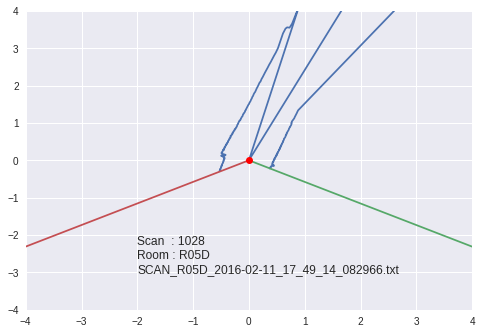

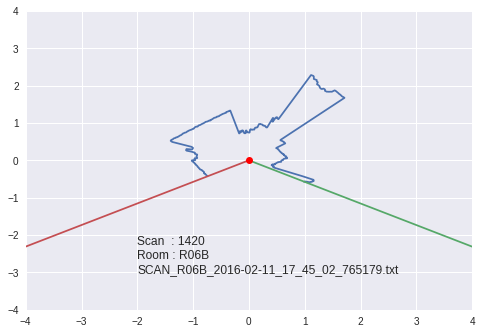

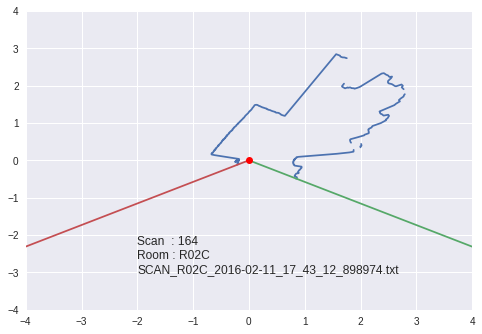

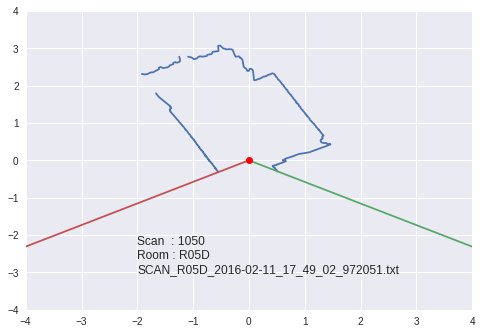

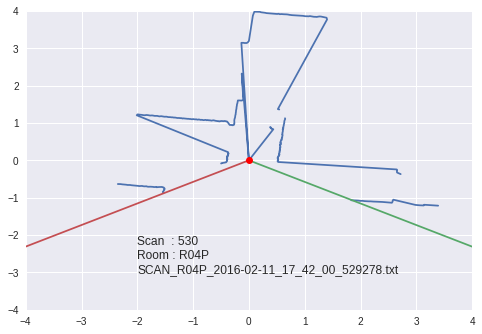

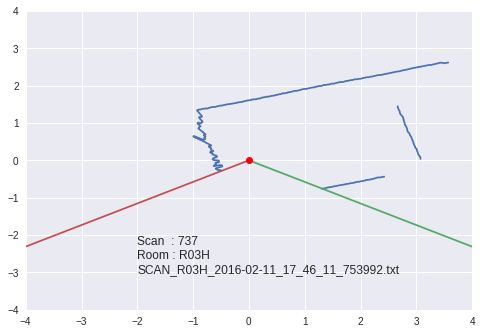

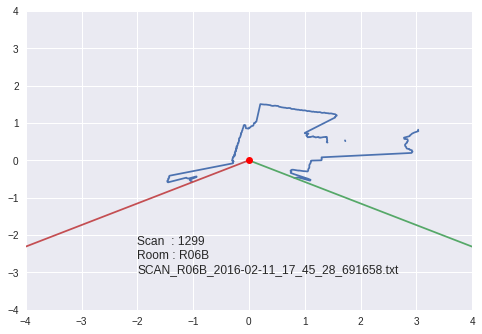

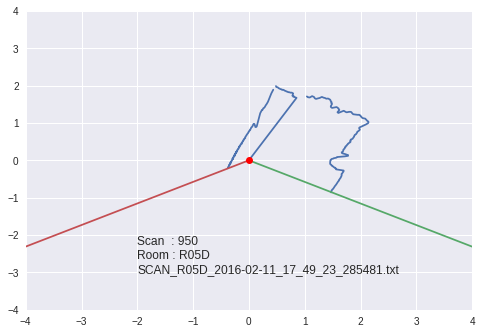

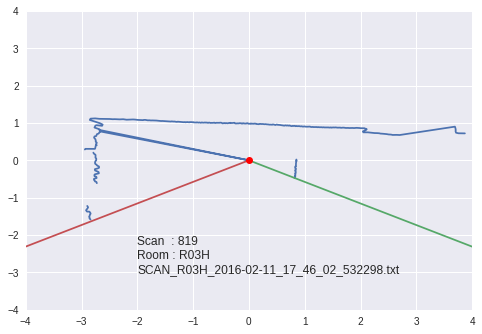

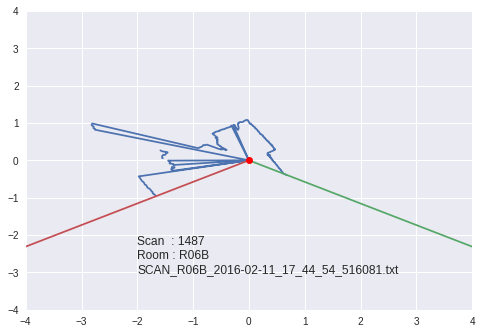

In [0]:
# STEP 4: VISUALIZE A SAMPLE OF SCANS...

# lets display a few scans selected randomly...
import random 

# here we need to adjust the range value...
index_list = random.sample(range(len(df_SCAN_Files)),10)

for i in index_list:
  file_name = df_SCAN_Files.iloc[i].File
  display_scan(ROS_DIRECTORY+file_name, "Scan  : " + str(i) +"\nRoom : " + df_SCAN_Files.iloc[i].Room_ID + "\n" + file_name)
  print(file_name)
  

### IMPORTANT: Read the scan-data files and create a dataframe with all data

In [0]:
# STEP 5: Read the scan-data files and create a dataframe with all data...

x_scans = pd.DataFrame()
y_rooms_array = []
y_scanning_ID_array = []

for i in range(len(df_SCAN_Files)):
  my_data_file_name = ROS_DIRECTORY + df_SCAN_Files.iloc[i].File
  # load the file values
  array_laser_scans =  np.loadtxt(my_data_file_name, delimiter = ',', usecols=2)

  # Create a data frame and load scan data
  df_laser_scans = pd.DataFrame(array_laser_scans)
  
  df_laser_scans.fillna(0, inplace=True)
  
  # Append/update the x data
  x_scans =  pd.concat([x_scans, df_laser_scans[44:726].T], ignore_index=True)
  # save the scanning index - important to later ordering the data...
  
  # Append/update the y vector
  y_rooms_array.append(df_SCAN_Files.iloc[i].Room_ID)
  
  print("READING:", str(i), "ROOM:",df_SCAN_Files.iloc[i].Room_ID)
  
y_rooms = pd.DataFrame(y_rooms_array)

In [0]:
# STEP 6: CONCATENATE THE X AND Y MATRIXES
y_rooms.columns = ['room_ID']
xy_scan_data =  pd.concat([x_scans, y_rooms], axis=1)

In [0]:
xy_scan_data.head()

,44,45,46,47,48,49,50,51,52,53,...,717,718,719,720,721,722,723,724,725,room_ID
0,0.636,0.638,0.638,0.638,0.636,0.629,0.628,0.625,0.624,0.624,...,0.322,0.324,0.324,0.327,0.329,0.329,0.330,0.335,0.345,R02C
1,0.441,0.441,0.443,0.441,0.444,0.447,0.447,0.471,0.476,0.489,...,1.488,1.502,1.505,1.505,1.505,1.460,1.457,1.457,1.451,R02C
2,0.655,0.655,0.655,0.647,0.645,0.645,0.644,0.640,0.637,0.636,...,0.336,0.341,0.341,0.337,0.342,0.337,0.337,0.341,0.342,R02C
3,0.515,0.548,0.584,0.592,0.609,0.614,0.614,0.614,0.604,0.599,...,0.394,0.400,0.399,0.399,0.400,0.400,0.400,0.404,0.417,R02C
4,0.626,0.645,0.655,0.662,0.662,0.662,0.660,0.660,0.656,0.657,...,0.349,0.349,0.349,0.350,0.349,0.349,0.349,0.350,0.355,R02C


In [0]:
# STEP 7: SAVE DATASET TO EXTERNAL FILE
my_data_file_name = ROS_DIRECTORY + '0_Unified_SCANS_190122-ME.txt'
xy_scan_data.to_csv(my_data_file_name, mode='a')

### READ DATASET FROM EXTERNAL FILE

#### Data preparations for COMPLETE MODELS

In [0]:
# STEP 7: SAVE DATASET TO EXTERNAL FILE
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_AND_FEATURES_190123.txt'
df_test = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))

In [0]:
df_test.head()

,Unnamed: 0,room_ID,house_ID,44,45,46,47,48,49,50,...,725,var,mean,std,median,max,min,range,kurtosis,skewness
0,0,R01S,1SY,2.277,2.277,2.262,2.243,2.234,2.231,2.225,...,2.152,1.303913,1.725677,1.141877,2.177,4.305,-0.706080,5.011080,-0.667742,-0.492047
1,1,R01S,1SY,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.269,1.446827,1.658320,1.202835,2.147,4.327,-0.924417,5.251417,-0.862712,-0.297193
2,2,R01S,1SY,1.983,1.983,0.000,0.000,0.000,0.000,0.000,...,2.113,1.443227,1.643901,1.201338,2.115,4.316,-0.976682,5.292682,-0.905162,-0.299093
3,3,R01S,1SY,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,1.575179,1.463659,1.255064,1.966,4.339,-1.183259,5.522259,-1.078225,0.010635
4,4,R01S,1SY,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.253,1.549369,1.565916,1.244736,2.003,4.332,-1.078383,5.410383,-0.996971,-0.116451


In [0]:
# STEP 8: READ DATASET FROM EXTERNAL FILE
# We work with the prepared file, which is based on the previous dataset
import pandas as pd

my_data_file_name = ROS_DIRECTORY + '0_Unified_SCANS_190122-ME.txt'

# Creamos un data frame y cargamos los datos del fichero
df_test = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))

In [0]:
# STEP 9: COPY-PREPARE WORKING DATASET (XY_SCAN_DATA)
xy_scan_data = df_test

In [0]:
del df_test

### Add "engineered" features to dataset

In [0]:
# STEP 10: Prepare FEATURES

xy_scan_data['var'] = xy_scan_data.var(axis=1)
xy_scan_data['mean'] = xy_scan_data.mean(axis=1)
xy_scan_data['std'] = xy_scan_data.std(axis=1)
xy_scan_data['median'] = xy_scan_data.median(axis=1)
xy_scan_data['max'] = xy_scan_data.max(axis=1)
xy_scan_data['min'] = xy_scan_data.min(axis=1)
xy_scan_data['range'] = xy_scan_data['max']-xy_scan_data['min']
xy_scan_data['kurtosis'] = xy_scan_data.kurtosis(axis=1)
xy_scan_data['skewness'] = xy_scan_data.skew(axis=1)

In [0]:
# 10.a) let see the contents
xy_scan_data.head()

,Unnamed: 0,44,45,46,47,48,49,50,51,52,...,room_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,0,0.636,0.638,0.638,0.638,0.636,0.629,0.628,0.625,0.624,...,R02C,0.855832,1.040877,0.923786,0.6510,3.981,0.0,3.981,2.089445,1.554269
1,1,0.441,0.441,0.443,0.441,0.444,0.447,0.447,0.471,0.476,...,R02C,1.050396,1.090670,1.023390,0.6720,4.088,0.0,4.088,1.685410,1.515832
2,2,0.655,0.655,0.655,0.647,0.645,0.645,0.644,0.640,0.637,...,R02C,0.940747,1.122520,0.968527,0.6930,3.938,0.0,3.938,1.632149,1.492315
3,3,0.515,0.548,0.584,0.592,0.609,0.614,0.614,0.614,0.604,...,R02C,1.039824,1.071125,1.018227,0.6395,4.730,0.0,4.730,2.068312,1.620321
4,4,0.626,0.645,0.655,0.662,0.662,0.662,0.660,0.660,0.656,...,R02C,0.904430,1.102485,0.949654,0.6705,4.000,0.0,4.000,1.811851,1.518336


In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = xy_scan_data[xy_scan_data.columns[683:684]]
y_rooms.columns = ["Room_ID"]
y_rooms.tail()

,Room_ID
1795,R01S
1796,R01S
1797,R01S
1798,R01S
1799,R01S


In [0]:
# STEP 11b. Prepare the INPUT (Sample) Vectors x_scans (for classification)
x_scans = xy_scan_data[xy_scan_data.columns[683:]]
x_scans.columns.values[0] = "Room_ID"
x_scans.head()

,Room_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,R02C,0.855832,1.040877,0.923786,0.6510,3.981,0.0,3.981,2.089445,1.554269
1,R02C,1.050396,1.090670,1.023390,0.6720,4.088,0.0,4.088,1.685410,1.515832
2,R02C,0.940747,1.122520,0.968527,0.6930,3.938,0.0,3.938,1.632149,1.492315
3,R02C,1.039824,1.071125,1.018227,0.6395,4.730,0.0,4.730,2.068312,1.620321
4,R02C,0.904430,1.102485,0.949654,0.6705,4.000,0.0,4.000,1.811851,1.518336


## PLOT room FEATURES (statistcs) for each house

In [0]:
def plot_room_stats(house, room):
  plot_values = x_scans[(x_scans["room_ID"]==room) & (x_scans["house_ID"]==house)]
  plot_values = plot_values.reset_index()
  plt.figure()
  plt.plot(plot_values["var"])
  plt.legend()
  plt.plot()  
  plt.figure()  
  plt.plot(plot_values["std"])
  plt.legend()
  plt.plot()  
  plt.figure()   
  plt.plot(plot_values["mean"])
  plt.legend()
  plt.plot()  
  plt.figure()    
  plt.plot(plot_values["kurtosis"])  
  plt.legend()
  plt.plot()  
  plt.figure()    
  plt.plot(plot_values["median"])
  plt.legend()
  plt.plot()  
  plt.figure()   
  plt.plot(plot_values["skewness"])
  plt.legend()
  plt.plot()  
  plt.figure()   
  plt.plot(plot_values["max"]) 
  plt.plot(plot_values["min"]) 
  plt.plot(plot_values["range"]) 
  plt.legend()
  plt.plot()
  
  return

In [0]:
x_scans = df_measurements

### HOUSE 1SY

-------------------  HOUSE-ROOM: 1SY R01S


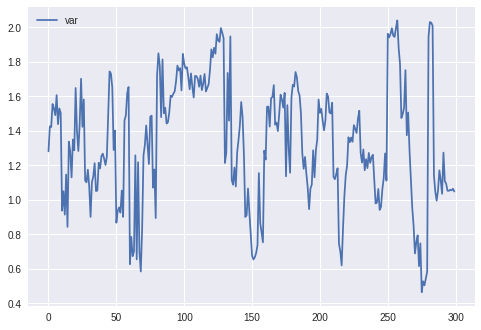

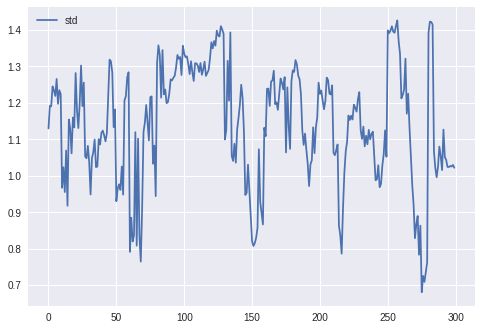

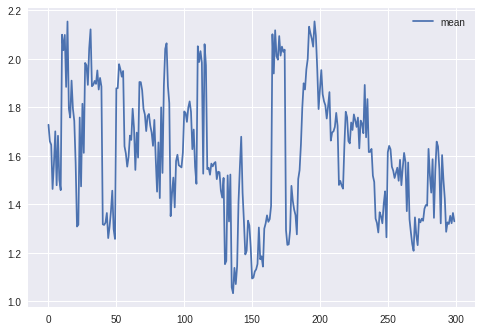

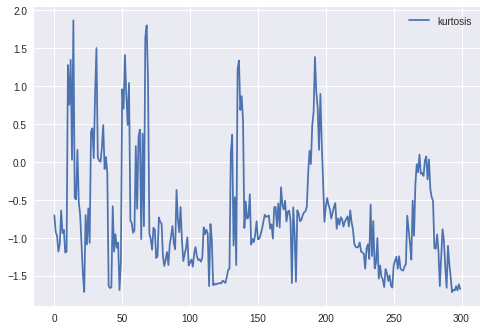

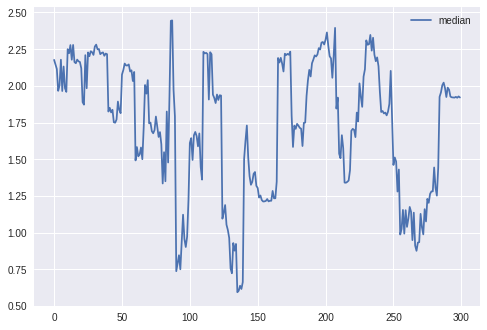

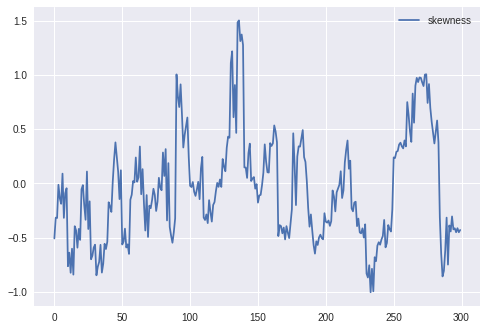

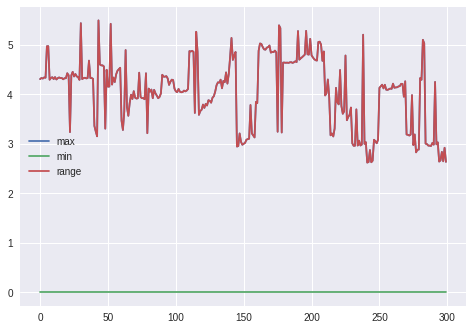

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R01S")
plot_room_stats("1SY", "R01S")

-------------------  HOUSE-ROOM: 1SY R02C


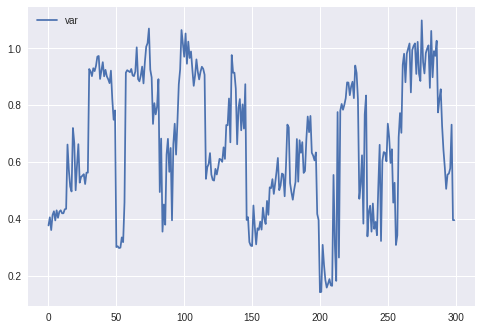

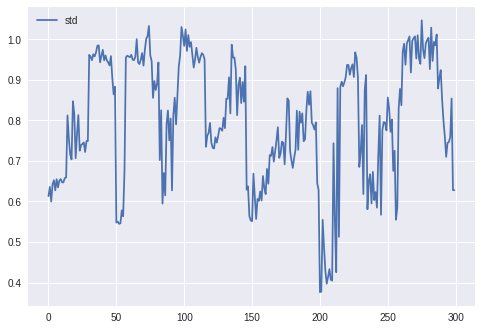

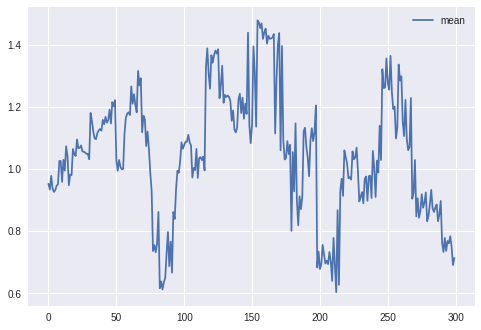

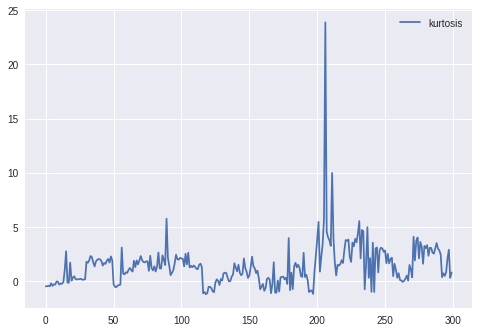

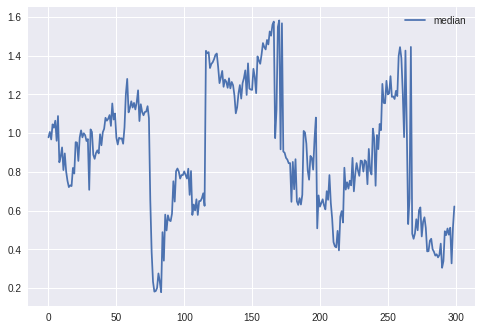

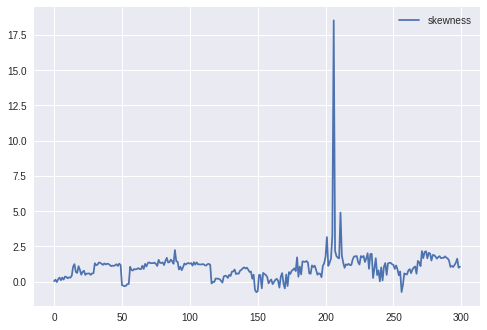

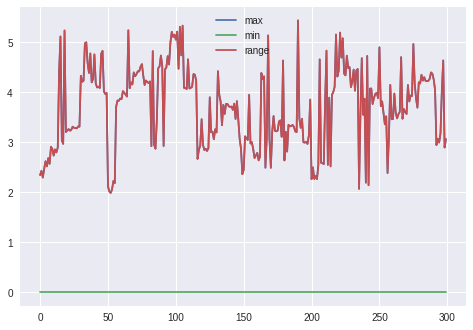

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R02C")
plot_room_stats("1SY", "R02C")

-------------------  HOUSE-ROOM: 1SY R03H


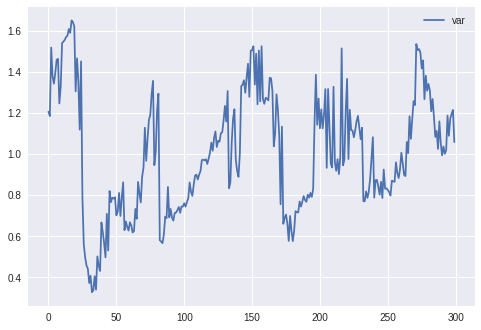

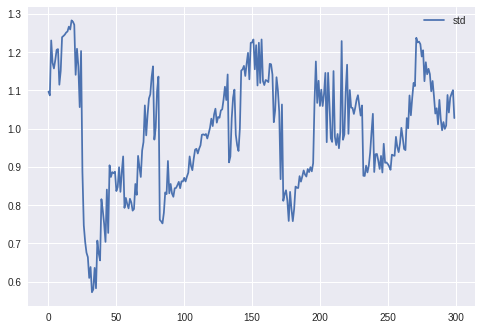

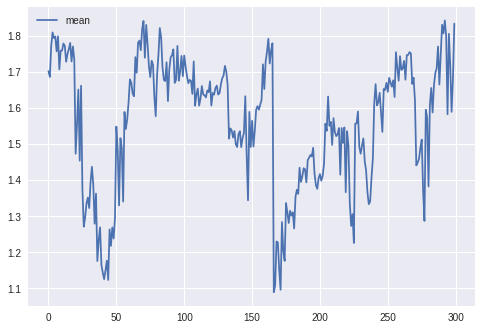

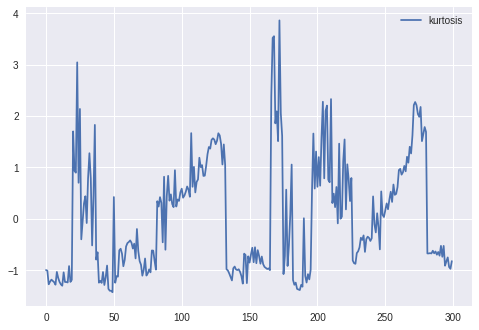

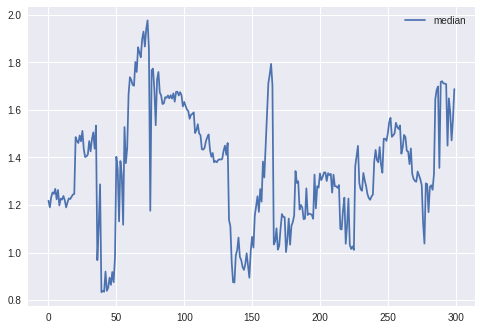

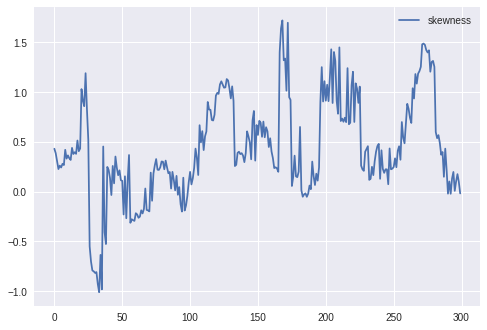

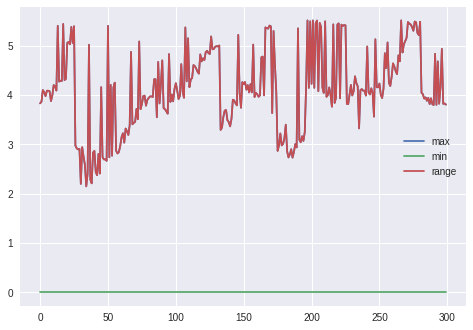

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R03H")
plot_room_stats("1SY", "R03H")

-------------------  HOUSE-ROOM: 1SY R04P


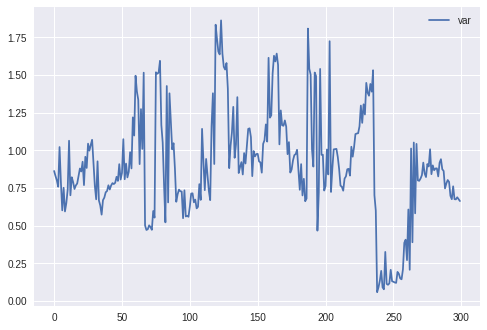

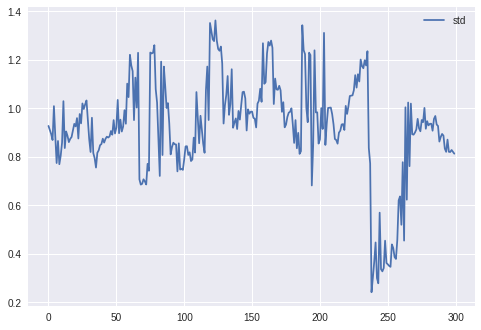

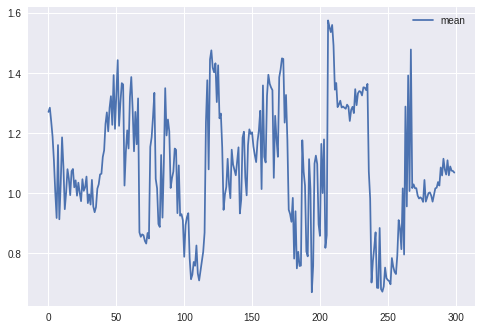

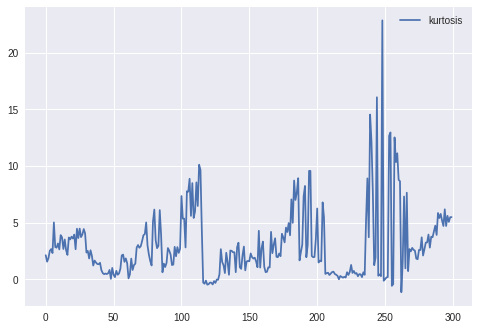

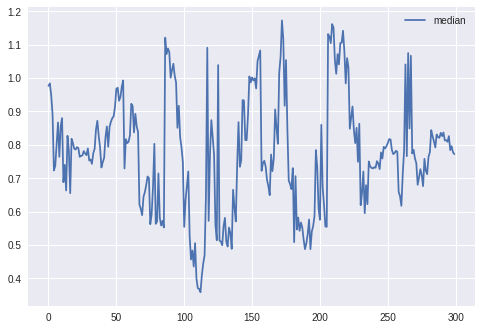

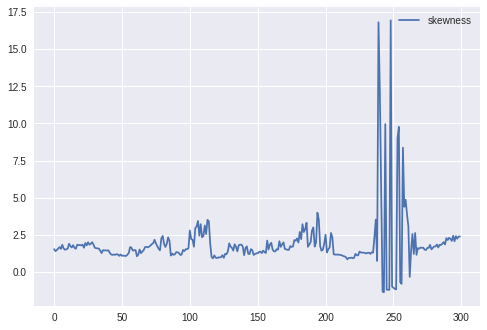

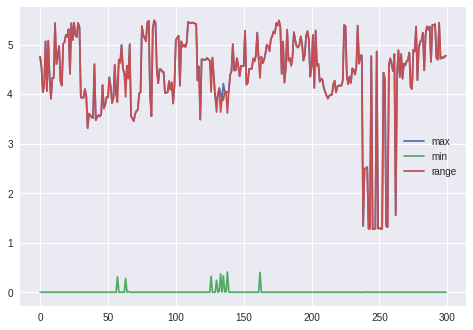

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R04P")
plot_room_stats("1SY", "R04P")

-------------------  HOUSE-ROOM: 1SY R05D


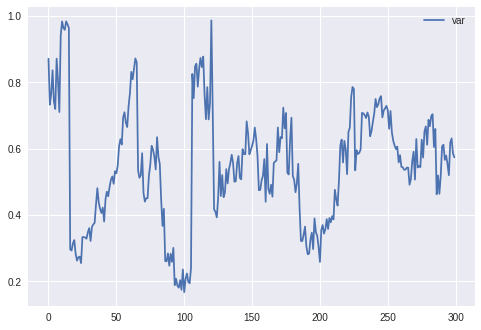

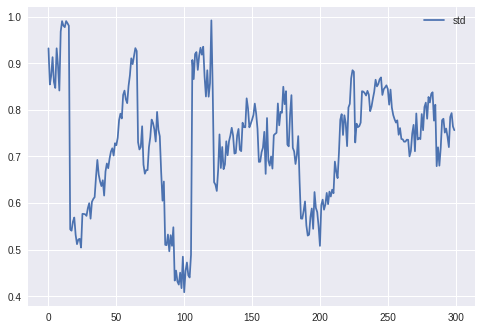

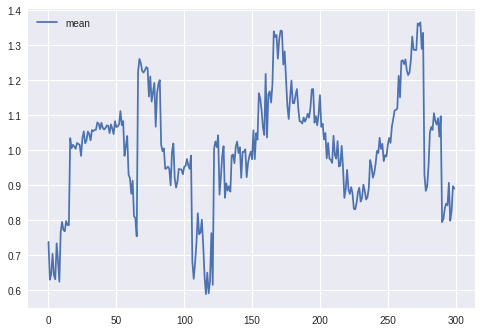

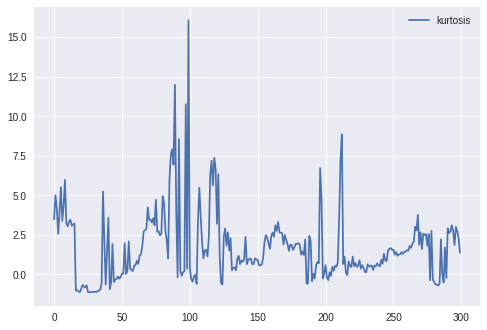

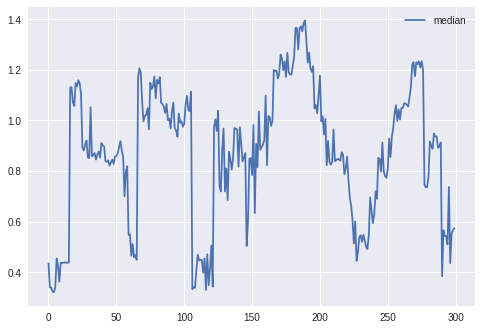

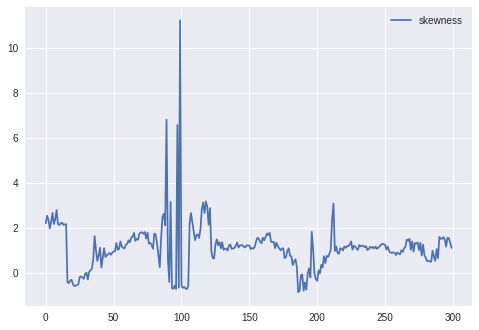

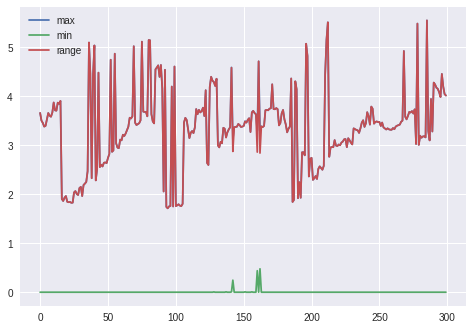

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R05D")
plot_room_stats("1SY", "R05D")

-------------------  HOUSE-ROOM: 1SY R06B


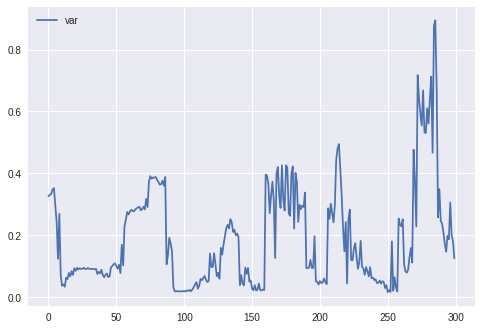

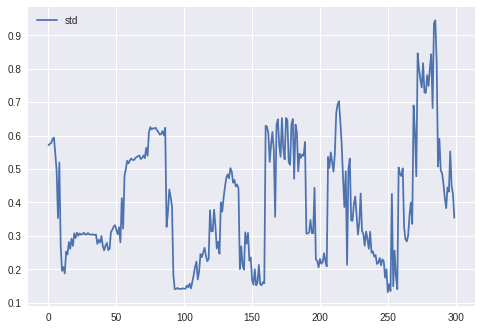

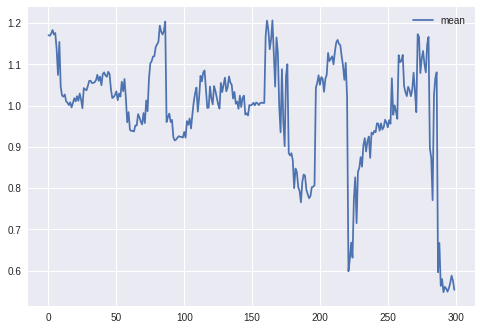

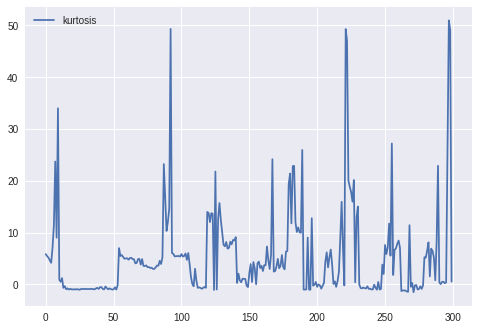

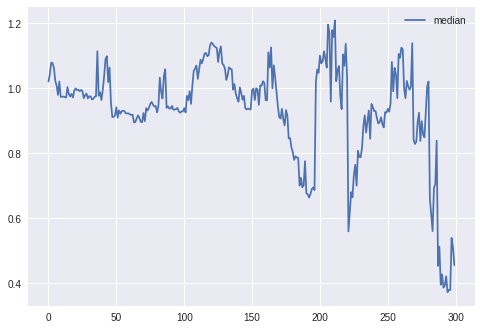

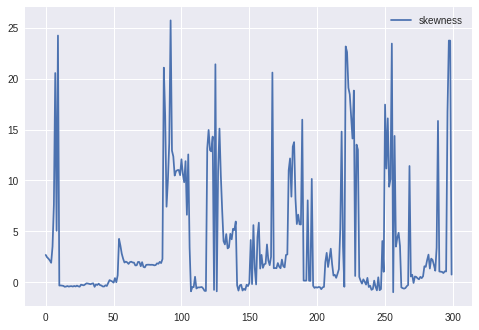

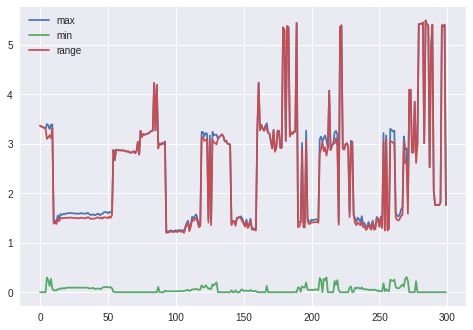

In [0]:
print("-------------------  HOUSE-ROOM:", "1SY", "R06B")
plot_room_stats("1SY", "R06B")

### HOUSE 2CA

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R01S")
plot_room_stats("2CA", "R01S")

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R02C")
plot_room_stats("2CA", "R02C")

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R03H")
plot_room_stats("2CA", "R03H")

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R04P")
plot_room_stats("2CA", "R04P")

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R05D")
plot_room_stats("2CA", "R05D")

In [0]:
print("-------------------  HOUSE-ROOM:", "2CA", "R06B")
plot_room_stats("2CA", "R06B")

### HOUSE 3ME

In [0]:
house_print = "3ME"
print("-------------------  HOUSE-ROOM:", house_print, "R01S")
plot_room_stats(house_print, "R01S")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R02C")
plot_room_stats(house_print, "R02C")

In [0]:
print("-------------------  HOUSE-ROOM:",house_print, "R03H")
plot_room_stats(house_print, "R03H")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R04P")
plot_room_stats(house_print, "R04P")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R05D")
plot_room_stats(house_print, "R05D")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R06B")
plot_room_stats(house_print, "R06B")

### HOUSE 4TR

In [0]:
house_print = "4TR"
print("-------------------  HOUSE-ROOM:", house_print, "R01S")
plot_room_stats(house_print, "R01S")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R02C")
plot_room_stats(house_print, "R02C")

In [0]:
print("-------------------  HOUSE-ROOM:",house_print, "R03H")
plot_room_stats(house_print, "R03H")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R04P")
plot_room_stats(house_print, "R04P")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R05D")
plot_room_stats(house_print, "R05D")

In [0]:
print("-------------------  HOUSE-ROOM:", house_print, "R06B")
plot_room_stats(house_print, "R06B")

### PREPARE TRAINING & VALIDATION/TESTING DATASETS

In [0]:
# xy_scan_data_ALL ahora tiene todos los valores del scaner...
xy_scan_data_ALL = xy_scan_data
# xy_scan_data ahora sólo tiene los valores de las estadísticas (engineered features)...
xy_scan_data = df_measurements

In [0]:
xy_scan_data.head()

,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
# STEP 11b. Prepare the INPUT (Sample) Vectors x_scans (for classification)
x_scans = df_measurements
x_scans.columns.values[0] = "room_ID"
x_scans.head()

,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = x_scans.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

7195    R06B
7196    R06B
7197    R06B
7198    R06B
7199    R06B
Name: room_ID, dtype: object

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)

# Use a test-split (of 30% of the items)
test_split = math.floor(len(xy_scan_data)*0.3)

# Test set with 30% of items
x_scans_test = x_scans.loc[random_indices[0:test_split]]
y_rooms_test = y_rooms.loc[random_indices[0:test_split]]

# Train set with 70% of the items.
x_scans_train = x_scans.loc[random_indices[test_split:]]
y_rooms_train = y_rooms.loc[random_indices[test_split:]]


print("Total: " + str(len(x_scans)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 7200
---------------------------------------
Train TOTAL: 5040
---------------------------------------
Test TOTAL: 2160


In [0]:
print("test:")
y_rooms_test = pd.DataFrame(y_rooms_test)
y_test_total = len(y_rooms_test)
y_rooms_test.groupby("room_ID").agg({"room_ID" : lambda x: x.count()})

test:


,room_ID
room_ID,
R01S,382
R02C,340
R03H,376
R04P,364
R05D,351
R06B,347


In [0]:
print("training:")
y_train_total = len(y_rooms_train)
y_rooms_train = pd.DataFrame(y_rooms_train)
y_rooms_train.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_train_total})

training:


,room_ID
room_ID,
R01S,0.162302
R02C,0.170635
R03H,0.163492
R04P,0.165873
R05D,0.168452
R06B,0.169246


In [0]:
print("TOTAL:")
y_total = len(y_rooms)
y_rooms = pd.DataFrame(y_rooms)
y_rooms.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_total})

TOTAL:


,room_ID
room_ID,
R01S,0.166667
R02C,0.166667
R03H,0.166667
R04P,0.166667
R05D,0.166667
R06B,0.166667


### PREPARING A MIXED DATASET TO BE SAVED

In [0]:
df_test_SY.head()

,Unnamed: 0,44,45,46,47,48,49,50,51,52,...,718,719,720,721,722,723,724,725,room_ID,house_ID
0,0,2.277,2.277,2.262,2.243,2.234,2.231,2.225,2.214,2.208,...,2.152,2.151,2.150,2.150,2.151,2.152,2.152,2.152,R01S,1SY
1,1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.294,2.291,2.288,2.288,2.274,2.273,2.271,2.269,R01S,1SY
2,2,1.983,1.983,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.169,2.147,2.146,2.127,2.126,2.115,2.113,2.113,R01S,1SY
3,3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,R01S,1SY
4,4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.976,1.973,...,2.294,2.286,2.283,2.272,2.263,2.257,2.256,2.253,R01S,1SY


In [0]:
xy_scan_data2 = df_test_SY

In [0]:
# STEP: COPY-PREPARE WORKING DATASET (XY_SCAN_DATA)
xy_scan_data = xy_scan_data2

In [0]:
xy_scan_data2.shape

(1800, 685)

In [0]:
xy_scan_data2.head()

,Unnamed: 0,44,45,46,47,48,49,50,51,52,...,718,719,720,721,722,723,724,725,room_ID,house_ID
0,0,2.277,2.277,2.262,2.243,2.234,2.231,2.225,2.214,2.208,...,2.152,2.151,2.150,2.150,2.151,2.152,2.152,2.152,R01S,1SY
1,1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.294,2.291,2.288,2.288,2.274,2.273,2.271,2.269,R01S,1SY
2,2,1.983,1.983,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.169,2.147,2.146,2.127,2.126,2.115,2.113,2.113,R01S,1SY
3,3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,R01S,1SY
4,4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.976,1.973,...,2.294,2.286,2.283,2.272,2.263,2.257,2.256,2.253,R01S,1SY


In [0]:
xy_scan_data.shape

(1800, 685)

In [0]:
del df_test_SY

In [0]:
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_190105-CA.txt'

# Creamos un data frame y cargamos los datos del fichero
df_test_JR = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))


# define a function for the values of the new column
df_test_JR = df_test_JR.assign(house_ID="2CA") # assign values to new column


# Append/update the x data
xy_scan_data =  pd.concat([xy_scan_data, df_test_JR], ignore_index=True)


In [0]:
xy_scan_data.shape

(3600, 685)

In [0]:
xy_scan_data.tail()

In [0]:
del df_test_JR

In [0]:
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_190122-ME.txt'

# Creamos un data frame y cargamos los datos del fichero
df_test_CD = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))


# define a function for the values of the new column
df_test_CD = df_test_CD.assign(house_ID="3ME") # assign values to new column


# Append/update the x data
xy_scan_data =  pd.concat([xy_scan_data, df_test_CD], ignore_index=True)


In [0]:
xy_scan_data.shape

(5400, 685)

In [0]:
xy_scan_data.tail()

In [0]:
del df_test_CD

In [0]:
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_190123-TR.txt'

# Creamos un data frame y cargamos los datos del fichero
df_test_ID = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))


# define a function for the values of the new column
df_test_ID = df_test_ID.assign(house_ID="4TR") # assign values to new column


# Append/update the x data
xy_scan_data =  pd.concat([xy_scan_data, df_test_ID], ignore_index=True)


In [0]:
xy_scan_data.shape

(7200, 685)

In [0]:
xy_scan_data.tail()

In [0]:
del df_test_ID

In [0]:
# STEP 7: SAVE DATASET TO EXTERNAL FILE
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_ALL_190209.txt'
xy_scan_data.to_csv(my_data_file_name, mode='a')

In [0]:
import numpy as np

In [0]:
df_measurements = xy_scan_data[xy_scan_data.columns[1:683]]

In [0]:
df_measurements.tail()

,44,45,46,47,48,49,50,51,52,53,...,716,717,718,719,720,721,722,723,724,725
5395,0.429,0.416,0.416,0.413,0.416,0.417,0.420,0.420,0.421,0.000,...,1.139,1.141,1.140,1.139,1.140,1.141,1.141,1.141,1.147,1.149
5396,0.444,0.444,0.444,0.444,0.447,0.447,3.209,3.231,3.231,3.231,...,1.215,1.211,1.211,1.211,1.211,1.211,1.211,1.207,1.020,0.994
5397,0.384,0.387,0.391,0.387,0.387,0.403,0.407,0.000,0.000,0.000,...,0.660,0.660,0.657,0.654,0.650,0.646,0.632,0.632,0.632,0.635
5398,1.695,1.682,1.668,1.666,1.665,1.666,1.656,1.655,1.655,1.668,...,1.438,1.473,1.473,1.473,1.473,1.461,1.454,1.449,1.449,1.448
5399,2.458,2.450,2.447,2.438,2.424,2.420,2.410,2.401,2.390,2.385,...,0.556,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [0]:
df_measurements['var'] = df_measurements.var(axis=1)
df_measurements['mean'] = df_measurements.mean(axis=1)
df_measurements['std'] = df_measurements.std(axis=1)
df_measurements['median'] = df_measurements.median(axis=1)
df_measurements['max'] = df_measurements.max(axis=1)
df_measurements['min'] = df_measurements.min(axis=1)
df_measurements['range'] = df_measurements['max']-df_measurements['min']
df_measurements['kurtosis'] = df_measurements.kurtosis(axis=1)
df_measurements['skewness'] = df_measurements.skew(axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [0]:
df_room_house = xy_scan_data[xy_scan_data.columns[683:685]]

In [0]:
df_room_house.tail()

In [0]:
# Append/update the x data
df_measurements =  pd.concat([df_room_house, df_measurements], axis=1)


In [0]:
df_measurements.shape

(7200, 11)

In [0]:
# STEP 7: SAVE DATASET TO EXTERNAL FILE
my_data_file_name = DIR_SCANS_MODELS + '0_Unified_ONLY_FEATURES_190209.txt'
df_measurements.to_csv(my_data_file_name, mode='a')

In [0]:
df_measurements.drop(list(df_measurements)[2:3], axis=1, inplace=True)


In [0]:
df_measurements.head()

,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
xy_scan_data =  df_measurements

In [0]:
# STEP 10: Prepare FEATURES

xy_scan_data['var'] = xy_scan_data.var(axis=1)
xy_scan_data['mean'] = xy_scan_data.mean(axis=1)
xy_scan_data['std'] = xy_scan_data.std(axis=1)
xy_scan_data['median'] = xy_scan_data.median(axis=1)
xy_scan_data['max'] = xy_scan_data.max(axis=1)
xy_scan_data['min'] = xy_scan_data.min(axis=1)
xy_scan_data['range'] = xy_scan_data['max']-xy_scan_data['min']
xy_scan_data['kurtosis'] = xy_scan_data.kurtosis(axis=1)
xy_scan_data['skewness'] = xy_scan_data.skew(axis=1)

In [0]:
# STEP : READ DATASET FROM EXTERNAL FILE
# We work with the prepared file, which is based on the previous dataset
import pandas as pd

my_data_file_name = DIR_SCANS_MODELS + '0_Unified_SCANS_190104-SY.txt'

# Creamos un data frame y cargamos los datos del fichero
df_test_SY = pd.DataFrame(pd.read_csv(my_data_file_name, sep = ','))

df_test_SY.columns.values[683] = "room_ID"

# define a function for the values of the new column
df_test_SY = df_test_SY.assign(house_ID="1SY") # assign values to new column

# 02 Define and train SVM (Linear & RBF) and KNN models

## 2.1 Define and train a SVM/linear SVC Classifier

In [0]:
import numpy as np
# Here we use LinearSVC
from sklearn.svm import LinearSVC

# define the classifier
clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 1.087 -0.88  -0.36   1.144 -0.069 -0.339  0.269  0.089 -0.504]
 [-2.277 -0.696  3.647  0.085 -0.458 -0.93   0.473 -0.021  0.009]
 [-1.195  2.446  1.97  -1.129 -0.272 -0.459  0.187 -0.045  0.078]
 [-0.814 -0.432  1.765 -0.482  0.974  1.76  -0.786 -0.057  0.09 ]
 [-2.282 -0.211  4.455 -0.208 -0.488 -0.748  0.26   0.195 -0.363]
 [ 2.334  0.564 -6.369 -0.536  0.078  0.048  0.029 -0.062  0.088]]
[-1.927 -1.247 -2.924 -1.32  -1.211  2.258]


In [0]:
import sklearn
sklearn.__version__

'0.20.2'

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_ALL.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_ALL.joblib', 'rb')
room_teller_SVM = pickle.load(save) 

In [0]:
print(room_teller_SVM)

LinearSVC(C=1.0, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=0, tol=1e-08, verbose=0)


In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM.predict(X_test)
print(predictions_SVC)

['R04P' 'R06B' 'R06B' ... 'R05D' 'R03H' 'R05D']


In [0]:
score = room_teller_SVM.score(X_test, y_rooms_test)

In [0]:
score

0.5185185185185185

In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[251  16  72  29   6   8]
 [  6  91  42  77  65  59]
 [ 72   6 216  60  15   7]
 [ 33  48  48 167  52  16]
 [ 12  60  31  62 128  58]
 [ 13  43   2   6  16 267]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.657 0.042 0.188 0.076 0.016 0.021]
 [0.018 0.268 0.124 0.226 0.191 0.174]
 [0.191 0.016 0.574 0.16  0.04  0.019]
 [0.091 0.132 0.132 0.459 0.143 0.044]
 [0.034 0.171 0.088 0.177 0.365 0.165]
 [0.037 0.124 0.006 0.017 0.046 0.769]]
-----------------------------


## 2.1 Define and train a SVM/SVC with RBF Classifier

In [0]:
import numpy as np
# Here we use SVC
from sklearn.svm import SVC

# define the classifier
clf = SVC(gamma=2, C=1)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
#print(clf.coef_)
print(clf.intercept_)

[-0.298 -0.144 -0.296 -0.45  -0.436  0.13   0.014 -0.285 -0.267 -0.136
 -0.327 -0.37  -0.256 -0.316 -0.058]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_ALL.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_ALL.joblib', 'rb')
room_teller_SVM_RBF = pickle.load(save) 

In [0]:
print(room_teller_SVM_RBF)

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC_RBF = room_teller_SVM_RBF.predict(X_test)
print(predictions_SVC_RBF)

['R02C' 'R05D' 'R06B' ... 'R05D' 'R04P' 'R05D']


In [0]:
score = room_teller_SVM_RBF.score(X_test, y_rooms_test)

In [0]:
score

0.7527777777777778

In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC_RBF, labels = room_teller_SVM_RBF.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_RBF.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[284  20  34  37   5   2]
 [ 10 237   4  38  30  21]
 [ 18  14 301  17  18   8]
 [ 21  33   5 267  27  11]
 [  1  52  13  19 247  19]
 [  2  19   7  14  15 290]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.743 0.052 0.089 0.097 0.013 0.005]
 [0.029 0.697 0.012 0.112 0.088 0.062]
 [0.048 0.037 0.801 0.045 0.048 0.021]
 [0.058 0.091 0.014 0.734 0.074 0.03 ]
 [0.003 0.148 0.037 0.054 0.704 0.054]
 [0.006 0.055 0.02  0.04  0.043 0.836]]
-----------------------------


## 2.2 Define and train a K-Neighbors Classifiers
Below we use KNeighborsClassifier from sklearn.neighbors, experimenting with various parameter settings. For clarity and simplicity here only two model configuration are included.

### 2.2-A) K-Neighbors Classifier (KNN model)

In [0]:

from sklearn.neighbors import KNeighborsClassifier

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()


# Create the knn model.
# Look at the five closest neighbors.
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X,y)
# Make point predictions on the test set using the fit model.
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_KNN = knn.predict(X_test)

print(predictions_KNN)

['R02C' 'R06B' 'R06B' ... 'R03H' 'R01S' 'R05D']


In [0]:
rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_KNN, knn.classes_)
print("Confusion Matrix:")
print("-----------------")
print(knn.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[297  15  32  26   3   9]
 [ 12 235   4  43  23  23]
 [ 15  12 316  12  17   4]
 [ 24  33  10 261  25  11]
 [  8  38  11  17 265  12]
 [  3  15   6  16  11 296]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.777 0.039 0.084 0.068 0.008 0.024]
 [0.035 0.691 0.012 0.126 0.068 0.068]
 [0.04  0.032 0.84  0.032 0.045 0.011]
 [0.066 0.091 0.027 0.717 0.069 0.03 ]
 [0.023 0.108 0.031 0.048 0.755 0.034]
 [0.009 0.043 0.017 0.046 0.032 0.853]]
-----------------------------


In [0]:
score = knn.score(X_test, y_rooms_test)
print(score)

0.7731481481481481


In [0]:
from sklearn.model_selection import cross_val_score


In [0]:
scores = cross_val_score(knn, X_test, y_rooms_test, cv=10, scoring='accuracy')
print(scores)

[0.616 0.697 0.622 0.659 0.657 0.593 0.651 0.631 0.598 0.579]


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:528: DataConversionWarning: A column-vector y was passed when

In [0]:
print(scores.mean())

0.6304366059020757


In [0]:
# This function allows us to save the model...
import pickle
save=open(ROS_DIRECTORY + 'room_teller_KNN_ALL.joblib', 'wb')
pickle.dump(knn, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED KNN MODEL
import pickle
save=open(ROS_DIRECTORY + 'room_teller_KNN_ALL.joblib', 'rb')
room_teller_KNN= pickle.load(save) 

In [0]:
# Lets see the model we saved & loaded...
print(room_teller_KNN)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')


#### Sensitivity, Specificity, Precision and Accuracy

# 03 Define and train Neural Network models

## 3.1 Define and train a NEURAL NETWORK (using engineered FEATURES)

In [0]:

from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

Using TensorFlow backend.


In [0]:
df_SCAN_FEATURES_ALL.head()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
xy_scan_data = df_SCAN_FEATURES_ALL
xy_scan_data.shape

(7200, 12)

In [0]:
del df_SCAN_FEATURES_ALL

In [0]:
# STEP 11b. Prepare the INPUT (Sample) Vectors x_scans (for classification)
x_scans = xy_scan_data
x_scans.head()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = x_scans.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

7195    R06B
7196    R06B
7197    R06B
7198    R06B
7199    R06B
Name: room_ID, dtype: object

#### PREPARE & SPLIT DATASET INTO 70-20-10%

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)


# Use a train-val-test-split (of 70-20-10% of the items)
train_split = math.floor(len(xy_scan_data)*0.7)
val_split = math.floor(len(xy_scan_data)*0.9)

# Train set with 70% of the items.
x_scans_train = x_scans.loc[random_indices[0:train_split]]
y_rooms_train = y_rooms.loc[random_indices[0:train_split]]

# VAL set with 20% of items
x_scans_val = x_scans.loc[random_indices[train_split:val_split]]
y_rooms_val = y_rooms.loc[random_indices[train_split:val_split]]

x_scans_test = x_scans.loc[random_indices[val_split:]]
y_rooms_test = y_rooms.loc[random_indices[val_split:]]



print("Total: " + str(len(x_scans)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Val TOTAL: "+ str(len(x_scans_val)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 7200
---------------------------------------
Train TOTAL: 5040
---------------------------------------
Val TOTAL: 1440
---------------------------------------
Test TOTAL: 720


#### ENCODING the output (ROOM codes)

In [0]:
import numpy as np

y_train = np.array(y_rooms_train)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_train)
encoded_Y = encoder.transform(y_train)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_train = np_utils.to_categorical(encoded_Y)

In [0]:
y_val = np.array(y_rooms_val)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_val)
encoded_Y = encoder.transform(y_val)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_val = np_utils.to_categorical(encoded_Y)

In [0]:
y_rooms_val

In [0]:
encoded_y_val

array([[0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.]], dtype=float32)

In [0]:
y_test = np.array(y_rooms_test)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_test)
encoded_Y = encoder.transform(y_test)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_test = np_utils.to_categorical(encoded_Y)

In [0]:
encoded_y_val

array([[0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.]], dtype=float32)

### Define and train the neural network

In [0]:
# Import TensorFlow & tf.keras
import tensorflow as tf
from tensorflow import keras

# The columns that we will be making predictions with...
x_columns = ['var','mean','std','median','max','min','range','kurtosis','skewness']

# The column that we want to predict.
y_column = ["Room_ID"]


# importamos las capas de BatchNormalization
from tensorflow.keras.layers import BatchNormalization

# Define the neural network
my_model_NN = keras.Sequential([
    # Define the layers
    keras.layers.Dense(128, input_shape=(len(x_columns),), activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(512, activation=tf.nn.relu),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(64, activation=tf.nn.relu),
    keras.layers.BatchNormalization(),
    # output layer has 6 units (neurons) considering six categories: each type of room
    keras.layers.Dense(6, activation=tf.nn.softmax)
])


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
my_model_NN.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               1280      
_________________________________________________________________
batch_normalization_v1 (Batc (None, 128)               512       
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               66048     
_________________________________________________________________
batch_normalization_v1_1 (Ba (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
__________

In [0]:
# compile the model
my_model_NN.compile(optimizer='sgd', 
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [0]:
from sklearn.preprocessing import MinMaxScaler

import numpy as np

x_train = x_scans_train[x_columns]
x_val = x_scans_val[x_columns]
x_test = x_scans_test[x_columns]

scaler = MinMaxScaler()
scaler.fit(x_train)
scaled_Series = scaler.transform(x_train)
scaled_x_train = pd.DataFrame(scaled_Series)
scaled_x_train.columns = x_train.columns
x_train = scaled_x_train
x_train.describe()


,var,mean,std,median,max,min,range,kurtosis,skewness
count,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000
mean,0.349407,0.390117,0.524620,0.366522,0.618196,0.024531,0.618680,0.036041,0.096859
std,0.207212,0.183860,0.200681,0.174148,0.246727,0.114486,0.247561,0.037639,0.072673
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.184629,0.254894,0.382598,0.241763,0.448047,0.000000,0.444825,0.013306,0.063801
50%,0.325757,0.348148,0.534251,0.337398,0.664206,0.000000,0.665115,0.026611,0.088761
75%,0.478547,0.515551,0.665043,0.457852,0.818817,0.000000,0.820163,0.045768,0.109499
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
scaler = MinMaxScaler()
scaler.fit(x_val)
scaled_Series = scaler.transform(x_val)
scaled_x_val = pd.DataFrame(scaled_Series)
scaled_x_val.columns = x_val.columns
x_val = scaled_x_val
x_val.describe()

,var,mean,std,median,max,min,range,kurtosis,skewness
count,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000
mean,0.363363,0.412159,0.549102,0.360815,0.659500,0.020948,0.657999,0.068433,0.100382
std,0.206827,0.183209,0.192055,0.175399,0.223529,0.103537,0.225524,0.076435,0.086053
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.201280,0.280106,0.415304,0.239647,0.505355,0.000000,0.497897,0.024868,0.064252
50%,0.342180,0.375612,0.559276,0.331299,0.705586,0.000000,0.705792,0.049838,0.089765
75%,0.484457,0.528278,0.677116,0.453466,0.838776,0.000000,0.839008,0.086933,0.111701
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
scaler = MinMaxScaler()
scaler.fit(x_test)
scaled_Series = scaler.transform(x_test)
scaled_x_test = pd.DataFrame(scaled_Series)
scaled_x_test.columns = x_test.columns
x_test = scaled_x_test
x_test.describe()

,var,mean,std,median,max,min,range,kurtosis,skewness
count,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000
mean,0.360277,0.413500,0.529261,0.369409,0.608086,0.021117,0.609724,0.087104,0.098955
std,0.217028,0.190134,0.207751,0.173103,0.256524,0.104459,0.256589,0.094080,0.090213
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.192150,0.272331,0.386951,0.249346,0.445175,0.000000,0.445280,0.028650,0.059621
50%,0.334054,0.365635,0.537878,0.340017,0.640409,0.000000,0.639417,0.062205,0.087536
75%,0.489109,0.546101,0.670359,0.454010,0.832355,0.000000,0.833846,0.107829,0.108529
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
import numpy as np


# train the model a number of epochs
history = my_model_NN.fit(x_train, encoded_y_train, epochs=150, batch_size=250, 
                          validation_data=(x_val, encoded_y_val),) # using X_val/y_val for validation

Train on 5040 samples, validate on 1440 samples
Epoch 1/150
5040/5040 [==============================] - 0s 63us/sample - loss: 0.3872 - acc: 0.8396 - val_loss: 0.7842 - val_acc: 0.7525
Epoch 2/150
5040/5040 [==============================] - 0s 60us/sample - loss: 0.3698 - acc: 0.8428 - val_loss: 0.7539 - val_acc: 0.7546
Epoch 3/150
5040/5040 [==============================] - 0s 60us/sample - loss: 0.3540 - acc: 0.8471 - val_loss: 0.7125 - val_acc: 0.7596
Epoch 4/150
5040/5040 [==============================] - 0s 60us/sample - loss: 0.3466 - acc: 0.8470 - val_loss: 0.6695 - val_acc: 0.7613
Epoch 5/150
5040/5040 [==============================] - 0s 59us/sample - loss: 0.3378 - acc: 0.8497 - val_loss: 0.6209 - val_acc: 0.7616
Epoch 6/150
5040/5040 [==============================] - 0s 60us/sample - loss: 0.3323 - acc: 0.8536 - val_loss: 0.5688 - val_acc: 0.7678
Epoch 7/150
5040/5040 [==============================] - 0s 60us/sample - loss: 0.3325 - acc: 0.8535 - val_loss: 0.5210 - va

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               1280      
_________________________________________________________________
batch_normalization_v1 (Batc (None, 128)               512       
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               66048     
_________________________________________________________________
batch_normalization_v1_1 (Ba (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
__________

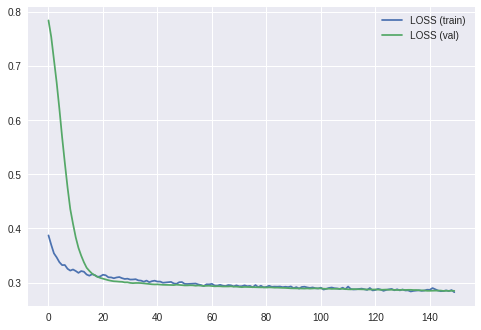

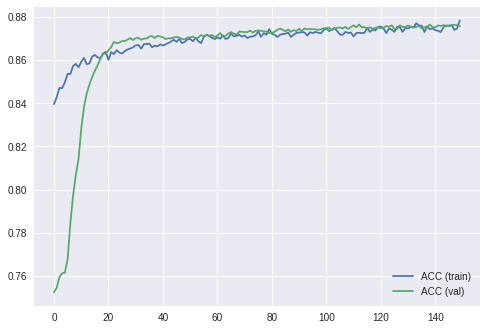

In [0]:
import matplotlib.pyplot as plt

my_model_NN.summary()

# plot history
plt.plot(history.history['loss'], label='LOSS (train)')
plt.plot(history.history['val_loss'], label='LOSS (val)')
plt.legend()
plt.show()

# plot history
plt.plot(history.history['acc'], label='ACC (train)')
plt.plot(history.history['val_acc'], label='ACC (val)')
plt.legend()
plt.show()

#### Classify the rooms using the Neural Network

In [0]:
# let's predict/classify using our NN
#x_test = x_scans_test[x_columns]
pred_y = my_model_NN.predict(x_test)

In [0]:
pred_y

array([[8.923e-03, 1.851e-01, 4.772e-02, 4.214e-01, 3.204e-01, 1.654e-02],
       [7.356e-02, 7.027e-03, 9.083e-01, 1.007e-04, 9.872e-03, 1.091e-03],
       [5.257e-02, 2.860e-01, 4.481e-02, 5.261e-01, 7.755e-02, 1.300e-02],
       ...,
       [5.924e-03, 2.836e-01, 3.840e-03, 3.293e-02, 5.960e-02, 6.142e-01],
       [3.586e-01, 1.304e-02, 1.155e-01, 4.942e-01, 1.003e-02, 8.671e-03],
       [1.074e-01, 2.296e-01, 6.011e-02, 1.397e-02, 2.450e-01, 3.439e-01]],
      dtype=float32)

In [0]:
print(np.argmax(pred_y, axis=1))

[4 0 0 4 0 4 4 0 4 4 0 4 0 0 4 4 0 4 0 0 0 0 4 0 0 0 2 0 0 4 0 0 0 4 0 0 0
 0 0 2 2 0 4 0 0 0 0 4 0 0 4 0 0 0 0 0 0 0 0 0 0 4 0 0 0 0 0 0 4 0 0 0 0 0
 0 0 0 0 4 0 0 4 0 4 0 2 4 4 0 0 0 4 0 4 0 0 4 0 0 0 4 0 3 4 4 0 4 0 4 0 0
 4 0 0 0 0 4 0 0 0 4 2 4 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 0 0 0 0 0 0 0 4
 0 0 0 0 0 4 4 0 2 4 0 0 0 4 0 0 0 4 0 0 4 2 0 4 4 0 0 0 0 0 0 0 0 0 4 3 0
 0 0 0 4 4 4 0 0 0 0 4 0 4 0 0 0 0 0 0 4 0 0 0 4 0 0 4 0 0 4 0 0 0 0 0 0 0
 2 0 4 0 4 4 3 0 0 0 0 4 0 0 0 0 0 0 4 4 0 0 2 4 0 0 0 0 0 0 4 0 0 0 4 0 0
 0 0 4 0 4 0 0 0 0 0 4 0 4 4 4 4 0 0 4 0 0 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0 4
 4 0 3 4 4 0 0 0 0 0 0 0 0 0 0 4 0 0 4 4 0 0 0 0 4 4 4 0 4 0 4 4 4 0 4 0 0
 0 4 0 0 0 3 4 0 4 0 0 0 0 0 0 0 0 0 0 0 0 4 0 0 0 0 0 0 0 4 0 0 0 4 4 4 0
 0 0 4 0 0 0 0 0 4 4 0 0 0 0 0 0 4 0 0 4 4 0 0 0 0 4 0 4 4 0 4 0 0 0 4 0 4
 0 4 0 4 0 0 0 0 4 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 4 0 0 0 3 4 0 0 0 0
 0 0 0 0 0 4 0 0 0 4 0 0 4 4 4 0 0 0 0 4 0 0 0 0 0 4 0 0 4 0 0 4 0 0 0 0 4
 4 0 0 4 0 4 0 0 4 0 4 0 

In [0]:
print(np.argmax(encoded_y_test, axis=1))

[3 4 1 1 5 1 3 2 3 1 4 5 0 2 3 3 2 1 4 0 4 2 4 2 4 1 5 3 4 1 5 0 2 5 2 4 0
 2 0 4 5 0 1 2 0 0 4 1 5 5 1 3 0 0 2 2 4 5 0 3 2 5 0 3 0 1 0 1 4 1 2 4 1 0
 3 0 2 2 4 0 2 3 5 4 3 5 5 1 3 2 2 4 2 1 3 2 4 3 0 5 2 5 5 5 1 3 5 2 4 5 2
 4 1 0 2 0 5 0 0 0 4 2 1 3 4 2 5 0 3 0 0 2 0 4 5 2 1 4 3 5 1 3 1 2 3 5 3 1
 2 0 2 0 2 5 5 2 5 4 3 2 0 4 1 0 1 5 2 5 1 5 2 1 4 5 0 0 2 5 3 3 2 4 3 4 4
 2 1 2 1 5 4 5 4 3 2 1 2 4 4 0 2 0 3 1 1 5 2 0 1 0 4 3 0 0 4 4 2 3 0 4 5 3
 5 0 1 0 5 1 1 2 3 0 4 3 3 1 0 0 4 0 4 1 0 1 3 5 3 2 0 3 2 2 4 0 2 0 5 2 1
 4 3 5 5 5 4 0 3 2 1 2 3 2 5 3 2 0 2 1 3 2 4 5 0 4 0 2 5 0 5 2 3 1 0 3 5 5
 3 1 4 5 1 2 2 1 4 0 4 5 5 3 4 3 5 0 1 4 0 1 4 2 1 5 3 4 5 2 1 1 4 2 2 1 4
 3 1 5 1 1 5 1 1 1 3 2 2 2 2 2 5 2 2 4 0 0 5 1 3 1 4 3 5 2 4 0 1 0 1 5 4 2
 5 2 1 2 5 4 1 3 3 3 2 2 0 1 2 2 3 3 5 4 3 5 0 2 0 1 2 5 4 0 4 2 0 4 4 2 5
 0 1 3 4 3 5 2 0 5 5 4 2 2 0 1 2 2 5 1 0 3 0 0 2 1 5 4 2 0 3 0 1 4 0 0 1 5
 0 2 0 5 2 1 0 0 5 1 2 5 1 4 5 2 4 4 2 4 1 1 5 5 1 3 3 1 4 3 4 3 5 2 2 4 0
 3 3 4 5 4 3 1 3 4 3 3 1 

In [0]:
# In this cells, we make the predictions and check the accuracy:

y_pred = np.argmax(pred_y, axis=1)
y_real = np.argmax(encoded_y_test, axis=1)

rooms_labels = ['R01S','R02C','R03H','R04P','R05D','R06B']

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_real, y_pred)
print("Confusion Matrix:")
print("-----------------")
print(rooms_labels)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B']
[[66 11 16  7  5  0]
 [ 0 52  8 16 24 13]
 [10  7 82 14 17  1]
 [11 20  3 61 13  5]
 [ 1 25 16 14 71 10]
 [ 1 11  0  5 11 93]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.629 0.105 0.152 0.067 0.048 0.   ]
 [0.    0.46  0.071 0.142 0.212 0.115]
 [0.076 0.053 0.626 0.107 0.13  0.008]
 [0.097 0.177 0.027 0.54  0.115 0.044]
 [0.007 0.182 0.117 0.102 0.518 0.073]
 [0.008 0.091 0.    0.041 0.091 0.769]]
-----------------------------


In [0]:
my_model_NN.history.history['val_acc']

[0.75254625,
 0.7546296,
 0.7596064,
 0.7613425,
 0.761574,
 0.76782393,
 0.784375,
 0.79722214,
 0.80659723,
 0.8141203,
 0.828125,
 0.83819443,
 0.84432876,
 0.8486111,
 0.8520833,
 0.8549769,
 0.8575232,
 0.86041677,
 0.8631945,
 0.8628473,
 0.8644676,
 0.8659723,
 0.86840284,
 0.8677083,
 0.86805564,
 0.8687501,
 0.86875,
 0.86944455,
 0.8701389,
 0.86921304,
 0.8701389,
 0.8702547,
 0.86932874,
 0.86990744,
 0.86990744,
 0.8708334,
 0.87106484,
 0.8701389,
 0.87118065,
 0.8708334,
 0.87048614,
 0.86967605,
 0.8700232,
 0.8700232,
 0.8703704,
 0.87071764,
 0.8703704,
 0.86967593,
 0.86956024,
 0.8703704,
 0.87048614,
 0.8708334,
 0.8700232,
 0.8703704,
 0.87152785,
 0.87106484,
 0.8715278,
 0.87118065,
 0.87152785,
 0.8706019,
 0.87129635,
 0.87245375,
 0.8707177,
 0.87118053,
 0.87222224,
 0.87291664,
 0.87222224,
 0.8717593,
 0.8731482,
 0.87303245,
 0.87291664,
 0.87291664,
 0.8736111,
 0.87268513,
 0.87349546,
 0.8736112,
 0.87349534,
 0.8732639,
 0.87314826,
 0.87245363,
 0.87

In [0]:
# This function allows us to save the model...
import pickle

save=open(ROS_DIRECTORY + 'room_teller_ANN_CD.joblib', 'wb')
pickle.dump(my_model_NN, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(ROS_DIRECTORY + 'room_teller_ANN_CD.joblib', 'rb')
room_teller_ANN= pickle.load(save) 

In [0]:
# Lets see the model we saved & loaded...
print(room_teller_KNN)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')


#### Scaling the input vector

In [0]:
x_val.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
5141,1.162030,1.936110,1.076803,2.170,4.323,0.0,4.323,-0.454483,0.023398
66,1.216990,1.592363,1.101650,1.716,3.822,0.0,3.822,-0.848686,-0.186374
1937,1.161436,0.975042,1.076144,0.582,5.394,0.0,5.394,6.765261,2.776498
1189,0.780563,1.085976,0.882278,0.836,5.396,0.0,5.396,5.855404,2.274013
7145,0.358019,1.120691,0.598183,0.912,4.993,0.0,4.993,7.144401,2.368235


In [0]:
x_train.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
6821,0.581741,1.319540,0.762126,1.199,4.576,0.0,4.576,7.828166,2.694009
5670,1.208396,1.332875,1.097670,1.430,4.937,0.0,4.937,0.673265,0.691651
3669,0.791536,1.185446,0.888508,0.905,5.028,0.0,5.028,1.866799,1.430743
5928,0.192583,0.926655,0.439100,0.912,3.100,0.0,3.100,1.752494,0.156698
1909,0.700319,0.936021,0.835673,0.726,3.311,0.0,3.311,2.185509,1.766279


In [0]:
scaled_x_train.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,0.250226,0.455700,0.458455,0.436885,0.775153,0.0,0.776893,0.098146,0.149888
1,0.527422,0.463494,0.702374,0.535730,0.857143,0.0,0.858248,0.024598,0.075976
2,0.343027,0.377325,0.550327,0.311083,0.877811,0.0,0.878756,0.036867,0.103258
3,0.078085,0.226066,0.223637,0.314078,0.439927,0.0,0.444262,0.035692,0.056230
4,0.302678,0.231540,0.511920,0.234489,0.487849,0.0,0.491813,0.040143,0.115643


In [0]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(x_train)
scaled_Series = scaler.transform(x_train)
print(scaled_Series.shape)
scaled_x_train = pd.DataFrame(scaled_Series)
scaled_x_train.columns = x_train.columns
scaled_x_train.describe()


(5040, 9)


,var,mean,std,median,max,min,range,kurtosis,skewness
count,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000,5040.000000
mean,0.349407,0.390117,0.524620,0.366522,0.618196,0.024531,0.618680,0.036041,0.096859
std,0.207212,0.183860,0.200681,0.174148,0.246727,0.114486,0.247561,0.037639,0.072673
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.184629,0.254894,0.382598,0.241763,0.448047,0.000000,0.444825,0.013306,0.063801
50%,0.325757,0.348148,0.534251,0.337398,0.664206,0.000000,0.665115,0.026611,0.088761
75%,0.478547,0.515551,0.665043,0.457852,0.818817,0.000000,0.820163,0.045768,0.109499
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
df_Scaled_3col

,var,mean,std,median,max,min,range,kurtosis,skewness
0,0.001025,0.035205,0.007630,0.304602,0.011876,0.0,0.011876,0.933355,0.856372
1,0.000041,0.021413,0.000519,0.161177,0.000032,0.0,0.000032,0.000241,0.001088
2,0.627437,0.635013,0.648887,0.275169,0.627193,0.0,0.627193,0.888894,0.577195
3,0.220952,0.343385,0.262001,0.615744,0.220443,0.0,0.220443,0.775692,0.534727
4,0.093369,0.173858,0.135209,0.323990,0.115673,0.0,0.115673,0.776392,0.521762
5,0.801292,0.792039,0.812888,0.265826,0.801162,0.0,0.801162,0.911659,0.585843
6,0.283318,0.315963,0.322233,0.047185,0.282850,0.0,0.282850,0.800780,0.544432
7,0.029759,0.052760,0.063025,0.138285,0.065045,0.0,0.065045,0.897957,0.518980
8,0.006567,0.063796,0.025161,0.381920,0.030305,0.0,0.030305,0.971328,0.556801
9,0.752414,0.831391,0.766652,0.791871,0.752252,0.0,0.752252,0.906063,0.583710


In [0]:
pred_y

array([[0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       [4.798e-17, 1.000e+00, 4.384e-21, 1.289e-25, 1.318e-18, 7.178e-19],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       ...,
       [9.111e-34, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.287e-33],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00]],
      dtype=float32)

## 3.2 Define and train a NEURAL NETWORK (with SCANs)

In [0]:

from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

Using TensorFlow backend.


In [0]:
x_scans = xy_scan_data_ALL
x_scans.head()

In [0]:
xy_scan_data_ALL.shape

(7200, 685)

In [0]:
xy_scan_data_ALL.head()

,Unnamed: 0,44,45,46,47,48,49,50,51,52,...,718,719,720,721,722,723,724,725,room_ID,house_ID
0,0,2.277,2.277,2.262,2.243,2.234,2.231,2.225,2.214,2.208,...,2.152,2.151,2.150,2.150,2.151,2.152,2.152,2.152,R01S,1SY
1,1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.294,2.291,2.288,2.288,2.274,2.273,2.271,2.269,R01S,1SY
2,2,1.983,1.983,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.169,2.147,2.146,2.127,2.126,2.115,2.113,2.113,R01S,1SY
3,3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,R01S,1SY
4,4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.976,1.973,...,2.294,2.286,2.283,2.272,2.263,2.257,2.256,2.253,R01S,1SY


#### PREPARE & SPLIT DATASET INTO 70-20-10%

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data_ALL.index)


# Use a train-val-test-split (of 70-20-10% of the items)
train_split = math.floor(len(xy_scan_data_ALL)*0.7)
val_split = math.floor(len(xy_scan_data_ALL)*0.9)

# Train set with 70% of the items.
x_scans_train = x_scans.loc[random_indices[0:train_split]]
y_rooms_train = y_rooms.loc[random_indices[0:train_split]]

# VAL set with 20% of items
x_scans_val = x_scans.loc[random_indices[train_split:val_split]]
y_rooms_val = y_rooms.loc[random_indices[train_split:val_split]]

x_scans_test = x_scans.loc[random_indices[val_split:]]
y_rooms_test = y_rooms.loc[random_indices[val_split:]]



print("Total: " + str(len(x_scans)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Val TOTAL: "+ str(len(x_scans_val)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 7200
---------------------------------------
Train TOTAL: 5040
---------------------------------------
Val TOTAL: 1440
---------------------------------------
Test TOTAL: 720


#### ENCODING the output (ROOM codes)

In [0]:
y_train = np.array(y_rooms_train)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_train)
encoded_Y = encoder.transform(y_train)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_train = np_utils.to_categorical(encoded_Y)

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [0]:
y_val = np.array(y_rooms_val)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_val)
encoded_Y = encoder.transform(y_val)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_val = np_utils.to_categorical(encoded_Y)

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [0]:
y_rooms_val

In [0]:
encoded_y_val

array([[1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 1., 0., 0.]], dtype=float32)

In [0]:
y_test = np.array(y_rooms_test)
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(y_test)
encoded_Y = encoder.transform(y_test)
# convert integers to dummy variables (i.e. one hot encoded)
encoded_y_test = np_utils.to_categorical(encoded_Y)

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [0]:
encoded_y_val

array([[0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.]], dtype=float32)

In [0]:
 x_scans_train.columns[1:683]

Index(['44', '45', '46', '47', '48', '49', '50', '51', '52', '53',
       ...
       '716', '717', '718', '719', '720', '721', '722', '723', '724', '725'],
      dtype='object', length=682)

### Define and train the neural network

In [0]:
x_columns = x_scans_train.columns[1:683]

In [0]:
x_columns

Index(['44', '45', '46', '47', '48', '49', '50', '51', '52', '53',
       ...
       '716', '717', '718', '719', '720', '721', '722', '723', '724', '725'],
      dtype='object', length=682)

In [0]:
# Import TensorFlow & tf.keras
import tensorflow as tf
from tensorflow import keras

# The columns that we will be making predictions with...
x_columns = x_scans_train.columns[1:683]

# The column that we want to predict.
y_column = ["Room_ID"]


# Define the neural network
my_model_NN = keras.Sequential([
    # Define the layers
    keras.layers.Dense(64, input_shape=(len(x_columns),), activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1028, activation=tf.nn.relu),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(128, activation=tf.nn.relu),
    # output layer has 6 units (neurons) considering six categories: each type of room
    keras.layers.Dense(6, activation=tf.nn.softmax)
])


In [0]:
my_model_NN.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 64)                43712     
_________________________________________________________________
dropout_13 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_31 (Dense)             (None, 1028)              66820     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1028)              0         
_________________________________________________________________
dense_32 (Dense)             (None, 128)               131712    
_________________________________________________________________
dense_33 (Dense)             (None, 6)                 774       
Total params: 243,018
Trainable params: 243,018
Non-trainable params: 0
_________________________________________________________________


In [0]:
# compile the model
my_model_NN.compile(optimizer='sgd', 
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [0]:
import numpy as np

x_train = x_scans_train[x_columns]
x_val = x_scans_val[x_columns]
x_test = x_scans_test[x_columns]

# train the model 100 epochs
history = my_model_NN.fit(x_train, encoded_y_train, epochs=100, batch_size=250, 
                          validation_data=(x_val, encoded_y_val),) # using X_val/y_val for validation

Train on 5040 samples, validate on 1440 samples
Epoch 1/100
5040/5040 [==============================] - 1s 175us/sample - loss: 0.4872 - acc: 0.8260 - val_loss: 0.4528 - val_acc: 0.8333
Epoch 2/100
5040/5040 [==============================] - 0s 96us/sample - loss: 0.4700 - acc: 0.8305 - val_loss: 0.4493 - val_acc: 0.8333
Epoch 3/100
5040/5040 [==============================] - 0s 93us/sample - loss: 0.4627 - acc: 0.8320 - val_loss: 0.4475 - val_acc: 0.8333
Epoch 4/100
5040/5040 [==============================] - 0s 96us/sample - loss: 0.4592 - acc: 0.8322 - val_loss: 0.4465 - val_acc: 0.8333
Epoch 5/100
5040/5040 [==============================] - 0s 95us/sample - loss: 0.4573 - acc: 0.8323 - val_loss: 0.4457 - val_acc: 0.8333
Epoch 6/100
5040/5040 [==============================] - 0s 99us/sample - loss: 0.4543 - acc: 0.8330 - val_loss: 0.4449 - val_acc: 0.8333
Epoch 7/100
5040/5040 [==============================] - 0s 97us/sample - loss: 0.4549 - acc: 0.8327 - val_loss: 0.4444 - v

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 64)                43712     
_________________________________________________________________
dropout_13 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_31 (Dense)             (None, 1028)              66820     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1028)              0         
_________________________________________________________________
dense_32 (Dense)             (None, 128)               131712    
_________________________________________________________________
dense_33 (Dense)             (None, 6)                 774       
Total params: 243,018
Trainable params: 243,018
Non-trainable params: 0
_________________________________________________________________


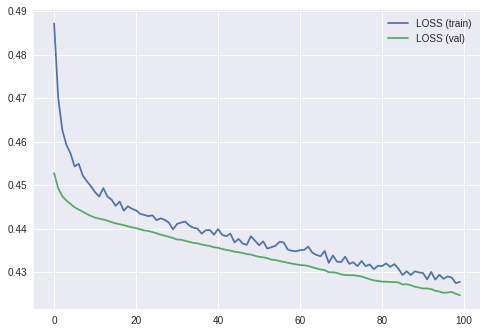

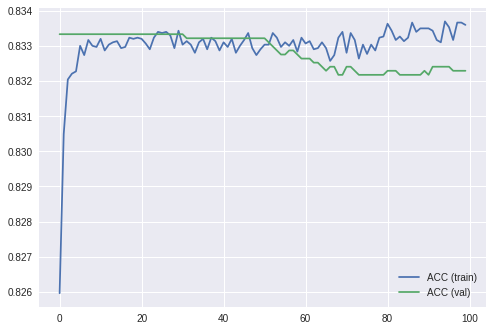

In [0]:
import matplotlib.pyplot as plt

my_model_NN.summary()

# plot history
plt.plot(history.history['loss'], label='LOSS (train)')
plt.plot(history.history['val_loss'], label='LOSS (val)')
plt.legend()
plt.show()

# plot history
plt.plot(history.history['acc'], label='ACC (train)')
plt.plot(history.history['val_acc'], label='ACC (val)')
plt.legend()
plt.show()

#### Classify the rooms using the Neural Network

In [0]:
# let's predict/classify using our NN
x_test = x_scans_test[x_columns]
pred_y = my_model_NN.predict(x_test)

In [0]:
pred_y

array([[0.154, 0.192, 0.172, 0.138, 0.176, 0.168],
       [0.148, 0.174, 0.165, 0.147, 0.178, 0.189],
       [0.213, 0.175, 0.164, 0.087, 0.157, 0.203],
       ...,
       [0.187, 0.169, 0.174, 0.218, 0.15 , 0.102],
       [0.063, 0.116, 0.187, 0.451, 0.166, 0.018],
       [0.096, 0.163, 0.18 , 0.329, 0.201, 0.031]], dtype=float32)

In [0]:
print(np.argmax(pred_y, axis=1))

[2 0 2 5 5 4 4 2 1 4 4 1 0 3 1 0 4 0 4 4 3 3 4 3 3 3 4 0 3 1 4 3 0 1 3 3 0
 2 4 0 2 0 0 2 0 0 4 0 5 3 1 0 0 3 1 0 0 0 0 2 0 0 3 1 0 3 4 3 4 2 3 0 3 0
 5 0 0 3 3 3 3 4 0 3 4 2 3 3 3 2 0 3 3 3 4 4 2 4 5 3 3 3 2 5 2 0 2 2 3 2 0
 0 0 4 2 1 1 0 0 3 5 0 2 1 2 3 4 0 0 3 3 3 0 1 0 5 0 0 0 3 0 0 4 2 3 5 2 3
 0 4 4 2 3 0 3 2 0 5 0 1 2 4 0 0 0 3 3 2 1 0 0 3 1 0 3 4 4 0 4 0 2 1 3 3 2
 3 0 3 0 3 1 3 0 0 4 1 0 4 1 0 3 3 2 5 5 3 0 5 3 3 5 4 3 5 2 2 0 0 1 2 1 4
 5 1 4 4 1 4 5 2 2 4 0 2 3 0 3 3 0 3 0 3 4 4 2 2 3 2 4 1 3 0 0 2 5 0 0 0 3
 1 2 3 0 3 1 1 3 4 3 0 4 1 1 2 3 1 0 3 3 2 3 4 5 4 2 2 0 2 4 3 3 2 4 4 0 3
 4 0 0 3 0 0 1 1 2 1 0 0 3 3 0 2 1 3 4 3 5 3 5 4 2 1 3 0 0 4 0 0 5 2 1 0 3
 0 5 2 3 3 1 5 0 0 0 1 0 0 0 1 2 4 2 4 0 1 3 3 5 5 1 0 3 3 5 0 5 1 0 0 2 0
 3 2 5 1 2 2 5 5 1 4 3 4 5 2 5 5 5 3 1 2 1 2 2 4 4 5 3 2 0 0 2 3 4 3 3 5 3
 4 4 3 3 2 4 3 3 2 0 3 4 2 4 4 0 1 4 5 3 0 3 3 1 1 3 3 4 2 2 3 1 0 0 0 4 0
 3 0 2 0 1 0 4 3 3 1 0 0 0 4 0 3 4 0 3 4 1 2 3 0 3 3 0 0 3 3 4 0 0 3 0 1 0
 3 5 4 4 4 3 3 0 0 4 0 2 

In [0]:
print(np.argmax(encoded_y_test, axis=1))

[4 0 3 5 5 3 5 2 3 4 2 1 0 3 4 0 4 2 4 1 1 3 1 0 3 3 4 4 2 5 1 5 2 5 1 3 0
 3 3 0 0 2 0 5 2 4 5 0 5 3 2 1 0 3 0 2 0 2 2 5 2 0 3 4 0 0 4 3 1 2 3 1 3 0
 5 2 2 1 0 4 1 4 2 2 5 4 3 1 2 5 4 1 2 1 1 4 4 5 5 1 1 3 0 5 2 4 5 5 2 4 1
 2 0 4 3 4 3 2 0 1 5 2 4 1 3 1 4 0 0 4 4 1 2 5 1 5 4 0 2 2 2 4 5 2 0 5 4 5
 2 3 4 4 1 5 2 4 0 5 1 5 3 5 0 0 4 1 1 2 5 4 2 1 4 0 3 2 1 0 1 0 2 2 4 3 4
 0 4 3 0 1 2 3 4 4 4 0 0 3 4 0 0 3 3 5 5 1 0 5 3 2 5 1 1 5 2 4 2 3 5 3 1 3
 5 1 3 3 5 4 5 1 3 3 1 5 3 1 3 1 4 0 0 1 0 3 5 3 1 0 4 1 4 0 2 3 5 2 0 0 3
 4 5 4 2 4 1 1 0 3 0 1 4 5 5 4 3 2 5 3 2 2 5 3 1 1 1 5 0 0 2 2 1 0 4 5 0 1
 3 0 1 4 2 0 1 5 3 1 1 1 4 3 2 2 3 1 4 0 4 4 5 4 5 1 4 2 1 4 4 0 5 3 4 0 3
 0 5 1 3 2 5 5 0 0 0 1 1 0 0 5 3 3 3 5 0 3 2 2 5 4 1 0 3 4 1 0 3 3 4 0 4 2
 3 2 4 5 0 5 3 5 1 1 1 3 5 4 5 5 5 3 1 3 1 3 4 4 4 3 5 1 1 0 5 3 3 3 3 1 2
 4 3 5 4 3 3 1 1 0 2 4 4 4 3 4 3 5 3 4 0 2 1 1 0 4 1 1 2 4 3 3 1 2 2 0 5 2
 4 0 2 1 4 2 4 1 1 5 2 2 0 5 2 2 4 1 3 2 1 5 5 2 1 2 0 1 1 1 4 1 0 4 4 1 2
 1 3 1 4 1 1 3 2 2 5 0 2 

In [0]:
# In this cells, we make the predictions and check the accuracy:

y_pred = np.argmax(pred_y, axis=1)
y_real = np.argmax(encoded_y_test, axis=1)

rooms_labels = ['R01S','R02C','R03H','R04P','R05D','R06B']

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_real, y_pred)
print("Confusion Matrix:")
print("-----------------")
print(rooms_labels)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B']
[[69 10 19 12  4  6]
 [25 23 18 22  2 27]
 [44  6 20 25  4 17]
 [26 13 14 69  1  8]
 [33 12  7 35  4 27]
 [ 3 13  4 12  1 85]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.575 0.083 0.158 0.1   0.033 0.05 ]
 [0.214 0.197 0.154 0.188 0.017 0.231]
 [0.379 0.052 0.172 0.216 0.034 0.147]
 [0.198 0.099 0.107 0.527 0.008 0.061]
 [0.28  0.102 0.059 0.297 0.034 0.229]
 [0.025 0.11  0.034 0.102 0.008 0.72 ]]
-----------------------------


In [0]:
# This function allows us to save the model...
import pickle

save=open(ROS_DIRECTORY + 'room_teller_ANN_ME.joblib', 'wb')
pickle.dump(my_model_NN, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(ROS_DIRECTORY + 'room_teller_ANN_ME.joblib', 'rb')
room_teller_ANN= pickle.load(save) 

In [0]:
# Lets see the model we saved & loaded...
print(room_teller_KNN)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')


#### Sensitivity, Specificity, Precision and Accuracy

In [0]:
x_train.describe()

,var,mean,std,median,max,min,range,kurtosis,skewness
count,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000
mean,1604.898517,4.933292,71.463841,1.071712,1646.675536,0.010571,1646.664965,188.740294,13.660869
std,1423.000099,2.956427,56.514236,0.403608,1382.568924,0.070832,1382.569666,24.088500,1.893707
min,0.855832,0.868007,0.923786,0.327000,3.938000,0.000000,3.938000,1.632149,1.492315
25%,299.195895,2.192913,20.680657,0.766625,452.500000,0.000000,452.498250,177.136090,12.801529
50%,1241.250906,4.474594,58.970146,0.986500,1241.250906,0.000000,1241.250906,192.003599,13.419261
75%,2730.060124,7.017680,116.526126,1.344125,2730.060124,0.000000,2730.060124,203.099450,14.028217
max,4724.692792,11.266327,192.972884,2.467500,4724.692792,0.786000,4724.692792,222.694097,23.105980


In [0]:
x_train

,var,mean,std,median,max,min,range,kurtosis,skewness
60,5.695604,1.234080,2.389162,0.9790,60.000000,0.0,60.000000,207.961336,20.001649
1,1.050396,1.090670,1.023390,0.6720,4.088000,0.0,4.088000,1.685410,1.515832
1424,2964.764625,7.471078,125.541862,0.9160,2964.764625,0.0,2964.764625,198.132886,13.967624
846,1044.596170,4.438629,51.240837,1.6450,1044.596170,0.0,1044.596170,173.108080,13.049729
550,441.917160,2.675841,26.890587,1.0205,550.000000,0.0,550.000000,173.262871,12.769513
1609,3786.029576,9.103885,157.038221,0.8960,3786.029576,0.0,3786.029576,203.165367,14.154534
957,1339.204564,4.153494,62.808403,0.4280,1339.204564,0.0,1339.204564,178.654066,13.259477
311,141.430282,1.416620,13.027635,0.6230,311.000000,0.0,311.000000,200.136243,12.709369
147,31.874929,1.531380,5.755849,1.1445,147.000000,0.0,147.000000,216.355761,13.526832
1560,3555.135517,9.513081,148.158517,2.0220,3555.135517,0.0,3555.135517,201.928112,14.108437


In [0]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(x_train)
scaled_Series = scaler.transform(x_train)
print(scaled_Series.shape)
scaled_x_train = pd.DataFrame(scaled_Series)
scaled_x_train.columns = x_train.columns
scaled_x_train.describe()


(1260, 9)


,var,mean,std,median,max,min,range,kurtosis,skewness
count,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000,1260.000000
mean,0.339564,0.390956,0.367302,0.347915,0.347982,0.013449,0.347980,0.846406,0.563003
std,0.301238,0.284318,0.294270,0.188558,0.292870,0.090117,0.292870,0.108967,0.087616
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.063156,0.127415,0.102874,0.205384,0.095019,0.000000,0.095019,0.793913,0.523244
50%,0.262582,0.346843,0.302247,0.308106,0.262101,0.000000,0.262101,0.861168,0.551824
75%,0.577752,0.591410,0.601942,0.475181,0.577476,0.000000,0.577476,0.911361,0.579999
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [0]:
df_Scaled_3col

,var,mean,std,median,max,min,range,kurtosis,skewness
0,0.001025,0.035205,0.007630,0.304602,0.011876,0.0,0.011876,0.933355,0.856372
1,0.000041,0.021413,0.000519,0.161177,0.000032,0.0,0.000032,0.000241,0.001088
2,0.627437,0.635013,0.648887,0.275169,0.627193,0.0,0.627193,0.888894,0.577195
3,0.220952,0.343385,0.262001,0.615744,0.220443,0.0,0.220443,0.775692,0.534727
4,0.093369,0.173858,0.135209,0.323990,0.115673,0.0,0.115673,0.776392,0.521762
5,0.801292,0.792039,0.812888,0.265826,0.801162,0.0,0.801162,0.911659,0.585843
6,0.283318,0.315963,0.322233,0.047185,0.282850,0.0,0.282850,0.800780,0.544432
7,0.029759,0.052760,0.063025,0.138285,0.065045,0.0,0.065045,0.897957,0.518980
8,0.006567,0.063796,0.025161,0.381920,0.030305,0.0,0.030305,0.971328,0.556801
9,0.752414,0.831391,0.766652,0.791871,0.752252,0.0,0.752252,0.906063,0.583710


In [0]:
pred_y

array([[0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       [4.798e-17, 1.000e+00, 4.384e-21, 1.289e-25, 1.318e-18, 7.178e-19],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       ...,
       [9.111e-34, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.287e-33],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00]],
      dtype=float32)

# 04 Cross testing and analysis of the models

## 4.1 CROSS-TESTING the models with data from unseen rooms

#### PREPARE TRAINING & VALIDATION/TESTING DATASETS

##### prepare dataset for 1SY

In [0]:
# xy_scan_data ahora sólo tiene los valores de las estadísticas (engineered features)...
xy_scan_data = df_FEATURES_1SY

In [0]:
xy_scan_data.head()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
0,0,R01S,1SY,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1,R01S,1SY,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,2,R01S,1SY,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,3,R01S,1SY,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,4,R01S,1SY,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = xy_scan_data.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

1795    R06B
1796    R06B
1797    R06B
1798    R06B
1799    R06B
Name: room_ID, dtype: object

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)

# Use a test-split (of 30% of the items)
test_split = math.floor(len(xy_scan_data)*0.3)

# Test set with 30% of items
x_scans_test = xy_scan_data.loc[random_indices[0:test_split]]
y_rooms_test = y_rooms.loc[random_indices[0:test_split]]

# Train set with 70% of the items.
x_scans_train = xy_scan_data.loc[random_indices[test_split:]]
y_rooms_train = y_rooms.loc[random_indices[test_split:]]


print("Total: " + str(len(xy_scan_data)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 1800
---------------------------------------
Train TOTAL: 1260
---------------------------------------
Test TOTAL: 540


In [0]:
print("test:")
y_rooms_test = pd.DataFrame(y_rooms_test)
y_test_total = len(y_rooms_test)
y_rooms_test.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_test_total})

test:


,room_ID
room_ID,
R01S,0.192593
R02C,0.148148
R03H,0.161111
R04P,0.185185
R05D,0.161111
R06B,0.151852


In [0]:
print("training:")
y_train_total = len(y_rooms_train)
y_rooms_train = pd.DataFrame(y_rooms_train)
y_rooms_train.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_train_total})

training:


,room_ID
room_ID,
R01S,0.155556
R02C,0.174603
R03H,0.169048
R04P,0.158730
R05D,0.169048
R06B,0.173016


In [0]:
print("TOTAL:")
y_total = len(y_rooms)
y_rooms = pd.DataFrame(y_rooms)
y_rooms.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_total})

TOTAL:


,room_ID
room_ID,
R01S,0.166667
R02C,0.166667
R03H,0.166667
R04P,0.166667
R05D,0.166667
R06B,0.166667


In [0]:
# Complete dataset for 1SY
x_scans_1SY = xy_scan_data
y_rooms_1SY = y_rooms
# Train set with 70% of the items.
x_scans_train_1SY = x_scans_train
y_rooms_train_1SY = y_rooms_train
# TEST set with 30% of the items.
x_scans_test_1SY = x_scans_test
y_rooms_test_1SY = y_rooms_test

In [0]:
print(x_scans_1SY.shape)
print(x_scans_train_1SY.shape)
print(x_scans_test_1SY.shape)
print("----------")
print(y_rooms_1SY.shape)
print(y_rooms_train_1SY.shape)
print(y_rooms_test_1SY.shape)

(1800, 12)
(1260, 12)
(540, 12)
----------
(1800,)
(1260, 1)
(540, 1)


##### prepare dataset for 2CA

In [0]:
# xy_scan_data ahora sólo tiene los valores de las estadísticas (engineered features)...
xy_scan_data = df_FEATURES_2CA

In [0]:
xy_scan_data.head()

In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = xy_scan_data.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

3595    R03H
3596    R03H
3597    R03H
3598    R03H
3599    R03H
Name: room_ID, dtype: object

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)

# Use a test-split (of 30% of the items)
test_split = math.floor(len(xy_scan_data)*0.3)

# Test set with 30% of items
x_scans_test = xy_scan_data.loc[random_indices[0:test_split]]
y_rooms_test = y_rooms.loc[random_indices[0:test_split]]

# Train set with 70% of the items.
x_scans_train = xy_scan_data.loc[random_indices[test_split:]]
y_rooms_train = y_rooms.loc[random_indices[test_split:]]


print("Total: " + str(len(xy_scan_data)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 1800
---------------------------------------
Train TOTAL: 1260
---------------------------------------
Test TOTAL: 540


In [0]:
print("test:")
y_rooms_test = pd.DataFrame(y_rooms_test)
y_test_total = len(y_rooms_test)
y_rooms_test.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_test_total})

test:


,room_ID
room_ID,
R01S,0.174074
R02C,0.164815
R03H,0.168519
R04P,0.155556
R05D,0.159259
R06B,0.177778


In [0]:
print("training:")
y_train_total = len(y_rooms_train)
y_rooms_train = pd.DataFrame(y_rooms_train)
y_rooms_train.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_train_total})

training:


,room_ID
room_ID,
R01S,0.159524
R02C,0.166667
R03H,0.173810
R04P,0.161905
R05D,0.169048
R06B,0.169048


In [0]:
print("TOTAL:")
y_total = len(y_rooms)
y_rooms = pd.DataFrame(y_rooms)
y_rooms.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_total})

TOTAL:


,room_ID
room_ID,
R01S,0.166667
R02C,0.166667
R03H,0.166667
R04P,0.166667
R05D,0.166667
R06B,0.166667


In [0]:
# Complete dataset for 2CA
x_scans_2CA = xy_scan_data
y_rooms_2CA = y_rooms
# Train set with 70% of the items.
x_scans_train_2CA = x_scans_train
y_rooms_train_2CA = y_rooms_train
# TEST set with 30% of the items.
x_scans_test_2CA = x_scans_test
y_rooms_test_2CA = y_rooms_test

In [0]:
print(x_scans_2CA.shape)
print(x_scans_train_2CA.shape)
print(x_scans_test_2CA.shape)
print("----------")
print(y_rooms_2CA.shape)
print(y_rooms_train_2CA.shape)
print(y_rooms_test_2CA.shape)

(1800, 12)
(1260, 12)
(540, 12)
----------
(1800,)
(1260,)
(540, 1)


##### prepare dataset for 3ME

In [0]:
# xy_scan_data ahora sólo tiene los valores de las estadísticas (engineered features)...
xy_scan_data = df_FEATURES_3ME

In [0]:
xy_scan_data.head()

In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = xy_scan_data.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

5395    R01S
5396    R01S
5397    R01S
5398    R01S
5399    R01S
Name: room_ID, dtype: object

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)

# Use a test-split (of 30% of the items)
test_split = math.floor(len(xy_scan_data)*0.3)

# Test set with 30% of items
x_scans_test = xy_scan_data.loc[random_indices[0:test_split]]
y_rooms_test = y_rooms.loc[random_indices[0:test_split]]

# Train set with 70% of the items.
x_scans_train = xy_scan_data.loc[random_indices[test_split:]]
y_rooms_train = y_rooms.loc[random_indices[test_split:]]


print("Total: " + str(len(xy_scan_data)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 1800
---------------------------------------
Train TOTAL: 1260
---------------------------------------
Test TOTAL: 540


In [0]:
print("test:")
y_rooms_test = pd.DataFrame(y_rooms_test)
y_test_total = len(y_rooms_test)
y_rooms_test.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_test_total})

test:


,room_ID
room_ID,
R01S,0.172222
R02C,0.159259
R03H,0.144444
R04P,0.177778
R05D,0.161111
R06B,0.185185


In [0]:
print("training:")
y_train_total = len(y_rooms_train)
y_rooms_train = pd.DataFrame(y_rooms_train)
y_rooms_train.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_train_total})

training:


,room_ID
room_ID,
R01S,0.164286
R02C,0.169841
R03H,0.176190
R04P,0.161905
R05D,0.169048
R06B,0.158730


In [0]:
print("TOTAL:")
y_total = len(y_rooms)
y_rooms = pd.DataFrame(y_rooms)
y_rooms.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_total})

TOTAL:


,room_ID
room_ID,
R01S,0.166667
R02C,0.166667
R03H,0.166667
R04P,0.166667
R05D,0.166667
R06B,0.166667


In [0]:
# Complete dataset for 3ME
x_scans_3ME = xy_scan_data
y_rooms_3ME = y_rooms
# Train set with 70% of the items.
x_scans_train_3ME = x_scans_train
y_rooms_train_3ME = y_rooms_train
# TEST set with 30% of the items.
x_scans_test_3ME = x_scans_test
y_rooms_test_3ME = y_rooms_test

In [0]:
print(x_scans_3ME.shape)
print(x_scans_train_3ME.shape)
print(x_scans_test_3ME.shape)
print("----------")
print(y_rooms_3ME.shape)
print(y_rooms_train_3ME.shape)
print(y_rooms_test_3ME.shape)

(1800, 12)
(1260, 12)
(540, 12)
----------
(1800,)
(1260, 1)
(540, 1)


##### prepare dataset for 4TR

In [0]:
# xy_scan_data ahora sólo tiene los valores de las estadísticas (engineered features)...
xy_scan_data = df_FEATURES_4TR

In [0]:
xy_scan_data.head()

In [0]:
# STEP 11a. Prepare the TARGETS y_rooms (for classification)
y_rooms = xy_scan_data.room_ID
y_rooms.columns = ["room_ID"]
y_rooms.tail()

7195    R06B
7196    R06B
7197    R06B
7198    R06B
7199    R06B
Name: room_ID, dtype: object

In [0]:
import random
import math
from numpy.random import permutation

# Randomly shuffle the index of the dataset
# -------------------------------------------------------
# First we prepare a permutation of the indexes
random_indices = permutation(xy_scan_data.index)

# Use a test-split (of 30% of the items)
test_split = math.floor(len(xy_scan_data)*0.3)

# Test set with 30% of items
x_scans_test = xy_scan_data.loc[random_indices[0:test_split]]
y_rooms_test = y_rooms.loc[random_indices[0:test_split]]

# Train set with 70% of the items.
x_scans_train = xy_scan_data.loc[random_indices[test_split:]]
y_rooms_train = y_rooms.loc[random_indices[test_split:]]


print("Total: " + str(len(xy_scan_data)))
print("---------------------------------------")
print("Train TOTAL: "+ str(len(x_scans_train)))
print("---------------------------------------")
print("Test TOTAL: "+ str(len(x_scans_test)))

Total: 1800
---------------------------------------
Train TOTAL: 1260
---------------------------------------
Test TOTAL: 540


In [0]:
print("test:")
y_rooms_test = pd.DataFrame(y_rooms_test)
y_test_total = len(y_rooms_test)
y_rooms_test.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_test_total})

test:


,room_ID
room_ID,
R01S,0.166667
R02C,0.159259
R03H,0.168519
R04P,0.174074
R05D,0.183333
R06B,0.148148


In [0]:
print("training:")
y_train_total = len(y_rooms_train)
y_rooms_train = pd.DataFrame(y_rooms_train)
y_rooms_train.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_train_total})

training:


,room_ID
room_ID,
R01S,0.166667
R02C,0.169841
R03H,0.165873
R04P,0.163492
R05D,0.159524
R06B,0.174603


In [0]:
print("TOTAL:")
y_total = len(y_rooms)
y_rooms = pd.DataFrame(y_rooms)
y_rooms.groupby("room_ID").agg({"room_ID" : lambda x: x.count()/y_total})

TOTAL:


,room_ID
room_ID,
R01S,0.166667
R02C,0.166667
R03H,0.166667
R04P,0.166667
R05D,0.166667
R06B,0.166667


In [0]:
# Complete dataset for 4TR
x_scans_4TR = xy_scan_data
y_rooms_4TR = y_rooms
# Train set with 70% of the items.
x_scans_train_4TR = x_scans_train
y_rooms_train_4TR = y_rooms_train
# TEST set with 30% of the items.
x_scans_test_4TR = x_scans_test
y_rooms_test_4TR = y_rooms_test

In [0]:
print(x_scans_4TR.shape)
print(x_scans_train_4TR.shape)
print(x_scans_test_4TR.shape)
print("----------")
print(y_rooms_4TR.shape)
print(y_rooms_train_4TR.shape)
print(y_rooms_test_4TR.shape)

(1800, 12)
(1260, 12)
(540, 12)
----------
(1800, 1)
(1260, 1)
(540, 1)


### CREATING & CROSS-TESTING LinearSVC MODELS

#### MODELOS SVM-RBF-linearSVC() - model from HOUSE 1SY

##### Define and train a SVM/linear SVC Classifier - CASA 1SY

In [0]:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY

In [0]:
import numpy as np
# Here we use LinearSVC
from sklearn.svm import LinearSVC

# define the classifier
clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

col_features = ['mean', 'std', 'median', 'range', 'kurtosis', 'skewness']
# prepare/get the columns
X = x_scans_train[col_features]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[-1.34799742  3.31039819  0.9786792  -0.11715873 -0.01181988 -0.61180656]
 [-1.40799087 -0.44582204  0.19267474  0.26784408 -0.11900052  0.03341296]
 [ 2.93897626 -2.23651401 -1.17608035  0.45116319 -0.22725364  0.09904253]
 [ 0.73188879 -0.2345455  -1.47333417  0.36572137  0.02810946 -0.08100251]
 [-1.10432338  0.28057073  0.06306369 -0.063417    0.00392691 -0.04739058]
 [ 3.25993524 -3.70727418 -2.23464224 -0.25985798  0.15408345 -0.0911753 ]]
[-2.32366565  0.32903473 -2.73544886 -1.19294076  0.61861713  1.11698982]


In [0]:
x_scans_train.columns

Index(['Unnamed: 0', 'room_ID', 'house_ID', 'var', 'mean', 'std', 'median',
       'max', 'min', 'range', 'kurtosis', 'skewness'],
      dtype='object')

In [0]:
# lets try to get the probabilities:
import sklearn
import numpy as np
# Here we use LinearSVC
from sklearn.svm import SVC


# define the classifier
# clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf=sklearn.svm.SVC(kernel='linear',probability=True)
clf.fit(X,y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[-3.64135807e-01  1.99524925e+00  1.85178397e-01  1.67009965e+00
   1.04878876e+00  0.00000000e+00  1.04878876e+00 -9.60960881e-01
  -5.35081436e-02]
 [-1.23511672e+00 -1.02757809e+00 -1.75185826e+00  1.85750764e+00
   6.87060867e-01  0.00000000e+00  6.87060867e-01 -1.49122647e-01
  -5.12241107e-02]
 [-8.49854900e-01  2.09465666e+00 -7.50494278e-02  2.30343494e+00
   6.17760705e-02 -5.28963903e-01  5.90739973e-01  3.11358233e-01
  -9.78115697e-01]
 [-4.53997668e-01 -1.27461511e+00  7.87616578e-02  2.99763136e+00
   9.76590159e-01 -7.00000022e-03  9.83590159e-01 -1.00028118e+00
   1.29030083e+00]
 [ 2.18694255e+00  3.18123735e+00  2.31409323e+00  4.58546815e-01
  -5.82214660e-02  0.00000000e+00 -5.82214660e-02  1.36054513e-01
  -1.03655227e-01]
 [-2.43837266e+00 -2.45681628e+00 -9.08042361e-01  2.57779516e-01
  -4.43646275e-02 -7.00000022e-03 -3.73646273e-02 -1.43915017e-01
   5.64042730e-01]
 [ 9.55190883e-01 -7.79437738e-01  1.61202205e+00  1.40960833e+00
  -2.03368340e+00 -2.4278868

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_1SY-prob.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_1SY-prob.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_train.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R06B' 'R02C' 'R01S' 'R03H' 'R06B' 'R01S' 'R01S' 'R03H' 'R04P' 'R06B'
 'R03H' 'R02C' 'R01S' 'R06B' 'R04P' 'R01S' 'R05D' 'R05D' 'R03H' 'R05D'
 'R02C' 'R03H' 'R04P' 'R01S' 'R05D' 'R01S' 'R04P' 'R02C' 'R02C' 'R05D'
 'R04P' 'R01S' 'R05D' 'R01S' 'R05D' 'R04P' 'R04P' 'R06B' 'R03H' 'R01S'
 'R06B' 'R05D' 'R01S' 'R02C' 'R05D' 'R04P' 'R04P' 'R06B' 'R04P' 'R02C'
 'R06B' 'R05D' 'R02C' 'R02C' 'R01S' 'R02C' 'R03H' 'R06B' 'R03H' 'R04P'
 'R04P' 'R03H' 'R05D' 'R04P' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R05D'
 'R02C' 'R05D' 'R04P' 'R05D' 'R04P' 'R02C' 'R04P' 'R06B' 'R06B' 'R03H'
 'R05D' 'R05D' 'R01S' 'R06B' 'R05D' 'R03H' 'R02C' 'R05D' 'R01S' 'R02C'
 'R05D' 'R05D' 'R06B' 'R05D' 'R03H' 'R04P' 'R05D' 'R01S' 'R01S' 'R03H'
 'R02C' 'R06B' 'R01S' 'R05D' 'R06B' 'R05D' 'R01S' 'R03H' 'R05D' 'R01S'
 'R06B' 'R01S' 'R01S' 'R01S' 'R06B' 'R06B' 'R05D' 'R03H' 'R06B' 'R06B'
 'R03H' 'R03H' 'R05D' 'R06B' 'R01S' 'R06B' 'R06B' 'R03H' 'R04P' 'R05D'
 'R03H' 'R02C' 'R03H' 'R01S' 'R02C' 'R02C' 'R06B' 'R06B' 'R02C' 'R06B'
 'R02C

### CALCULATING SCORES, ETC.

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (1SY/1SY):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (1SY/1SY):", score)

score_test (1SY/1SY): 0.6370370370370371
score_training (1SY/1SY): 0.669047619047619


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_1SY.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_1SY.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[72  0 14  2  0  0]
 [ 4 30 10 36  9  4]
 [13  0 82  5  0  2]
 [ 0  5  9 63  2  8]
 [ 1 32  2 14 30 15]
 [ 0  3  2  1  3 67]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.81818182 0.         0.15909091 0.02272727 0.         0.        ]
 [0.04301075 0.32258065 0.10752688 0.38709677 0.09677419 0.04301075]
 [0.12745098 0.         0.80392157 0.04901961 0.         0.01960784]
 [0.         0.05747126 0.10344828 0.72413793 0.02298851 0.09195402]
 [0.0106383  0.34042553 0.0212766  0.14893617 0.31914894 0.15957447]
 [0.         0.03947368 0.02631579 0.01315789 0.03947368 0.88157895]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_1SY

##### PREDICTING on 2CA USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[col_features]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[col_features]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/2CA):", score)
score = room_teller.score(X, y)
print("score_training (1SY/2CA):", score)
score = room_teller.score(x_scans_2CA[col_features], y_rooms_2CA)
print("score_ON_2CA dataset (1SY/2CA):", score)

score_test (1SY/2JR): 0.55
score_training (1SY/2JR): 0.546031746031746
score_ON_2JR dataset (1SY/2JR): 0.5472222222222223


##### PREDICTING on 3ME USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/3ME):", score)
score = room_teller.score(X, y)
print("score_training (1SY/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset (1SY/3ME):", score)

score_test (1SY/3CD): 0.4462962962962963
score_training (1SY/3CD): 0.4357142857142857
score_ON_3CD dataset (1SY/3CD): 0.4388888888888889


##### PREDICTING on 4TR USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/4TR):", score)
score = room_teller.score(X, y)
print("score_training (1SY/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset (1SY/4TR):", score)

score_test (1SY/4ID): 0.3148148148148148
score_training (1SY/4ID): 0.273015873015873
score_ON_4ID dataset (1SY/4ID): 0.28555555555555556


#### MODELOS SVM-RBF-linearSVC() - model from HOUSE 4TR

##### Define and train a SVM/linear SVC Classifier - CASA 4TR

In [0]:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR

In [0]:
import numpy as np
# Here we use LinearSVC
from sklearn.svm import LinearSVC

# define the classifier
clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[-6.37026368e-01  9.46665180e-05  8.82507358e-01  7.57832767e-01
   1.01922243e-01 -1.52922563e-01  2.54844806e-01 -8.60415270e-02
   6.92547426e-02]
 [-1.55531545e+00 -2.03461318e+00  2.87978870e+00  6.69549487e-01
  -9.15342696e-01 -1.73822002e+00  8.22877320e-01  4.18321357e-02
  -8.39514891e-02]
 [ 1.10232188e+00  3.08241016e-01  3.79514738e-01 -2.17556516e-01
  -4.13530261e-01 -5.53997799e-01  1.40467538e-01  8.29439346e-02
  -1.34447170e-01]
 [-7.26519122e-01 -3.56194915e-01  9.15113725e-01 -2.07938643e-01
   1.04945150e+00  1.86980324e+00 -8.20351737e-01 -1.59276237e-01
   2.38065265e-01]
 [-1.74382439e+00  2.44039317e+00  2.62771152e+00 -1.40110650e+00
  -3.56536122e-01 -3.34075156e-01 -2.24609659e-02  2.68716563e-01
  -3.35656315e-01]
 [ 7.07706716e-01 -9.43343636e-01 -5.07667230e+00  4.63438944e-01
   6.43495566e-02 -3.82590439e-01  4.46939995e-01 -3.72186245e-01
   4.21875712e-01]]
[-3.0079385   0.13326232 -0.91287197 -1.21752946 -1.66340054  1.56877878]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_4TR.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_4TR.joblib', 'rb')
room_teller_SVM_4TR = pickle.load(save) 

In [0]:
print(room_teller_SVM_4TR)

LinearSVC(C=1.0, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=0, tol=1e-08, verbose=0)


In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_4TR.predict(X_test)
print(predictions_SVC)

['R01S' 'R05D' 'R03H' 'R04P' 'R02C' 'R05D' 'R01S' 'R02C' 'R01S' 'R01S'
 'R02C' 'R01S' 'R01S' 'R04P' 'R03H' 'R01S' 'R01S' 'R02C' 'R06B' 'R05D'
 'R05D' 'R03H' 'R06B' 'R05D' 'R03H' 'R03H' 'R01S' 'R01S' 'R06B' 'R03H'
 'R06B' 'R01S' 'R03H' 'R05D' 'R03H' 'R03H' 'R06B' 'R02C' 'R03H' 'R03H'
 'R02C' 'R03H' 'R06B' 'R03H' 'R05D' 'R06B' 'R04P' 'R04P' 'R04P' 'R06B'
 'R02C' 'R06B' 'R01S' 'R02C' 'R02C' 'R05D' 'R01S' 'R01S' 'R02C' 'R06B'
 'R01S' 'R01S' 'R06B' 'R01S' 'R05D' 'R06B' 'R03H' 'R04P' 'R03H' 'R05D'
 'R04P' 'R01S' 'R05D' 'R06B' 'R01S' 'R02C' 'R01S' 'R04P' 'R04P' 'R05D'
 'R06B' 'R02C' 'R03H' 'R06B' 'R03H' 'R01S' 'R03H' 'R06B' 'R06B' 'R06B'
 'R02C' 'R02C' 'R05D' 'R06B' 'R02C' 'R06B' 'R02C' 'R06B' 'R01S' 'R02C'
 'R06B' 'R03H' 'R03H' 'R04P' 'R01S' 'R01S' 'R06B' 'R06B' 'R06B' 'R01S'
 'R04P' 'R03H' 'R03H' 'R02C' 'R04P' 'R03H' 'R06B' 'R03H' 'R05D' 'R03H'
 'R06B' 'R06B' 'R05D' 'R01S' 'R06B' 'R06B' 'R06B' 'R03H' 'R06B' 'R01S'
 'R06B' 'R06B' 'R03H' 'R06B' 'R02C' 'R02C' 'R06B' 'R01S' 'R03H' 'R02C'
 'R04P

In [0]:
score = room_teller_SVM_4TR.score(X_test, y_rooms_test)
print("score_test (4TR/4TR):", score)
score = room_teller_SVM_4TR.score(X, y)
print("score_training (4TR/4TR):", score)

score_test (4ID/4ID): 0.5444444444444444
score_training (4ID/4ID): 0.5222222222222223


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_4TR.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_4TR.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[65  2 11  2  2  3]
 [ 5 55 13  4  6 13]
 [32  4 37  7  5  2]
 [10 15 21 24  4 15]
 [ 4  8  6  5 43 18]
 [13  5  0  2  9 70]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.76470588 0.02352941 0.12941176 0.02352941 0.02352941 0.03529412]
 [0.05208333 0.57291667 0.13541667 0.04166667 0.0625     0.13541667]
 [0.36781609 0.04597701 0.42528736 0.08045977 0.05747126 0.02298851]
 [0.11235955 0.16853933 0.23595506 0.26966292 0.04494382 0.16853933]
 [0.04761905 0.0952381  0.07142857 0.05952381 0.51190476 0.21428571]
 [0.13131313 0.05050505 0.         0.02020202 0.09090909 0.70707071]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_4TR
teller_ID = "4TR"

##### PREDICTING on 2CA USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

score_test (4ID/2JR): 0.29444444444444445
score_training (4ID/2JR): 0.2920634920634921
score_ON_2JR dataset (4ID/2JR): 0.2927777777777778


##### PREDICTING on 3ME USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

score_test (4ID/3CD): 0.3814814814814815
score_training (4ID/3CD): 0.36666666666666664
score_ON_3CD dataset (4ID/3CD): 0.3711111111111111


##### PREDICTING on 1SY USING  4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

score_test (4ID/1SY): 0.3
score_training (4ID/1SY): 0.32142857142857145
score_ON_4ID dataset (4ID/1SY): 0.315


#### MODELOS SVM-RBF-linearSVC() - model from HOUSE 2CA

##### Define and train a SVM/linear SVC Classifier - CASA 2CA

In [0]:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
teller_ID = "2CA"

In [0]:
import numpy as np
# Here we use LinearSVC
from sklearn.svm import LinearSVC

# define the classifier
clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 9.07260974e-01 -4.71561725e-01  5.98603462e-01  6.80978102e-01
  -1.66929857e-01 -4.68753519e-01  3.01823663e-01  2.38975453e-01
  -1.08843669e+00]
 [-2.71522989e+00  9.44291060e-01  4.34934523e+00 -5.86448344e-01
  -2.17908400e-01 -2.98916936e-01  8.10085359e-02 -2.02497915e-02
   5.46610754e-02]
 [-3.29398574e-01  2.79827333e+00 -1.16262755e+00 -9.07115821e-01
   6.74214770e-02  2.43242939e-03  6.49890476e-02 -2.62917009e-01
   4.60726024e-01]
 [-1.12856791e+00 -6.94791920e-01  4.20075308e+00 -1.41178343e+00
   9.65185782e-01  1.90291540e+00 -9.37729622e-01  6.47945764e-02
   4.91888299e-02]
 [-3.21366280e+00 -4.48861823e+00  4.28060022e+00  1.98396622e+00
  -4.47985018e-01 -1.48709716e+00  1.03911214e+00  1.33263997e-02
  -5.18835210e-01]
 [-1.99536633e+00  2.22544133e+00 -2.73835328e+00 -3.12689553e+00
  -6.13913736e-01 -1.23744316e+00  6.23529428e-01 -3.44455230e-02
   6.13726786e-02]]
[-2.19501695 -2.16895959 -2.58675246 -1.78269003 -0.45985837  2.70113302]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_2CA.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_2CA.joblib', 'rb')
room_teller_SVM_2CA = pickle.load(save) 

In [0]:
print(room_teller_SVM_2CA)

LinearSVC(C=1.0, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=0, tol=1e-08, verbose=0)


In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_2CA.predict(X_test)
print(predictions_SVC)

['R06B' 'R03H' 'R05D' 'R06B' 'R04P' 'R03H' 'R01S' 'R05D' 'R04P' 'R04P'
 'R04P' 'R02C' 'R01S' 'R02C' 'R05D' 'R05D' 'R05D' 'R02C' 'R03H' 'R01S'
 'R02C' 'R03H' 'R05D' 'R06B' 'R05D' 'R06B' 'R06B' 'R02C' 'R05D' 'R01S'
 'R03H' 'R01S' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B' 'R02C'
 'R05D' 'R01S' 'R02C' 'R01S' 'R01S' 'R04P' 'R03H' 'R03H' 'R01S' 'R04P'
 'R03H' 'R05D' 'R05D' 'R04P' 'R02C' 'R06B' 'R04P' 'R01S' 'R01S' 'R02C'
 'R01S' 'R04P' 'R03H' 'R02C' 'R02C' 'R05D' 'R03H' 'R04P' 'R01S' 'R03H'
 'R02C' 'R04P' 'R03H' 'R04P' 'R05D' 'R06B' 'R06B' 'R04P' 'R06B' 'R05D'
 'R05D' 'R05D' 'R05D' 'R01S' 'R06B' 'R06B' 'R02C' 'R05D' 'R03H' 'R05D'
 'R05D' 'R05D' 'R06B' 'R03H' 'R06B' 'R03H' 'R05D' 'R03H' 'R03H' 'R04P'
 'R02C' 'R04P' 'R04P' 'R03H' 'R04P' 'R05D' 'R01S' 'R01S' 'R03H' 'R01S'
 'R02C' 'R01S' 'R06B' 'R04P' 'R03H' 'R04P' 'R04P' 'R05D' 'R05D' 'R06B'
 'R06B' 'R06B' 'R06B' 'R03H' 'R06B' 'R01S' 'R06B' 'R03H' 'R03H' 'R03H'
 'R02C' 'R06B' 'R01S' 'R04P' 'R05D' 'R06B' 'R03H' 'R06B' 'R03H' 'R03H'
 'R01S

In [0]:
score = room_teller_SVM_2CA.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/"+teller_ID+"):", score)
score = room_teller_SVM_2CA.score(X, y)
print("score_training ("+teller_ID+"/"+teller_ID+"):", score)

score_test (2JR/2JR): 0.7129629629629629
score_training (2JR/2JR): 0.7428571428571429


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_2CA.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_2CA.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[68  5  7  2  7  2]
 [ 0 33 19  8 16  4]
 [10 12 67  7  1  4]
 [ 2  2  5 69  3  5]
 [ 2  5  0  6 73  6]
 [ 0  5  0  3  7 75]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.74725275 0.05494505 0.07692308 0.02197802 0.07692308 0.02197802]
 [0.         0.4125     0.2375     0.1        0.2        0.05      ]
 [0.0990099  0.11881188 0.66336634 0.06930693 0.00990099 0.03960396]
 [0.02325581 0.02325581 0.05813953 0.80232558 0.03488372 0.05813953]
 [0.02173913 0.05434783 0.         0.06521739 0.79347826 0.06521739]
 [0.         0.05555556 0.         0.03333333 0.07777778 0.83333333]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_2CA

##### PREDICTING on 4TR USING 2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/4TR):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset ("+teller_ID+"/4TR):", score)

score_test (2JR/4ID): 0.3314814814814815
score_training (2JR/4ID): 0.2992063492063492
score_ON_4ID dataset (2JR/4ID): 0.3088888888888889


##### PREDICTING on 3ME USING 2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

score_test (2JR/3CD): 0.4722222222222222
score_training (2JR/3CD): 0.4595238095238095
score_ON_3CD dataset (2JR/3CD): 0.4633333333333333


##### PREDICTING on 1SY USING  2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

score_test (2JR/1SY): 0.5185185185185185
score_training (2JR/1SY): 0.5388888888888889
score_ON_4ID dataset (2JR/1SY): 0.5327777777777778


#### MODELOS SVM-RBF-linearSVC() - model from HOUSE 3ME

##### Define and train a SVM/linear SVC Classifier - CASA 3ME

In [0]:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
teller_ID = "3ME"

In [0]:
import numpy as np
# Here we use LinearSVC
from sklearn.svm import LinearSVC

# define the classifier
clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 1.73405512e+00 -1.05066651e+00  1.47695736e-01  1.26497634e+00
   1.29713742e-01 -2.01668986e-06  1.29715759e-01  1.92392410e-01
  -9.91631686e-01]
 [-1.54264660e+00 -8.31333471e-01  1.32529170e+00 -1.84405842e-01
  -4.10269062e-01 -1.14899439e+00  7.38725327e-01 -5.92779275e-02
   2.34940562e-03]
 [-1.86612209e+00  2.70713412e+00  1.84187248e+00 -1.56931815e+00
  -1.02402887e-01 -3.64842522e-01  2.62439635e-01 -1.66744148e-01
  -8.17160703e-02]
 [-1.36001732e+00 -1.07240620e+00  2.16580130e+00  2.50763950e-02
   1.07082844e+00  1.81163009e+00 -7.40801641e-01 -1.33359250e-01
   1.94999566e-01]
 [-1.23393180e+00  7.91746953e-01  4.77879178e+00 -8.23181233e-01
  -9.19191212e-01 -1.06381581e+00  1.44624599e-01  4.04981747e-01
  -6.13281082e-01]
 [ 5.12225116e-01 -7.53293487e-01 -4.23357978e+00  3.78100738e-01
   2.06066030e-02 -2.25745993e-01  2.46352596e-01 -1.86675596e-01
   2.09557090e-01]]
[-2.99466885 -0.561151   -2.921457   -1.49155302 -0.87910215  1.96276148]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_3ME.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_3ME.joblib', 'rb')
room_teller_SVM_3ME = pickle.load(save) 

In [0]:
print(room_teller_SVM_3ME)

LinearSVC(C=1.0, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=0, tol=1e-08, verbose=0)


In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_3ME.predict(X_test)
print(predictions_SVC)

['R05D' 'R01S' 'R01S' 'R02C' 'R02C' 'R01S' 'R03H' 'R04P' 'R04P' 'R04P'
 'R01S' 'R03H' 'R01S' 'R04P' 'R06B' 'R05D' 'R03H' 'R04P' 'R01S' 'R06B'
 'R01S' 'R03H' 'R05D' 'R01S' 'R04P' 'R05D' 'R06B' 'R03H' 'R06B' 'R02C'
 'R03H' 'R01S' 'R06B' 'R06B' 'R06B' 'R02C' 'R01S' 'R03H' 'R05D' 'R04P'
 'R03H' 'R01S' 'R06B' 'R05D' 'R06B' 'R02C' 'R03H' 'R03H' 'R05D' 'R02C'
 'R05D' 'R06B' 'R04P' 'R02C' 'R05D' 'R05D' 'R04P' 'R01S' 'R01S' 'R05D'
 'R01S' 'R01S' 'R05D' 'R04P' 'R02C' 'R06B' 'R01S' 'R02C' 'R05D' 'R03H'
 'R06B' 'R06B' 'R01S' 'R01S' 'R06B' 'R05D' 'R01S' 'R06B' 'R05D' 'R03H'
 'R06B' 'R02C' 'R01S' 'R01S' 'R04P' 'R05D' 'R03H' 'R05D' 'R05D' 'R06B'
 'R05D' 'R01S' 'R01S' 'R05D' 'R01S' 'R02C' 'R05D' 'R04P' 'R06B' 'R01S'
 'R03H' 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R04P' 'R06B' 'R05D'
 'R04P' 'R03H' 'R03H' 'R05D' 'R06B' 'R04P' 'R04P' 'R06B' 'R04P' 'R01S'
 'R04P' 'R06B' 'R01S' 'R06B' 'R06B' 'R06B' 'R06B' 'R03H' 'R03H' 'R04P'
 'R03H' 'R06B' 'R05D' 'R02C' 'R06B' 'R06B' 'R06B' 'R04P' 'R03H' 'R06B'
 'R01S

In [0]:
score = room_teller_SVM_3ME.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/"+teller_ID+"):", score)
score = room_teller_SVM_3ME.score(X, y)
print("score_training ("+teller_ID+"/"+teller_ID+"):", score)

score_test (3CD/3CD): 0.562962962962963
score_training (3CD/3CD): 0.5865079365079365


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_3ME.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_3ME.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[66  0 14  7  2  0]
 [ 2 23  3 22 12 30]
 [22  0 58  3  7  0]
 [11 15  6 27 18 12]
 [ 1  0 18  2 56 20]
 [ 1  2  0  6  0 74]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.74157303 0.         0.15730337 0.07865169 0.02247191 0.        ]
 [0.02173913 0.25       0.0326087  0.23913043 0.13043478 0.32608696]
 [0.24444444 0.         0.64444444 0.03333333 0.07777778 0.        ]
 [0.12359551 0.16853933 0.06741573 0.30337079 0.20224719 0.13483146]
 [0.01030928 0.         0.18556701 0.02061856 0.57731959 0.20618557]
 [0.01204819 0.02409639 0.         0.07228916 0.         0.89156627]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_3ME

##### PREDICTING on 4TR USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/4TR):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset ("+teller_ID+"/4TR):", score)

score_test (3CD/4ID): 0.3925925925925926
score_training (3CD/4ID): 0.396031746031746
score_ON_4ID dataset (3CD/4ID): 0.395


##### PREDICTING on 2CA USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

score_test (3CD/2JR): 0.4222222222222222
score_training (3CD/2JR): 0.4365079365079365
score_ON_2JR dataset (3CD/2JR): 0.43222222222222223


##### PREDICTING on 1SY USING  3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

score_test (3CD/1SY): 0.5148148148148148
score_training (3CD/1SY): 0.5365079365079365
score_ON_4ID dataset (3CD/1SY): 0.53


### CREATING & CROSS-TESTING SVM-RBF MODELS

#### MODELOS SVM-RBF model from HOUSE 1SY

##### Define and train a SVM/RBF Classifier - CASA 1SY

In [0]:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY

In [0]:
import numpy as np
# Here we use SVC
from sklearn.svm import SVC

# define the classifier
clf = SVC(gamma=2, C=1)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
#print(clf.coef_)
print(clf.intercept_)

[-0.25806536 -0.10782508 -0.2960919  -0.20226857 -0.5085818   0.252611
  0.0042613   0.0307193  -0.31197579 -0.23553736 -0.20509172 -0.46964454
  0.0418724  -0.33254339 -0.36628612]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_1SY.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_1SY.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R04P' 'R03H' 'R01S' 'R04P' 'R04P' 'R04P' 'R03H' 'R03H' 'R01S' 'R04P'
 'R03H' 'R02C' 'R02C' 'R06B' 'R06B' 'R03H' 'R03H' 'R02C' 'R01S' 'R05D'
 'R03H' 'R06B' 'R06B' 'R03H' 'R02C' 'R06B' 'R04P' 'R01S' 'R04P' 'R01S'
 'R06B' 'R04P' 'R06B' 'R06B' 'R05D' 'R03H' 'R04P' 'R01S' 'R04P' 'R02C'
 'R04P' 'R03H' 'R04P' 'R05D' 'R05D' 'R01S' 'R06B' 'R06B' 'R03H' 'R06B'
 'R03H' 'R01S' 'R06B' 'R02C' 'R02C' 'R01S' 'R02C' 'R04P' 'R05D' 'R02C'
 'R03H' 'R01S' 'R06B' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P' 'R06B' 'R05D'
 'R01S' 'R02C' 'R06B' 'R05D' 'R05D' 'R03H' 'R01S' 'R01S' 'R03H' 'R01S'
 'R01S' 'R03H' 'R01S' 'R01S' 'R06B' 'R05D' 'R06B' 'R03H' 'R04P' 'R05D'
 'R04P' 'R03H' 'R05D' 'R02C' 'R04P' 'R06B' 'R06B' 'R01S' 'R06B' 'R01S'
 'R02C' 'R06B' 'R06B' 'R05D' 'R02C' 'R04P' 'R05D' 'R02C' 'R01S' 'R02C'
 'R04P' 'R02C' 'R04P' 'R06B' 'R04P' 'R02C' 'R05D' 'R04P' 'R04P' 'R03H'
 'R01S' 'R05D' 'R03H' 'R01S' 'R03H' 'R06B' 'R04P' 'R03H' 'R06B' 'R01S'
 'R03H' 'R03H' 'R05D' 'R05D' 'R01S' 'R04P' 'R05D' 'R01S' 'R06B' 'R05D'
 'R01S

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (1SY/1SY):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (1SY/1SY):", score)

score_test (1SY/1SY): 0.8666666666666667
score_training (1SY/1SY): 0.930952380952381


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_1SY.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_1SY.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[87  0  6  6  0  0]
 [ 0 68  1  5 12  4]
 [ 1  2 76  1  1  0]
 [ 1  8  1 80  2  4]
 [ 0  7  0  2 75  3]
 [ 0  2  0  3  0 82]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.87878788 0.         0.06060606 0.06060606 0.         0.        ]
 [0.         0.75555556 0.01111111 0.05555556 0.13333333 0.04444444]
 [0.01234568 0.02469136 0.9382716  0.01234568 0.01234568 0.        ]
 [0.01041667 0.08333333 0.01041667 0.83333333 0.02083333 0.04166667]
 [0.         0.08045977 0.         0.02298851 0.86206897 0.03448276]
 [0.         0.02298851 0.         0.03448276 0.         0.94252874]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_1SY

##### PREDICTING on 2CA USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/2CA):", score)
score = room_teller.score(X, y)
print("score_training (1SY/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset (1SY/2CA):", score)

score_test (1SY/2JR): 0.48333333333333334
score_training (1SY/2JR): 0.5103174603174603
score_ON_2JR dataset (1SY/2JR): 0.5022222222222222


##### PREDICTING on 3ME USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/3ME):", score)
score = room_teller.score(X, y)
print("score_training (1SY/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset (1SY/3ME):", score)

score_test (1SY/3CD): 0.3851851851851852
score_training (1SY/3CD): 0.3738095238095238
score_ON_3CD dataset (1SY/3CD): 0.37722222222222224


##### PREDICTING on 4TR USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/4TR):", score)
score = room_teller.score(X, y)
print("score_training (1SY/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset (1SY/4TR):", score)

score_test (1SY/4ID): 0.3314814814814815
score_training (1SY/4ID): 0.2746031746031746
score_ON_4ID dataset (1SY/4ID): 0.2916666666666667


#### MODELOS SVM-RBF model from HOUSE 4TR

##### Define and train a SVM/linear SVC Classifier - CASA 4TR

In [0]:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR

In [0]:
import numpy as np
# Here we use SVC
from sklearn.svm import SVC

# define the classifier
clf = SVC(gamma=2, C=1)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
#print(clf.coef_)
print(clf.intercept_)

[-0.25000665 -0.17292029 -0.1562331  -0.35483072 -0.18622008  0.10931223
  0.19968466 -0.13809135  0.11299707  0.06435574 -0.22534122 -0.00688822
 -0.34114934 -0.11814332  0.23136317]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_4TR.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_4TR.joblib', 'rb')
room_teller_SVM_4TR = pickle.load(save) 

In [0]:
print(room_teller_SVM_4TR)

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_4TR.predict(X_test)
print(predictions_SVC)

['R03H' 'R05D' 'R03H' 'R02C' 'R05D' 'R05D' 'R04P' 'R02C' 'R05D' 'R03H'
 'R04P' 'R01S' 'R03H' 'R04P' 'R04P' 'R01S' 'R01S' 'R03H' 'R06B' 'R05D'
 'R05D' 'R03H' 'R02C' 'R05D' 'R01S' 'R04P' 'R03H' 'R01S' 'R01S' 'R03H'
 'R06B' 'R01S' 'R03H' 'R01S' 'R03H' 'R04P' 'R01S' 'R02C' 'R03H' 'R01S'
 'R05D' 'R03H' 'R06B' 'R05D' 'R05D' 'R06B' 'R06B' 'R05D' 'R02C' 'R06B'
 'R05D' 'R06B' 'R01S' 'R02C' 'R04P' 'R06B' 'R03H' 'R01S' 'R05D' 'R04P'
 'R01S' 'R01S' 'R06B' 'R04P' 'R05D' 'R03H' 'R03H' 'R04P' 'R03H' 'R05D'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R05D' 'R03H' 'R04P' 'R05D' 'R06B'
 'R06B' 'R02C' 'R03H' 'R06B' 'R03H' 'R01S' 'R01S' 'R06B' 'R02C' 'R01S'
 'R02C' 'R05D' 'R04P' 'R02C' 'R02C' 'R06B' 'R04P' 'R06B' 'R03H' 'R02C'
 'R06B' 'R03H' 'R03H' 'R04P' 'R01S' 'R01S' 'R04P' 'R05D' 'R01S' 'R03H'
 'R04P' 'R04P' 'R05D' 'R02C' 'R02C' 'R03H' 'R02C' 'R02C' 'R04P' 'R03H'
 'R05D' 'R02C' 'R05D' 'R03H' 'R06B' 'R06B' 'R01S' 'R05D' 'R06B' 'R01S'
 'R05D' 'R05D' 'R04P' 'R06B' 'R02C' 'R05D' 'R06B' 'R01S' 'R01S' 'R02C'
 'R05D

In [0]:
score = room_teller_SVM_4TR.score(X_test, y_rooms_test)
print("score_test (4TR/4TR):", score)
score = room_teller_SVM_4TR.score(X, y)
print("score_training (4TR/4TR):", score)

score_test (4ID/4ID): 0.7666666666666667
score_training (4ID/4ID): 0.8888888888888888


In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_4TR.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_4TR.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[80  0  0  4  1  0]
 [ 5 65  0 11 10  5]
 [ 1  0 77  2  5  2]
 [11 11  3 55  5  4]
 [ 4  7  0  2 68  3]
 [ 4  4 10  6  6 69]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.94117647 0.         0.         0.04705882 0.01176471 0.        ]
 [0.05208333 0.67708333 0.         0.11458333 0.10416667 0.05208333]
 [0.01149425 0.         0.88505747 0.02298851 0.05747126 0.02298851]
 [0.12359551 0.12359551 0.03370787 0.61797753 0.05617978 0.04494382]
 [0.04761905 0.08333333 0.         0.02380952 0.80952381 0.03571429]
 [0.04040404 0.04040404 0.1010101  0.06060606 0.06060606 0.6969697 ]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_4TR
teller_ID = "4TR"

##### PREDICTING on 2CA USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

score_test (4ID/2JR): 0.3314814814814815
score_training (4ID/2JR): 0.319047619047619
score_ON_2JR dataset (4ID/2JR): 0.3227777777777778


##### PREDICTING on 3ME USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

score_test (4ID/3CD): 0.5185185185185185
score_training (4ID/3CD): 0.4634920634920635
score_ON_3CD dataset (4ID/3CD): 0.48


##### PREDICTING on 1SY USING  4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

score_test (4ID/1SY): 0.29444444444444445
score_training (4ID/1SY): 0.3055555555555556
score_ON_4ID dataset (4ID/1SY): 0.3022222222222222


#### MODELOS SVM-RBF model from HOUSE 2CA

##### Define and train a SVM/linear SVC Classifier - CASA 2CA

In [0]:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
teller_ID = "2CA"

In [0]:
import numpy as np
# Here we use SVC
from sklearn.svm import SVC

# define the classifier
clf = SVC(gamma=2, C=1)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
#print(clf.coef_)
print(clf.intercept_)

[-0.11350165  0.02761586 -0.23296111 -0.20004167 -0.09381166  0.15709292
 -0.17249389 -0.15455962 -0.05974101 -0.21647323 -0.16945242 -0.12558999
  0.06647001  0.09169115  0.08363944]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_2CA.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_2CA.joblib', 'rb')
room_teller_SVM_2CA = pickle.load(save) 

In [0]:
print(room_teller_SVM_2CA)

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_2CA.predict(X_test)
print(predictions_SVC)

['R06B' 'R03H' 'R02C' 'R06B' 'R03H' 'R02C' 'R01S' 'R05D' 'R04P' 'R04P'
 'R02C' 'R05D' 'R03H' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R03H' 'R01S'
 'R03H' 'R03H' 'R05D' 'R06B' 'R05D' 'R05D' 'R06B' 'R02C' 'R05D' 'R01S'
 'R03H' 'R03H' 'R04P' 'R04P' 'R01S' 'R05D' 'R05D' 'R02C' 'R06B' 'R02C'
 'R05D' 'R01S' 'R03H' 'R01S' 'R01S' 'R04P' 'R02C' 'R02C' 'R01S' 'R04P'
 'R03H' 'R05D' 'R05D' 'R04P' 'R02C' 'R06B' 'R04P' 'R01S' 'R01S' 'R02C'
 'R01S' 'R04P' 'R03H' 'R02C' 'R02C' 'R05D' 'R03H' 'R04P' 'R01S' 'R01S'
 'R02C' 'R04P' 'R03H' 'R05D' 'R05D' 'R03H' 'R06B' 'R04P' 'R06B' 'R02C'
 'R05D' 'R06B' 'R06B' 'R01S' 'R06B' 'R06B' 'R03H' 'R02C' 'R01S' 'R05D'
 'R06B' 'R05D' 'R06B' 'R03H' 'R06B' 'R03H' 'R02C' 'R03H' 'R03H' 'R04P'
 'R02C' 'R04P' 'R04P' 'R03H' 'R04P' 'R05D' 'R01S' 'R01S' 'R03H' 'R01S'
 'R02C' 'R03H' 'R06B' 'R04P' 'R03H' 'R03H' 'R03H' 'R02C' 'R05D' 'R02C'
 'R06B' 'R04P' 'R06B' 'R02C' 'R06B' 'R01S' 'R06B' 'R02C' 'R03H' 'R02C'
 'R02C' 'R06B' 'R01S' 'R04P' 'R05D' 'R04P' 'R03H' 'R06B' 'R02C' 'R03H'
 'R01S

In [0]:
score = room_teller_SVM_2CA.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/"+teller_ID+"):", score)
score = room_teller_SVM_2CA.score(X, y)
print("score_training ("+teller_ID+"/"+teller_ID+"):", score)

In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_2CA.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_2CA.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[73 10  4  1  3  0]
 [ 0 65  3  2  6  4]
 [ 5 12 84  0  0  0]
 [ 1  7  1 75  2  0]
 [ 0  2  0  1 84  5]
 [ 0  4  0  3  7 76]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.8021978  0.10989011 0.04395604 0.01098901 0.03296703 0.        ]
 [0.         0.8125     0.0375     0.025      0.075      0.05      ]
 [0.04950495 0.11881188 0.83168317 0.         0.         0.        ]
 [0.01162791 0.08139535 0.01162791 0.87209302 0.02325581 0.        ]
 [0.         0.02173913 0.         0.01086957 0.91304348 0.05434783]
 [0.         0.04444444 0.         0.03333333 0.07777778 0.84444444]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_2CA

##### PREDICTING on 4TR USING 2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/4TR):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset ("+teller_ID+"/4TR):", score)

##### PREDICTING on 3ME USING 2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

##### PREDICTING on 1SY USING  2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

#### MODELOS SVM-RBF - model from HOUSE 3ME

##### Define and train a SVM/linear SVC Classifier - CASA 3ME

In [0]:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
teller_ID = "3ME"

In [0]:
import numpy as np
# Here we use SVC
from sklearn.svm import SVC

# define the classifier
clf = SVC(gamma=2, C=1)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf.fit(X, y)

# Preview coeficients
#print(clf.coef_)
print(clf.intercept_)

[-0.23086548  0.15609563 -0.2438839  -0.2785722  -0.11605991  0.34827425
 -0.06044624 -0.04317144  0.22034489 -0.39641885 -0.36920306 -0.2573133
 -0.00710262  0.20268231  0.11289994]


In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_3ME.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM-RBF_3ME.joblib', 'rb')
room_teller_SVM_3ME = pickle.load(save) 

In [0]:
print(room_teller_SVM_3ME)

SVC(C=1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_3ME.predict(X_test)
print(predictions_SVC)

['R02C' 'R01S' 'R01S' 'R02C' 'R06B' 'R01S' 'R03H' 'R04P' 'R02C' 'R04P'
 'R01S' 'R04P' 'R04P' 'R04P' 'R02C' 'R05D' 'R03H' 'R02C' 'R01S' 'R06B'
 'R01S' 'R03H' 'R05D' 'R01S' 'R02C' 'R05D' 'R02C' 'R05D' 'R06B' 'R04P'
 'R03H' 'R01S' 'R02C' 'R02C' 'R04P' 'R02C' 'R01S' 'R03H' 'R05D' 'R04P'
 'R03H' 'R01S' 'R04P' 'R05D' 'R06B' 'R02C' 'R05D' 'R03H' 'R04P' 'R04P'
 'R05D' 'R06B' 'R01S' 'R04P' 'R04P' 'R05D' 'R04P' 'R03H' 'R02C' 'R05D'
 'R03H' 'R01S' 'R02C' 'R04P' 'R02C' 'R04P' 'R01S' 'R04P' 'R05D' 'R03H'
 'R06B' 'R06B' 'R01S' 'R01S' 'R06B' 'R05D' 'R01S' 'R04P' 'R05D' 'R03H'
 'R06B' 'R02C' 'R01S' 'R01S' 'R04P' 'R04P' 'R03H' 'R02C' 'R05D' 'R04P'
 'R05D' 'R04P' 'R01S' 'R05D' 'R04P' 'R02C' 'R05D' 'R02C' 'R02C' 'R01S'
 'R01S' 'R02C' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R04P' 'R02C' 'R05D'
 'R06B' 'R03H' 'R03H' 'R05D' 'R05D' 'R06B' 'R01S' 'R05D' 'R02C' 'R01S'
 'R02C' 'R06B' 'R03H' 'R06B' 'R05D' 'R06B' 'R06B' 'R03H' 'R03H' 'R01S'
 'R03H' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R06B' 'R04P' 'R03H' 'R02C'
 'R04P

In [0]:
score = room_teller_SVM_3ME.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/"+teller_ID+"):", score)
score = room_teller_SVM_3ME.score(X, y)
print("score_training ("+teller_ID+"/"+teller_ID+"):", score)

In [0]:

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_SVC, labels = room_teller_SVM_3ME.classes_)
print("Confusion Matrix:")
print("-----------------")
print(room_teller_SVM_3ME.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Confusion Matrix (Normalized):")
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

Confusion Matrix:
-----------------
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']
[[79  3  4  2  1  0]
 [ 1 78  0  6  1  6]
 [ 1  0 79  2  8  0]
 [ 2 16  0 66  4  1]
 [ 0  4  3  3 85  2]
 [ 0  4  0  5  3 71]]
-----------------
Confusion Matrix (Normalized):
-----------------------------
[[0.88764045 0.03370787 0.04494382 0.02247191 0.01123596 0.        ]
 [0.01086957 0.84782609 0.         0.06521739 0.01086957 0.06521739]
 [0.01111111 0.         0.87777778 0.02222222 0.08888889 0.        ]
 [0.02247191 0.17977528 0.         0.74157303 0.04494382 0.01123596]
 [0.         0.04123711 0.03092784 0.03092784 0.87628866 0.02061856]
 [0.         0.04819277 0.         0.06024096 0.03614458 0.85542169]]
-----------------------------


In [0]:
room_teller = room_teller_SVM_3ME

##### PREDICTING on 4TR USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/4TR):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset ("+teller_ID+"/4TR):", score)

##### PREDICTING on 2CA USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

##### PREDICTING on 1SY USING  3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

### CREATING & CROSS TESTING K-Neighbors Classifier (KNN model)

#### KNN model from HOUSE 1SY

##### Define and train a KNN Classifier - CASA 1SY

In [0]:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY

In [0]:
from sklearn.neighbors import KNeighborsClassifier

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()


# Create the knn model.
# Look at the five closest neighbors.
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X,y)
# Make point predictions on the test set using the fit model.
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_KNN = knn.predict(X_test)

print(predictions_KNN)

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_KNN, knn.classes_)
print("Confusion Matrix:")
print("-----------------")
print(knn.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_1SY.joblib', 'wb')
pickle.dump(knn, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_1SY.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')


In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R04P' 'R03H' 'R03H' 'R04P' 'R04P' 'R04P' 'R01S' 'R03H' 'R01S' 'R05D'
 'R03H' 'R02C' 'R02C' 'R06B' 'R06B' 'R03H' 'R03H' 'R02C' 'R01S' 'R05D'
 'R03H' 'R06B' 'R06B' 'R03H' 'R02C' 'R06B' 'R04P' 'R01S' 'R04P' 'R01S'
 'R06B' 'R04P' 'R06B' 'R06B' 'R02C' 'R03H' 'R04P' 'R01S' 'R04P' 'R02C'
 'R01S' 'R03H' 'R04P' 'R05D' 'R05D' 'R01S' 'R06B' 'R06B' 'R03H' 'R04P'
 'R01S' 'R01S' 'R06B' 'R02C' 'R03H' 'R01S' 'R02C' 'R04P' 'R05D' 'R02C'
 'R03H' 'R01S' 'R06B' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P' 'R06B' 'R05D'
 'R01S' 'R02C' 'R06B' 'R05D' 'R05D' 'R03H' 'R01S' 'R01S' 'R03H' 'R01S'
 'R01S' 'R03H' 'R01S' 'R01S' 'R06B' 'R05D' 'R06B' 'R03H' 'R04P' 'R05D'
 'R01S' 'R03H' 'R05D' 'R02C' 'R04P' 'R06B' 'R06B' 'R01S' 'R06B' 'R01S'
 'R02C' 'R06B' 'R06B' 'R05D' 'R05D' 'R04P' 'R05D' 'R02C' 'R01S' 'R02C'
 'R04P' 'R02C' 'R04P' 'R06B' 'R04P' 'R02C' 'R02C' 'R04P' 'R04P' 'R01S'
 'R01S' 'R05D' 'R03H' 'R01S' 'R03H' 'R06B' 'R04P' 'R03H' 'R06B' 'R01S'
 'R03H' 'R03H' 'R05D' 'R05D' 'R01S' 'R04P' 'R05D' 'R01S' 'R06B' 'R05D'
 'R01S

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (1SY/1SY):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (1SY/1SY):", score)

In [0]:
room_teller = room_teller_SVM_1SY

##### PREDICTING on 2CA USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/2CA):", score)
score = room_teller.score(X, y)
print("score_training (1SY/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset (1SY/2CA):", score)

##### PREDICTING on 3ME USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/3ME):", score)
score = room_teller.score(X, y)
print("score_training (1SY/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset (1SY/3ME):", score)

##### PREDICTING on 4TR USING 1SY_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/4TR):", score)
score = room_teller.score(X, y)
print("score_training (1SY/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset (1SY/4TR):", score)

#### KNN model from HOUSE 4TR

##### Define and train a KNN Classifier - CASA 4TR

In [0]:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
teller_ID = "4TR"

In [0]:
from sklearn.neighbors import KNeighborsClassifier

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()


# Create the knn model.
# Look at the five closest neighbors.
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X,y)
# Make point predictions on the test set using the fit model.
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_KNN = knn.predict(X_test)

print(predictions_KNN)

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_KNN, knn.classes_)
print("Confusion Matrix:")
print("-----------------")
print(knn.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

['R03H' 'R05D' 'R03H' 'R04P' 'R05D' 'R05D' 'R05D' 'R02C' 'R05D' 'R03H'
 'R04P' 'R01S' 'R03H' 'R04P' 'R04P' 'R05D' 'R01S' 'R03H' 'R06B' 'R05D'
 'R05D' 'R03H' 'R05D' 'R05D' 'R01S' 'R04P' 'R03H' 'R01S' 'R01S' 'R03H'
 'R06B' 'R01S' 'R03H' 'R01S' 'R03H' 'R02C' 'R04P' 'R02C' 'R03H' 'R01S'
 'R05D' 'R03H' 'R06B' 'R05D' 'R05D' 'R06B' 'R06B' 'R05D' 'R04P' 'R06B'
 'R05D' 'R06B' 'R01S' 'R04P' 'R04P' 'R06B' 'R03H' 'R01S' 'R05D' 'R04P'
 'R01S' 'R01S' 'R06B' 'R06B' 'R05D' 'R03H' 'R03H' 'R04P' 'R03H' 'R05D'
 'R06B' 'R03H' 'R03H' 'R03H' 'R03H' 'R05D' 'R06B' 'R05D' 'R05D' 'R06B'
 'R06B' 'R02C' 'R03H' 'R06B' 'R03H' 'R01S' 'R01S' 'R06B' 'R04P' 'R02C'
 'R02C' 'R05D' 'R04P' 'R06B' 'R02C' 'R06B' 'R04P' 'R06B' 'R03H' 'R02C'
 'R04P' 'R03H' 'R03H' 'R04P' 'R01S' 'R01S' 'R04P' 'R05D' 'R04P' 'R03H'
 'R01S' 'R04P' 'R04P' 'R02C' 'R03H' 'R03H' 'R02C' 'R02C' 'R01S' 'R03H'
 'R05D' 'R02C' 'R05D' 'R03H' 'R06B' 'R06B' 'R04P' 'R05D' 'R06B' 'R01S'
 'R06B' 'R05D' 'R01S' 'R06B' 'R02C' 'R02C' 'R06B' 'R02C' 'R01S' 'R02C'
 'R03H

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_4TR.joblib', 'wb')
pickle.dump(knn, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_4TR.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')


In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R03H' 'R05D' 'R03H' 'R04P' 'R05D' 'R05D' 'R05D' 'R02C' 'R05D' 'R03H'
 'R04P' 'R01S' 'R03H' 'R04P' 'R04P' 'R05D' 'R01S' 'R03H' 'R06B' 'R05D'
 'R05D' 'R03H' 'R05D' 'R05D' 'R01S' 'R04P' 'R03H' 'R01S' 'R01S' 'R03H'
 'R06B' 'R01S' 'R03H' 'R01S' 'R03H' 'R02C' 'R04P' 'R02C' 'R03H' 'R01S'
 'R05D' 'R03H' 'R06B' 'R05D' 'R05D' 'R06B' 'R06B' 'R05D' 'R04P' 'R06B'
 'R05D' 'R06B' 'R01S' 'R04P' 'R04P' 'R06B' 'R03H' 'R01S' 'R05D' 'R04P'
 'R01S' 'R01S' 'R06B' 'R06B' 'R05D' 'R03H' 'R03H' 'R04P' 'R03H' 'R05D'
 'R06B' 'R03H' 'R03H' 'R03H' 'R03H' 'R05D' 'R06B' 'R05D' 'R05D' 'R06B'
 'R06B' 'R02C' 'R03H' 'R06B' 'R03H' 'R01S' 'R01S' 'R06B' 'R04P' 'R02C'
 'R02C' 'R05D' 'R04P' 'R06B' 'R02C' 'R06B' 'R04P' 'R06B' 'R03H' 'R02C'
 'R04P' 'R03H' 'R03H' 'R04P' 'R01S' 'R01S' 'R04P' 'R05D' 'R04P' 'R03H'
 'R01S' 'R04P' 'R04P' 'R02C' 'R03H' 'R03H' 'R02C' 'R02C' 'R01S' 'R03H'
 'R05D' 'R02C' 'R05D' 'R03H' 'R06B' 'R06B' 'R04P' 'R05D' 'R06B' 'R01S'
 'R06B' 'R05D' 'R01S' 'R06B' 'R02C' 'R02C' 'R06B' 'R02C' 'R01S' 'R02C'
 'R03H

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (4TR/4TR):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (4TR/4TR):", score)

In [0]:
room_teller = room_teller_SVM_1SY


##### PREDICTING on 2CA USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

##### PREDICTING on 3ME USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

##### PREDICTING on 1SY USING  4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

#### KNN model from HOUSE 2CA

##### Define and train a KNN Classifier - CASA 2CA

In [0]:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
teller_ID = "2CA"

In [0]:
from sklearn.neighbors import KNeighborsClassifier

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()


# Create the knn model.
# Look at the five closest neighbors.
knn = KNeighborsClassifier(n_neighbors=4)

knn.fit(X,y)
# Make point predictions on the test set using the fit model.
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_KNN = knn.predict(X_test)

print(predictions_KNN)

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_KNN, knn.classes_)
print("Confusion Matrix:")
print("-----------------")
print(knn.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

['R06B' 'R03H' 'R02C' 'R06B' 'R03H' 'R03H' 'R01S' 'R05D' 'R04P' 'R04P'
 'R04P' 'R05D' 'R03H' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R03H' 'R01S'
 'R03H' 'R01S' 'R05D' 'R06B' 'R02C' 'R05D' 'R06B' 'R02C' 'R05D' 'R01S'
 'R03H' 'R03H' 'R01S' 'R04P' 'R01S' 'R05D' 'R05D' 'R02C' 'R06B' 'R02C'
 'R05D' 'R01S' 'R03H' 'R01S' 'R01S' 'R04P' 'R02C' 'R04P' 'R01S' 'R04P'
 'R01S' 'R05D' 'R05D' 'R04P' 'R02C' 'R06B' 'R04P' 'R01S' 'R01S' 'R02C'
 'R01S' 'R04P' 'R03H' 'R02C' 'R01S' 'R05D' 'R02C' 'R04P' 'R01S' 'R01S'
 'R02C' 'R04P' 'R03H' 'R05D' 'R05D' 'R03H' 'R06B' 'R04P' 'R06B' 'R02C'
 'R05D' 'R06B' 'R05D' 'R01S' 'R06B' 'R06B' 'R03H' 'R02C' 'R01S' 'R05D'
 'R06B' 'R05D' 'R06B' 'R03H' 'R06B' 'R03H' 'R02C' 'R03H' 'R03H' 'R04P'
 'R02C' 'R04P' 'R04P' 'R03H' 'R04P' 'R05D' 'R01S' 'R01S' 'R03H' 'R01S'
 'R02C' 'R03H' 'R06B' 'R04P' 'R03H' 'R03H' 'R03H' 'R02C' 'R05D' 'R02C'
 'R06B' 'R04P' 'R06B' 'R02C' 'R06B' 'R01S' 'R06B' 'R02C' 'R03H' 'R04P'
 'R02C' 'R06B' 'R01S' 'R04P' 'R05D' 'R06B' 'R03H' 'R06B' 'R02C' 'R03H'
 'R01S

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_2CA.joblib', 'wb')
pickle.dump(knn, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_2CA.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=4, p=2,
           weights='uniform')


In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R06B' 'R03H' 'R02C' 'R06B' 'R03H' 'R03H' 'R01S' 'R05D' 'R04P' 'R04P'
 'R04P' 'R05D' 'R03H' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R03H' 'R01S'
 'R03H' 'R01S' 'R05D' 'R06B' 'R02C' 'R05D' 'R06B' 'R02C' 'R05D' 'R01S'
 'R03H' 'R03H' 'R01S' 'R04P' 'R01S' 'R05D' 'R05D' 'R02C' 'R06B' 'R02C'
 'R05D' 'R01S' 'R03H' 'R01S' 'R01S' 'R04P' 'R02C' 'R04P' 'R01S' 'R04P'
 'R01S' 'R05D' 'R05D' 'R04P' 'R02C' 'R06B' 'R04P' 'R01S' 'R01S' 'R02C'
 'R01S' 'R04P' 'R03H' 'R02C' 'R01S' 'R05D' 'R02C' 'R04P' 'R01S' 'R01S'
 'R02C' 'R04P' 'R03H' 'R05D' 'R05D' 'R03H' 'R06B' 'R04P' 'R06B' 'R02C'
 'R05D' 'R06B' 'R05D' 'R01S' 'R06B' 'R06B' 'R03H' 'R02C' 'R01S' 'R05D'
 'R06B' 'R05D' 'R06B' 'R03H' 'R06B' 'R03H' 'R02C' 'R03H' 'R03H' 'R04P'
 'R02C' 'R04P' 'R04P' 'R03H' 'R04P' 'R05D' 'R01S' 'R01S' 'R03H' 'R01S'
 'R02C' 'R03H' 'R06B' 'R04P' 'R03H' 'R03H' 'R03H' 'R02C' 'R05D' 'R02C'
 'R06B' 'R04P' 'R06B' 'R02C' 'R06B' 'R01S' 'R06B' 'R02C' 'R03H' 'R04P'
 'R02C' 'R06B' 'R01S' 'R04P' 'R05D' 'R06B' 'R03H' 'R06B' 'R02C' 'R03H'
 'R01S

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (2CA/2CA):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (2CA/2CA):", score)

In [0]:
room_teller = room_teller_SVM_1SY


##### PREDICTING on 4TR USING 2CA_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (1SY/4TR):", score)
score = room_teller.score(X, y)
print("score_training (1SY/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset (1SY/4TR):", score)

##### PREDICTING on 3ME USING 4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/3ME):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/3ME):", score)
score = room_teller.score(x_scans_3ME[x_scans_3ME.columns[-9:]], y_rooms_3ME)
print("score_ON_3ME dataset ("+teller_ID+"/3ME):", score)

##### PREDICTING on 1SY USING  4TR_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

#### KNN model from HOUSE 3ME


##### Define and train a KNN Classifier - CASA 3ME

In [0]:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME
teller_ID = "3ME"

In [0]:
from sklearn.neighbors import KNeighborsClassifier

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()


# Create the knn model.
# Look at the closest neighbors.
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X,y)
# Make point predictions on the test set using the fit model.
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_KNN = knn.predict(X_test)

print(predictions_KNN)

rooms_labels = ['R05D','R06B','R03H','R01S','R04P','R02C']

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_rooms_test, predictions_KNN, knn.classes_)
print("Confusion Matrix:")
print("-----------------")
print(knn.classes_)
print(cm)
print("-----------------")
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis].astype('float')
print("Confusion Matrix (Normalized):")
np.set_printoptions(precision=3)
print("-----------------------------")
print(cm_norm)
print("-----------------------------")

['R01S' 'R02C' 'R03H' 'R02C' 'R05D' 'R02C' 'R04P' 'R04P' 'R04P' 'R03H'
 'R06B' 'R02C' 'R03H' 'R03H' 'R04P' 'R02C' 'R01S' 'R04P' 'R06B' 'R05D'
 'R02C' 'R03H' 'R06B' 'R06B' 'R01S' 'R02C' 'R03H' 'R01S' 'R06B' 'R03H'
 'R02C' 'R03H' 'R05D' 'R02C' 'R01S' 'R02C' 'R06B' 'R02C' 'R01S' 'R01S'
 'R04P' 'R03H' 'R06B' 'R03H' 'R02C' 'R06B' 'R02C' 'R03H' 'R02C' 'R05D'
 'R04P' 'R06B' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R01S' 'R05D' 'R02C'
 'R01S' 'R06B' 'R06B' 'R04P' 'R05D' 'R03H' 'R05D' 'R04P' 'R03H' 'R05D'
 'R03H' 'R03H' 'R03H' 'R01S' 'R05D' 'R05D' 'R05D' 'R04P' 'R04P' 'R06B'
 'R02C' 'R06B' 'R03H' 'R06B' 'R03H' 'R01S' 'R04P' 'R01S' 'R02C' 'R04P'
 'R02C' 'R06B' 'R02C' 'R02C' 'R04P' 'R06B' 'R06B' 'R06B' 'R03H' 'R05D'
 'R04P' 'R03H' 'R03H' 'R04P' 'R02C' 'R04P' 'R06B' 'R06B' 'R02C' 'R05D'
 'R04P' 'R04P' 'R04P' 'R06B' 'R02C' 'R03H' 'R02C' 'R04P' 'R02C' 'R05D'
 'R06B' 'R02C' 'R05D' 'R03H' 'R05D' 'R02C' 'R06B' 'R05D' 'R06B' 'R01S'
 'R06B' 'R02C' 'R04P' 'R06B' 'R06B' 'R05D' 'R06B' 'R02C' 'R04P' 'R02C'
 'R04P

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_3ME.joblib', 'wb')
pickle.dump(knn, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_KNN_3ME.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')


In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_test.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R02C' 'R01S' 'R01S' 'R02C' 'R06B' 'R01S' 'R03H' 'R03H' 'R02C' 'R06B'
 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R05D' 'R03H' 'R02C' 'R01S' 'R06B'
 'R01S' 'R03H' 'R05D' 'R01S' 'R02C' 'R05D' 'R02C' 'R05D' 'R06B' 'R04P'
 'R03H' 'R01S' 'R02C' 'R06B' 'R04P' 'R02C' 'R01S' 'R03H' 'R05D' 'R02C'
 'R03H' 'R01S' 'R04P' 'R05D' 'R06B' 'R02C' 'R05D' 'R03H' 'R04P' 'R04P'
 'R05D' 'R06B' 'R01S' 'R02C' 'R04P' 'R05D' 'R02C' 'R03H' 'R02C' 'R05D'
 'R03H' 'R01S' 'R02C' 'R04P' 'R02C' 'R04P' 'R01S' 'R04P' 'R05D' 'R03H'
 'R06B' 'R06B' 'R01S' 'R01S' 'R02C' 'R05D' 'R01S' 'R06B' 'R05D' 'R03H'
 'R06B' 'R02C' 'R01S' 'R01S' 'R03H' 'R04P' 'R03H' 'R05D' 'R05D' 'R06B'
 'R05D' 'R04P' 'R01S' 'R05D' 'R04P' 'R02C' 'R05D' 'R02C' 'R02C' 'R01S'
 'R01S' 'R02C' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R04P' 'R02C' 'R05D'
 'R06B' 'R01S' 'R03H' 'R05D' 'R05D' 'R06B' 'R01S' 'R02C' 'R02C' 'R01S'
 'R01S' 'R06B' 'R03H' 'R06B' 'R05D' 'R06B' 'R06B' 'R03H' 'R03H' 'R01S'
 'R03H' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R03H' 'R02C'
 'R04P

In [0]:
score = room_teller_SVM_1SY.score(X_test, y_rooms_test)
print("score_test (3ME/3ME):", score)
score = room_teller_SVM_1SY.score(X, y)
print("score_training (3ME/3ME):", score)

In [0]:
room_teller = room_teller_SVM_1SY


##### PREDICTING on 2CA USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/2CA):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/2CA):", score)
score = room_teller.score(x_scans_2CA[x_scans_2CA.columns[-9:]], y_rooms_2CA)
print("score_ON_2CA dataset ("+teller_ID+"/2CA):", score)

##### PREDICTING on 1SY USING  3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test ("+teller_ID+"/1SY):", score)
score = room_teller.score(X, y)
print("score_training ("+teller_ID+"/1SY):", score)
score = room_teller.score(x_scans_1SY[x_scans_1SY.columns[-9:]], y_rooms_1SY)
print("score_ON_4TR dataset ("+teller_ID+"/1SY):", score)

##### PREDICTING on 4TR USING 3ME_model

In [0]:
# comparing with other houses:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR
# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# PREPARE TEST SET
X_test = x_scans_test[x_scans_test.columns[-9:]]

In [0]:
score = room_teller.score(X_test, y_rooms_test)
print("score_test (3ME/4TR):", score)
score = room_teller.score(X, y)
print("score_training (3ME/4TR):", score)
score = room_teller.score(x_scans_4TR[x_scans_4TR.columns[-9:]], y_rooms_4TR)
print("score_ON_4TR dataset (3ME/4TR):", score)

# 05 Yielding Associations Network & Context Filters

### Using Context Filters & Semantic Graphs - CASA 1SY

#### Define and train a SVM (Kernel=linear) & PROBABILITIES - CASA 1SY

In [0]:
x_scans_train = x_scans_train_1SY
y_rooms_train = y_rooms_train_1SY

In [0]:
# lets try to get the probabilities:
import sklearn
import numpy as np
# Here we use LinearSVC
from sklearn.svm import SVC

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf=sklearn.svm.SVC(kernel='linear',probability=True)
clf.fit(X,y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 2.09944074  2.70489483  1.22220814 -0.2617727   0.15919628  0.
   0.15919628 -0.64052102 -0.24307305]
 [ 2.306887   -2.74627448  1.43026027  0.6287501   0.03458932  0.
   0.03458932  0.3498907  -2.30274775]
 [-0.44047273  1.05842319  0.09098345  1.87202092  0.07131726  0.
   0.07131726 -1.28813375 -0.28252106]
 [ 1.48854843  2.09626601  0.89320333  1.84379031  0.40393755 -0.007
   0.41093755 -1.14244535  0.26144172]
 [ 1.45418458  1.04719959  0.88501494  1.35384127  0.03300844 -0.4894545
   0.52246294 -0.55829144  0.34815986]
 [-2.95701715 -4.19867374 -1.66128013  1.41496271 -0.18208531  0.
  -0.18208531 -0.04194602  2.27751983]
 [-1.68474482 -3.78896449  0.34083018  1.73258975 -0.28930574 -0.72526548
   0.43595974 -0.45187948  0.18090754]
 [ 2.33543762  0.38635628  0.40778021 -0.02935186  0.46882592 -0.027
   0.49582592 -0.07647532 -0.9820077 ]
 [ 0.83531158 -2.16615586  1.71507688  1.47727491 -0.44236473 -1.78410413
   1.3417394  -0.51279908  0.27160578]
 [ 0.52874789  1.38174693 

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_1SY-prob.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_1SY-prob.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_1SY
y_rooms_test = y_rooms_test_1SY

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_train.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R04P' 'R06B' 'R05D' 'R04P' 'R04P' 'R06B' 'R01S' 'R01S' 'R06B' 'R04P'
 'R05D' 'R05D' 'R06B' 'R04P' 'R02C' 'R05D' 'R05D' 'R01S' 'R04P' 'R01S'
 'R04P' 'R03H' 'R02C' 'R05D' 'R06B' 'R05D' 'R03H' 'R05D' 'R01S' 'R06B'
 'R05D' 'R06B' 'R01S' 'R03H' 'R06B' 'R03H' 'R04P' 'R01S' 'R06B' 'R02C'
 'R06B' 'R03H' 'R03H' 'R04P' 'R03H' 'R05D' 'R03H' 'R06B' 'R04P' 'R06B'
 'R01S' 'R04P' 'R02C' 'R05D' 'R05D' 'R03H' 'R01S' 'R03H' 'R01S' 'R02C'
 'R02C' 'R05D' 'R06B' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H'
 'R03H' 'R06B' 'R04P' 'R05D' 'R04P' 'R02C' 'R01S' 'R02C' 'R06B' 'R04P'
 'R03H' 'R04P' 'R06B' 'R01S' 'R03H' 'R06B' 'R02C' 'R01S' 'R06B' 'R06B'
 'R03H' 'R01S' 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R05D' 'R06B'
 'R01S' 'R04P' 'R05D' 'R01S' 'R04P' 'R03H' 'R03H' 'R01S' 'R05D' 'R06B'
 'R01S' 'R06B' 'R03H' 'R06B' 'R05D' 'R03H' 'R03H' 'R04P' 'R03H' 'R04P'
 'R05D' 'R04P' 'R02C' 'R03H' 'R04P' 'R02C' 'R02C' 'R02C' 'R01S' 'R05D'
 'R04P' 'R06B' 'R03H' 'R06B' 'R06B' 'R04P' 'R03H' 'R03H' 'R01S' 'R05D'
 'R06B

#### Using a Semantic Graph (CASA 1SY)

##### Checking with a Semantic Map/Graph - RO1S

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R01S"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1773,1773,R01S,1SY,1.051380,1.318689,1.023917,1.920,2.662,0.0,2.662,-1.697655,-0.414517
1774,1774,R01S,1SY,1.057366,1.352103,1.026838,1.925,2.834,0.0,2.834,-1.640505,-0.451069
1775,1775,R01S,1SY,1.053855,1.321684,1.025122,1.919,2.644,0.0,2.644,-1.695648,-0.413851
1776,1776,R01S,1SY,1.063311,1.364003,1.029723,1.928,2.918,0.0,2.918,-1.616231,-0.451324
1777,1777,R01S,1SY,1.047208,1.329469,1.021890,1.921,2.633,0.0,2.633,-1.678363,-0.430320


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R03H' 'R01S' 'R03H' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R03H' 'R03H'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R04P' 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R04P' 'R04P' 'R01S' 'R03H' 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R01S

In [0]:
print(prob[61])

[0.14635677 0.01264113 0.83212694 0.00346417 0.00233575 0.00307524]


Errores (Pred !=R01S y !=R04P) 56


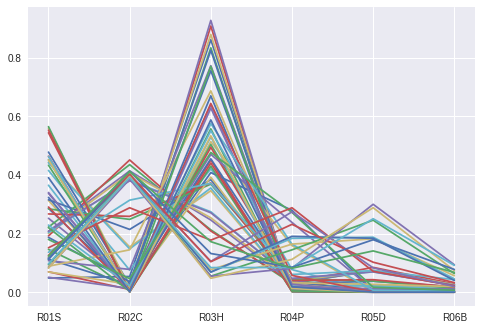

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S y !=R04P)", num_errors)
    

Errores (Pred !=R01S, pero puede ser R04P) 9  de  300


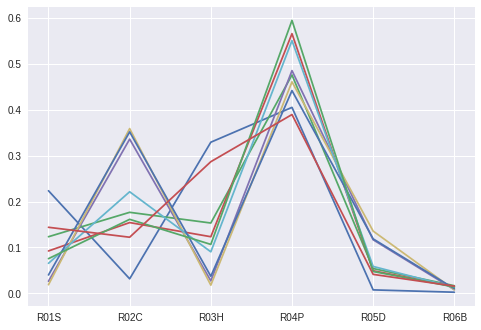

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R01S 235  de  300


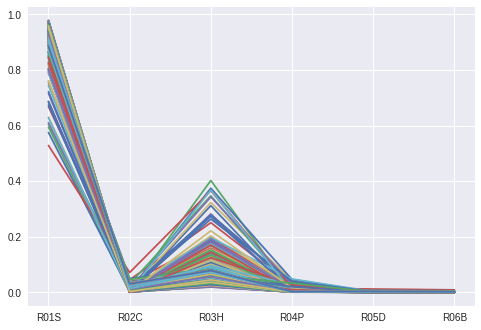

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R01S", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO2C

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R02C"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
599,599,R02C,1SY,0.558718,0.760335,0.746419,0.475,3.177,0.0,3.177,0.795606,1.177478
600,600,R02C,1SY,0.577350,0.783576,0.758763,0.511,4.038,0.0,4.038,2.052728,1.355238
601,601,R02C,1SY,0.730892,0.748962,0.853670,0.327,4.635,0.0,4.635,2.874678,1.626835
602,602,R02C,1SY,0.395225,0.690486,0.627850,0.512,2.894,0.0,2.894,0.286033,0.989559
603,603,R02C,1SY,0.394922,0.713167,0.627626,0.621,3.061,0.0,3.061,0.771509,1.060812


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R02C' 'R05D' 'R05D' 'R02C' 'R05D'
 'R05D' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R02C'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R04P' 'R02C'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C'
 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D' 'R02C' 'R02C' 'R05D'
 'R02C' 'R05D' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R03H' 'R02C' 'R01S'
 'R02C' 'R02C' 'R02C' 'R02C' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C

Errores (Pred !=R02C y !=R04P) 121


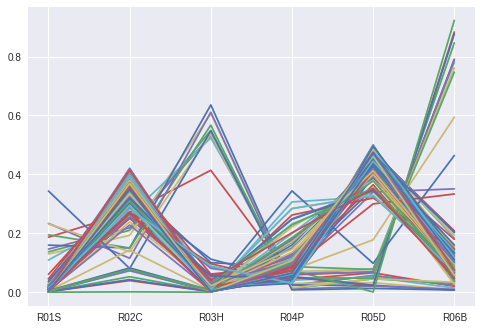

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C y !=R04P)", num_errors)
    

Errores (Pred !=R02C, pero puede ser R04P) 76  de  300


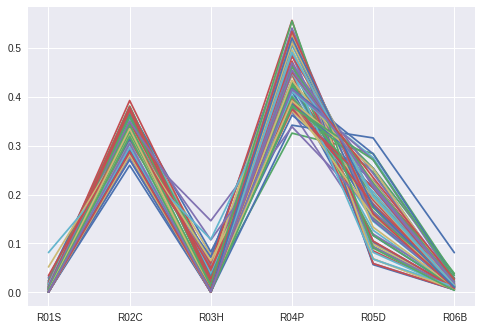

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R02C 103  de  300


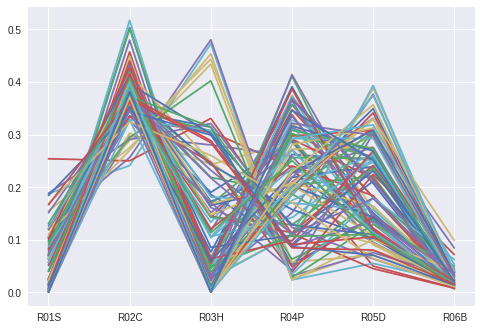

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R02C", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO5D

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R05D"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R02C' 'R05D' 'R02C'
 'R02C' 'R05D' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R02C' 'R05D' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D'
 'R04P' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B' 'R06B' 'R06B' 'R06B'
 'R05D' 'R05D' 'R06B' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B' 'R05D' 'R06B'
 'R06B' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R04P' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D' 'R02C' 'R02C' 'R05D' 'R02C'
 'R02C' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D

Errores (Pred !=R05D y !=R04P) 51


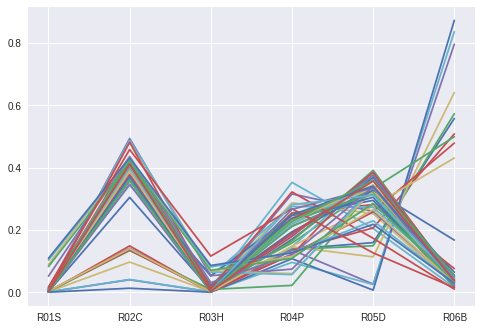

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D y !=R04P)", num_errors)
    

Errores (Pred !=R05D, pero puede ser R04P) 17  de  300


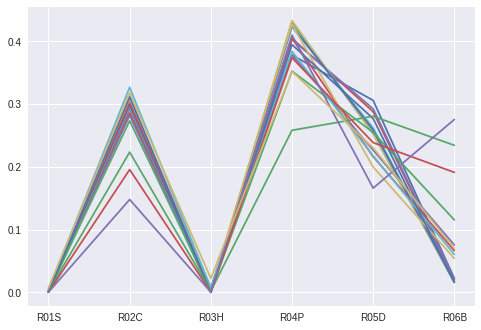

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R05D 232  de  300


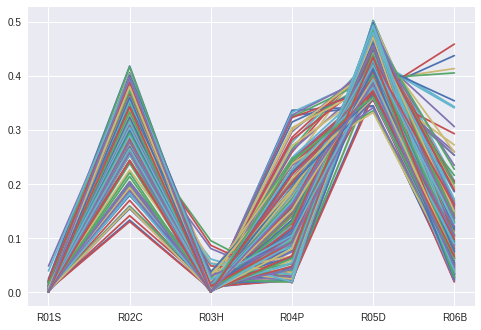

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R05D", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO6B

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R06B"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R05D' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B

Errores (Pred !=R06B y !=R03H) 32


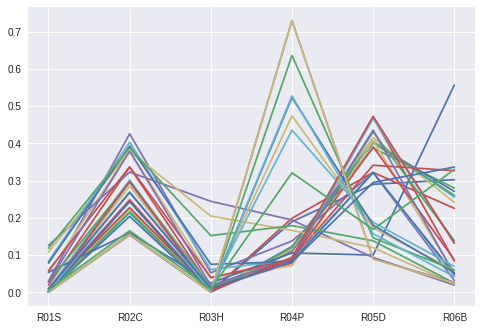

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R03H':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B y !=R03H)", num_errors)
    

Errores (Pred !=R06B, pero puede ser R03H) 0  de  300


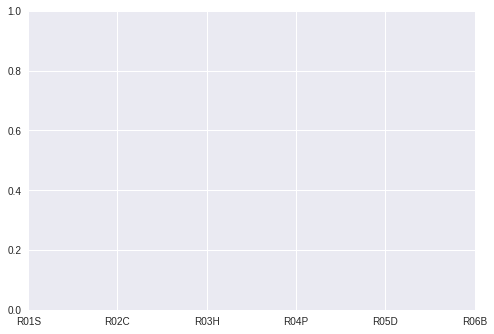

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R03H':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B, pero puede ser R03H)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R6B 268  de  300


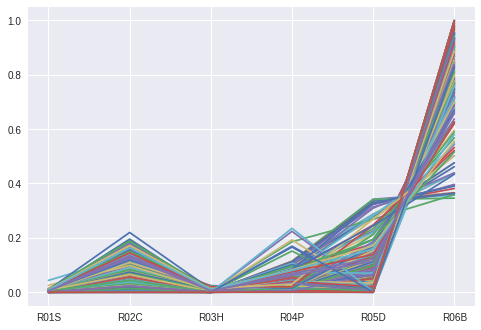

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R6B", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO4P

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R04P"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R05D' 'R02C'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R02C' 'R05D' 'R04P' 'R02C' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R02C' 'R05D' 'R02C' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C'
 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P' 'R03H' 'R04P' 'R04P' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R05D' 'R02C' 'R05D' 'R05D' 'R05D'
 'R04P' 'R04P' 'R04P' 'R05D' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R02C' 'R03H'
 'R03H' 'R03H' 'R03H' 'R04P' 'R04P' 'R03H' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P

Errores (Pred !=R06B y !=R04P) 68


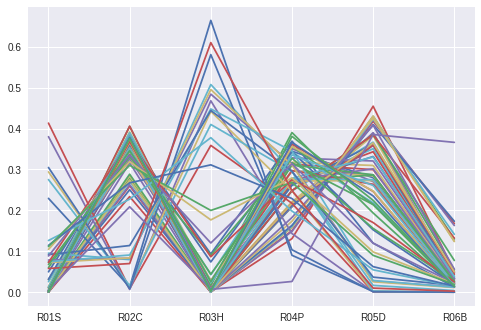

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R06B':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B y !=R04P)", num_errors)
    

Errores evitables (Pred =R06B) 24  de  300


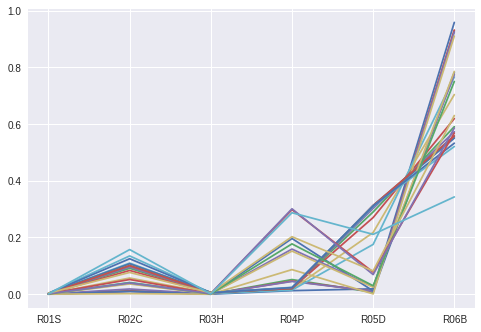

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R06B':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores evitables (Pred =R06B)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R4P 208  de  300


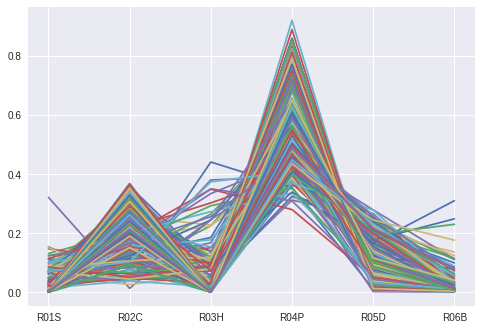

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R4P", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO3H

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R03H"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
909,909,R03H,1SY,1.088756,1.804891,1.042267,1.649,4.151,0.0,4.151,-0.825695,0.007875
910,910,R03H,1SY,1.172161,1.717113,1.081279,1.589,4.937,0.0,4.937,-0.748869,0.103830
911,911,R03H,1SY,1.195493,1.588954,1.091888,1.472,3.823,0.0,3.823,-0.935381,0.176229
912,912,R03H,1SY,1.214738,1.680426,1.100681,1.560,3.829,0.0,3.829,-0.970469,0.097579
913,913,R03H,1SY,1.058432,1.833179,1.027722,1.688,3.807,0.0,3.807,-0.820922,-0.017508


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
542,1.206235,1.701422,1.096842,1.218,3.832,0.0,3.832,-0.994534,0.431214
543,1.184781,1.685465,1.087051,1.190,3.867,0.0,3.867,-1.005869,0.386140
544,1.518608,1.771450,1.230551,1.233,4.102,0.0,4.102,-1.271264,0.308910
545,1.377762,1.808869,1.172178,1.253,4.057,0.0,4.057,-1.220799,0.226902
546,1.343131,1.793451,1.157366,1.247,3.979,0.0,3.979,-1.180951,0.261371


In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R02C' 'R02C' 'R02C'
 'R03H' 'R02C' 'R03H' 'R03H' 'R02C' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R05D' 'R05D' 'R02C' 'R05D' 'R03H' 'R01S' 'R01S' 'R01S' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H

In [0]:
prob = clf.predict_proba(x_scans_test2)

Errores (Pred !=R03H y !=R04P) 25


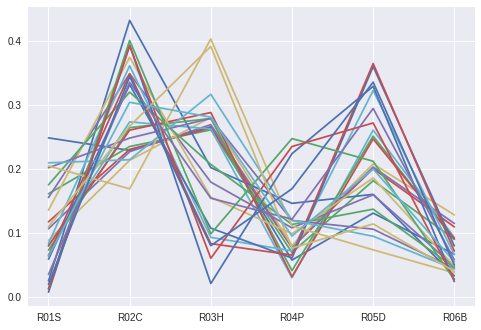

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] != 'R04P') and (predictions_SVC[pred_id] != 'R06B'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H y !=R04P)", num_errors)
    

Errores (Pred !=R03H, pero puede ser R04P/R06B) 6  de  300


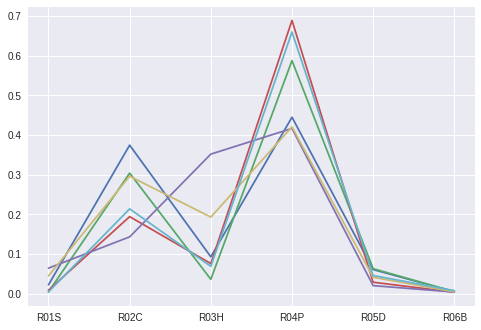

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] == 'R04P') or (predictions_SVC[pred_id] == 'R06B'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H, pero puede ser R04P/R06B)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R03H 269  de  300


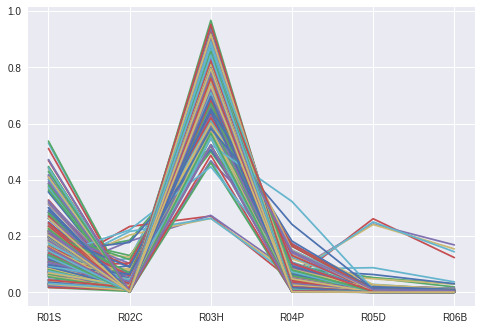

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R03H", num_errors, " de ", len(predictions_SVC))
    

### Using Context Filters & Semantic Graphs - CASA 2CA

#### Define and train a SVM (Kernel=linear) y PROBABILITIES - CASA 2CA

In [0]:
x_scans_train = x_scans_train_2CA
y_rooms_train = y_rooms_train_2CA

In [0]:
# lets try to get the probabilities:
import sklearn
import numpy as np
# Here we use LinearSVC
from sklearn.svm import SVC


# define the classifier
# clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf=sklearn.svm.SVC(kernel='linear',probability=True)
clf.fit(X,y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 2.85617763e+00 -1.19204013e-01  3.60129266e-01  1.05967403e+00
   1.91820895e-01  0.00000000e+00  1.91820895e-01  5.87001314e-01
  -2.21811490e+00]
 [ 2.76216398e+00 -3.44157761e+00  1.33120391e+00 -3.89220283e-01
   1.08565454e-01  0.00000000e+00  1.08565454e-01  1.97766609e+00
  -5.62162777e+00]
 [ 7.11679501e-01  1.30492650e+00  1.78469251e-01  1.87559580e+00
   1.37467538e-01  0.00000000e+00  1.37467538e-01  5.59538631e-01
  -3.02388820e+00]
 [ 1.39918562e+00  3.08163349e+00  6.55520048e-02  1.61902407e+00
  -7.80504744e-02  0.00000000e+00 -7.80504744e-02 -2.39179588e-01
   4.11978501e-01]
 [ 3.34758611e-01  2.03957666e+00  2.16799124e-01  2.52128497e+00
   2.26125453e-01 -6.45744497e-02  2.90699903e-01  3.11854414e-02
  -5.86447179e-01]
 [-2.23998872e+00 -1.84946585e+00  1.68973830e+00 -2.71483570e+00
   1.13155085e-01  1.16271343e-01 -3.11625818e-03  7.77172265e-01
  -2.57965222e+00]
 [-1.57724327e+00  7.53705972e-01 -6.85457636e-01  2.12266313e+00
  -1.11305084e+00 -2.0350539

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_2CA-prob.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_2CA-prob.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_2CA
y_rooms_test = y_rooms_test_2CA

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_train.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R02C' 'R02C' 'R05D' 'R03H' 'R03H' 'R02C' 'R04P' 'R02C' 'R01S' 'R03H'
 'R04P' 'R02C' 'R01S' 'R02C' 'R05D' 'R06B' 'R01S' 'R05D' 'R01S' 'R04P'
 'R05D' 'R04P' 'R06B' 'R02C' 'R06B' 'R02C' 'R03H' 'R03H' 'R03H' 'R03H'
 'R01S' 'R02C' 'R06B' 'R02C' 'R06B' 'R06B' 'R03H' 'R03H' 'R06B' 'R02C'
 'R06B' 'R04P' 'R03H' 'R02C' 'R06B' 'R04P' 'R05D' 'R02C' 'R02C' 'R04P'
 'R04P' 'R05D' 'R06B' 'R03H' 'R04P' 'R03H' 'R02C' 'R05D' 'R01S' 'R04P'
 'R01S' 'R05D' 'R04P' 'R04P' 'R01S' 'R06B' 'R02C' 'R04P' 'R06B' 'R01S'
 'R05D' 'R02C' 'R05D' 'R06B' 'R02C' 'R06B' 'R06B' 'R02C' 'R02C' 'R05D'
 'R05D' 'R01S' 'R02C' 'R02C' 'R03H' 'R04P' 'R02C' 'R01S' 'R04P' 'R06B'
 'R02C' 'R06B' 'R06B' 'R05D' 'R01S' 'R02C' 'R06B' 'R01S' 'R05D' 'R04P'
 'R03H' 'R01S' 'R03H' 'R03H' 'R01S' 'R05D' 'R05D' 'R01S' 'R03H' 'R06B'
 'R03H' 'R01S' 'R03H' 'R01S' 'R01S' 'R05D' 'R06B' 'R01S' 'R06B' 'R01S'
 'R06B' 'R02C' 'R02C' 'R03H' 'R06B' 'R02C' 'R04P' 'R06B' 'R03H' 'R03H'
 'R03H' 'R03H' 'R06B' 'R03H' 'R02C' 'R01S' 'R04P' 'R02C' 'R04P' 'R05D'
 'R01S

#### Using Semantic Graph - CASA 2CA

##### Checking with a Semantic Map/Graph - RO1S

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R01S"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1773,1773,R01S,1SY,1.051380,1.318689,1.023917,1.920,2.662,0.0,2.662,-1.697655,-0.414517
1774,1774,R01S,1SY,1.057366,1.352103,1.026838,1.925,2.834,0.0,2.834,-1.640505,-0.451069
1775,1775,R01S,1SY,1.053855,1.321684,1.025122,1.919,2.644,0.0,2.644,-1.695648,-0.413851
1776,1776,R01S,1SY,1.063311,1.364003,1.029723,1.928,2.918,0.0,2.918,-1.616231,-0.451324
1777,1777,R01S,1SY,1.047208,1.329469,1.021890,1.921,2.633,0.0,2.633,-1.678363,-0.430320


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R04P' 'R01S' 'R04P' 'R04P' 'R04P' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R02C' 'R01S' 'R01S'
 'R02C' 'R03H' 'R02C' 'R02C' 'R03H' 'R03H' 'R01S' 'R03H' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R05D' 'R05D' 'R05D' 'R02C' 'R03H'
 'R05D' 'R05D' 'R05D' 'R03H' 'R02C' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R02C' 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R05D' 'R02C'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R01S' 'R01S'
 'R01S' 'R04P' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S

In [0]:
print(prob[61])

[0.14635677 0.01264113 0.83212694 0.00346417 0.00233575 0.00307524]


Errores (Pred !=R01S y !=R04P) 53


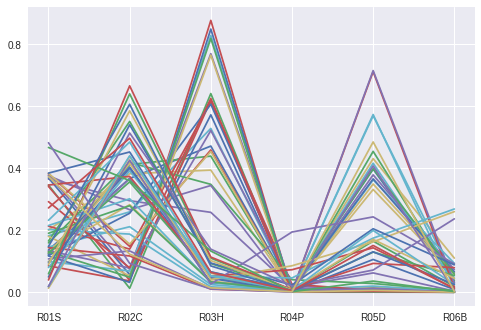

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S y !=R04P)", num_errors)
    

Errores (Pred !=R01S, pero puede ser R04P) 7  de  300


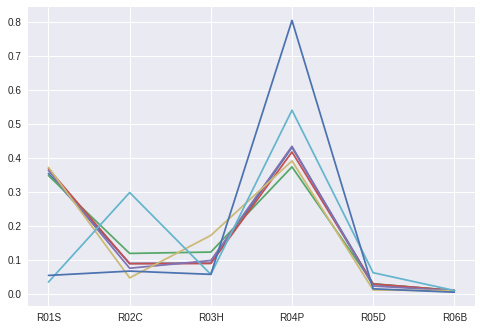

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R01S 240  de  300


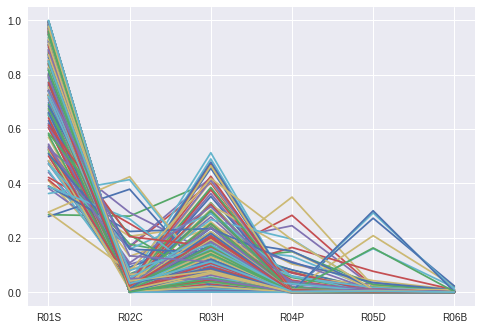

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R01S", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO2C

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R02C"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R01S' 'R02C' 'R05D' 'R02C' 'R02C'
 'R01S' 'R03H' 'R03H' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R04P' 'R02C' 'R04P' 'R02C' 'R04P' 'R02C' 'R02C' 'R05D' 'R02C'
 'R05D' 'R05D' 'R03H' 'R02C' 'R05D' 'R03H' 'R03H' 'R02C' 'R03H' 'R03H'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R03H' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R02C' 'R02C' 'R02C' 'R05D' 'R02C'
 'R02C' 'R03H' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R05D' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R05D'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C' 'R05D' 'R02C'
 'R02C

Errores (Pred !=R02C y !=R04P) 95


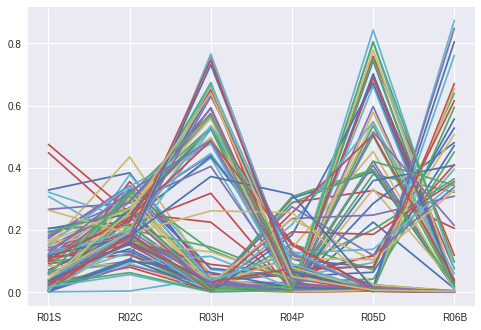

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C y !=R04P)", num_errors)
    

Errores (Pred !=R02C, pero puede ser R04P) 34  de  300


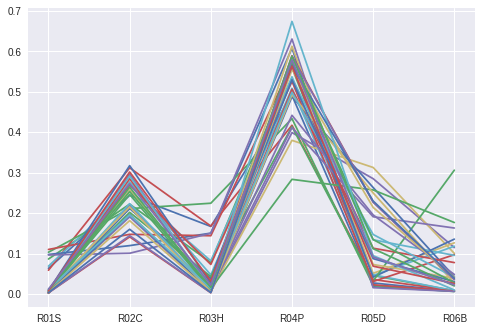

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R02C 171  de  300


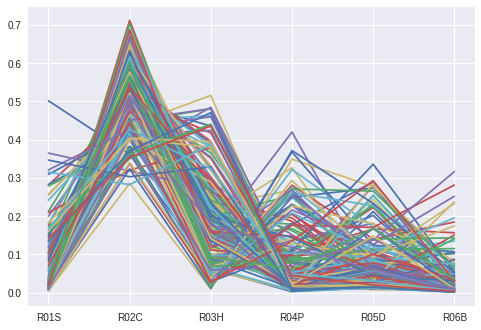

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R02C", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO5D

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R05D"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B' 'R05D' 'R06B'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R01S' 'R05D' 'R05D' 'R01S' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D' 'R05D' 'R05D' 'R06B' 'R02C'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B' 'R06B' 'R06B' 'R05D'
 'R04P' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C'
 'R05D

Errores (Pred !=R05D y !=R04P) 26


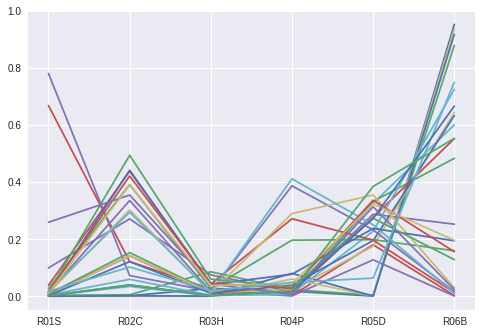

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D y !=R04P)", num_errors)
    

Errores (Pred !=R05D, pero puede ser R04P) 9  de  300


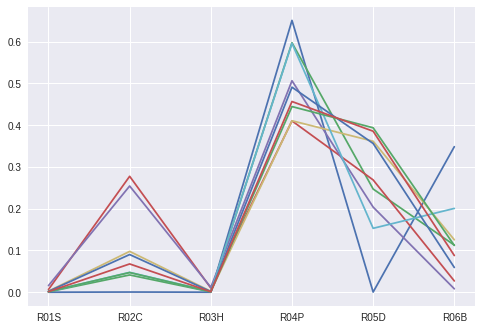

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R05D 265  de  300


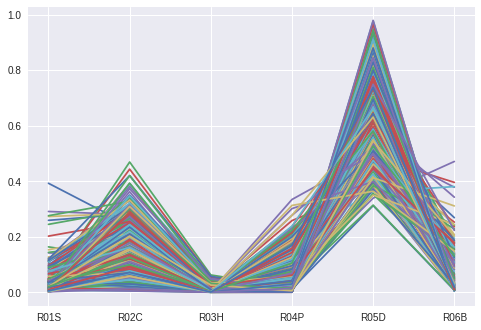

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R05D", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO6B

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R06B"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D' 'R02C' 'R06B' 'R06B'
 'R02C

Errores (Pred !=R06B y !=R04P) 29


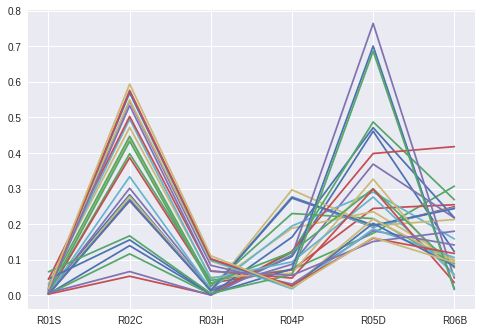

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B y !=R04P)", num_errors)
    

Errores (Pred !=R06B, pero puede ser R04P) 1  de  300


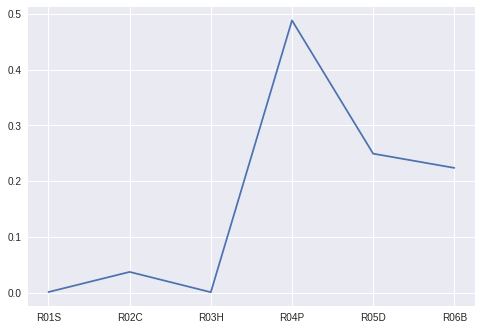

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R6B 270  de  300


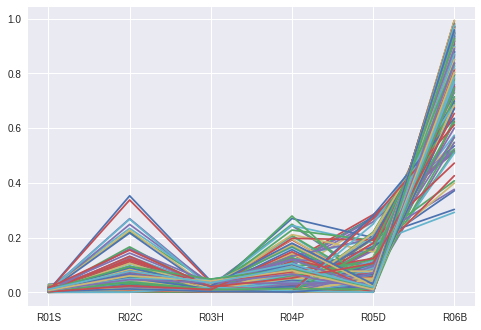

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R6B", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO4P

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R04P"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R02C' 'R04P' 'R02C' 'R04P' 'R02C' 'R02C' 'R06B' 'R04P'
 'R06B' 'R02C' 'R06B' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R02C' 'R02C' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R05D' 'R04P' 'R05D' 'R05D' 'R05D' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R03H' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R04P'
 'R05D' 'R02C' 'R06B' 'R06B' 'R04P' 'R04P' 'R06B' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P

Errores (!=R04P) 62


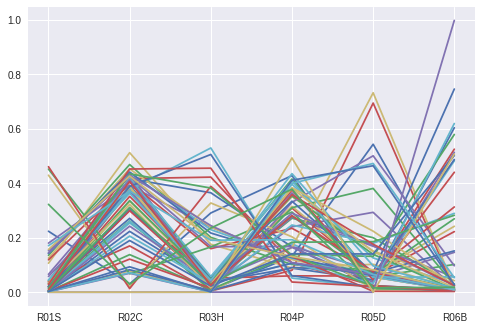

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    #if predictions_SVC[pred_id] != 'R06B':
    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (!=R04P)", num_errors)
    

Correctas (Pred ==R4P 238  de  300


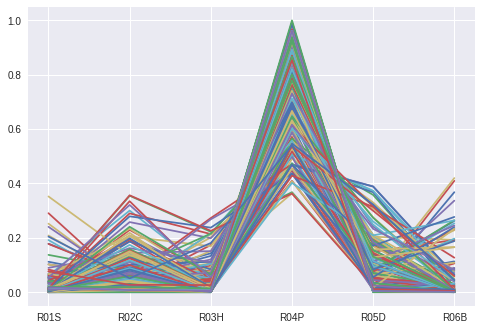

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R4P", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO3H

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R03H"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
909,909,R03H,1SY,1.088756,1.804891,1.042267,1.649,4.151,0.0,4.151,-0.825695,0.007875
910,910,R03H,1SY,1.172161,1.717113,1.081279,1.589,4.937,0.0,4.937,-0.748869,0.103830
911,911,R03H,1SY,1.195493,1.588954,1.091888,1.472,3.823,0.0,3.823,-0.935381,0.176229
912,912,R03H,1SY,1.214738,1.680426,1.100681,1.560,3.829,0.0,3.829,-0.970469,0.097579
913,913,R03H,1SY,1.058432,1.833179,1.027722,1.688,3.807,0.0,3.807,-0.820922,-0.017508


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
542,1.206235,1.701422,1.096842,1.218,3.832,0.0,3.832,-0.994534,0.431214
543,1.184781,1.685465,1.087051,1.190,3.867,0.0,3.867,-1.005869,0.386140
544,1.518608,1.771450,1.230551,1.233,4.102,0.0,4.102,-1.271264,0.308910
545,1.377762,1.808869,1.172178,1.253,4.057,0.0,4.057,-1.220799,0.226902
546,1.343131,1.793451,1.157366,1.247,3.979,0.0,3.979,-1.180951,0.261371


In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R03H' 'R03H' 'R02C' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R01S'
 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R03H' 'R03H' 'R03H' 'R01S' 'R01S'
 'R03H' 'R03H' 'R01S' 'R04P' 'R01S' 'R03H' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R01S' 'R04P' 'R04P' 'R04P' 'R01S' 'R04P' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R02C' 'R03H' 'R03H' 'R03H' 'R03H' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H

In [0]:
prob = clf.predict_proba(x_scans_test2)

Errores (Pred !=R03H y !=R04P) 103


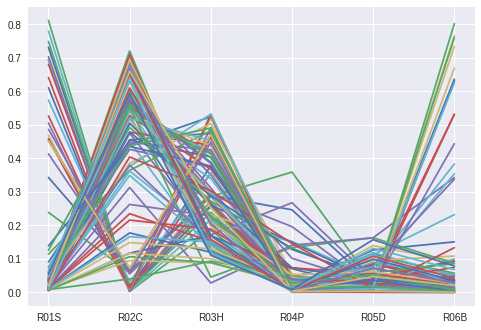

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] != 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H y !=R04P)", num_errors)
    

Errores (Pred !=R03H, pero puede ser R04P 20  de  300


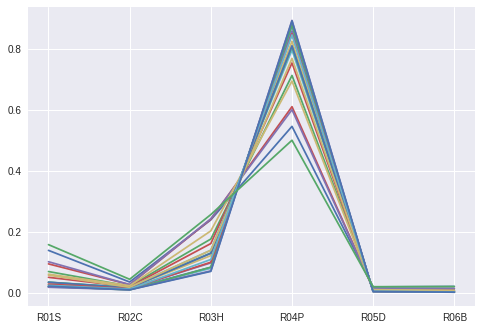

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] == 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H, pero puede ser R04P", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R03H 177  de  300


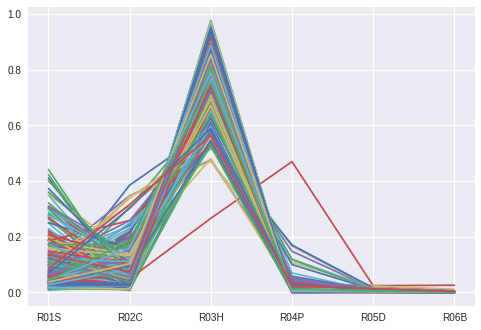

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R03H", num_errors, " de ", len(predictions_SVC))
    

### Using Context Filters & Semantic Graphs - CASA 3ME

#### Define and train a SVM (Kernel=linear) y PROBABILITIES - CASA 3ME

In [0]:
x_scans_train = x_scans_train_3ME
y_rooms_train = y_rooms_train_3ME

In [0]:
# lets try to get the probabilities:
import sklearn
import numpy as np
# Here we use LinearSVC
from sklearn.svm import SVC


# define the classifier
# clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf=sklearn.svm.SVC(kernel='linear',probability=True)
clf.fit(X,y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[ 1.5804968   0.41077365  0.89045288  1.67198034  0.33138941  0.
   0.33138941 -0.23139772 -1.3250775 ]
 [ 2.96272634 -2.26167284  1.67380767  2.61594304  0.45117242  0.
   0.45117242  0.82284745 -2.35271379]
 [ 1.15898833  2.1712292   0.17782476  0.21911347 -0.04666668  0.
  -0.04666668  0.36927372 -2.19545838]
 [ 1.00241806 -1.45464248  0.66144161  1.04833804  1.15629241  0.
   1.15629241 -0.33302885 -2.1424805 ]
 [ 1.3115437   1.1933118   0.71143213  0.2271732   0.36334059  0.
   0.36334059 -0.24845907 -1.22407952]
 [-2.29878657 -2.6797894  -0.93768736  0.16513446 -0.25117668 -0.42500001
   0.17382333  0.17527579  0.95112423]
 [-2.65493777  1.38138851 -1.47090363  1.41209387 -0.6678638  -1.60797572
   0.94011192  0.03047471 -0.1922282 ]
 [-4.73259849 -3.37939769 -2.54986672 -1.25568518  1.15517949  0.
   1.15517949 -0.97225406  1.46281765]
 [ 2.3262414   0.16664454  2.3822093  -3.08847569  0.17746135 -0.007
   0.18446135  0.47703095 -0.81099676]
 [-0.19627647  2.22569021 -0.0326192

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_3ME-prob.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_3ME-prob.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_3ME
y_rooms_test = y_rooms_test_3ME

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_train.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R04P' 'R06B' 'R04P' 'R02C' 'R04P' 'R02C' 'R04P' 'R05D' 'R03H' 'R01S'
 'R06B' 'R03H' 'R01S' 'R03H' 'R02C' 'R06B' 'R03H' 'R05D' 'R02C' 'R04P'
 'R02C' 'R03H' 'R03H' 'R06B' 'R02C' 'R06B' 'R06B' 'R06B' 'R05D' 'R06B'
 'R06B' 'R05D' 'R02C' 'R02C' 'R04P' 'R06B' 'R04P' 'R05D' 'R03H' 'R03H'
 'R03H' 'R02C' 'R04P' 'R04P' 'R03H' 'R04P' 'R03H' 'R06B' 'R06B' 'R03H'
 'R01S' 'R06B' 'R01S' 'R02C' 'R01S' 'R06B' 'R06B' 'R01S' 'R05D' 'R06B'
 'R02C' 'R06B' 'R03H' 'R04P' 'R05D' 'R05D' 'R04P' 'R06B' 'R06B' 'R06B'
 'R04P' 'R03H' 'R04P' 'R04P' 'R06B' 'R05D' 'R04P' 'R02C' 'R04P' 'R04P'
 'R01S' 'R05D' 'R04P' 'R03H' 'R04P' 'R04P' 'R04P' 'R03H' 'R05D' 'R04P'
 'R06B' 'R04P' 'R05D' 'R05D' 'R05D' 'R03H' 'R06B' 'R06B' 'R04P' 'R06B'
 'R03H' 'R03H' 'R04P' 'R04P' 'R02C' 'R01S' 'R05D' 'R05D' 'R05D' 'R03H'
 'R01S' 'R02C' 'R04P' 'R03H' 'R06B' 'R03H' 'R05D' 'R02C' 'R04P' 'R05D'
 'R04P' 'R02C' 'R02C' 'R03H' 'R03H' 'R05D' 'R04P' 'R01S' 'R04P' 'R04P'
 'R04P' 'R02C' 'R03H' 'R06B' 'R04P' 'R04P' 'R06B' 'R04P' 'R01S' 'R01S'
 'R04P

#### Using Semantic Graph - CASA 3ME

##### Checking with a Semantic Map/Graph - RO1S

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R01S"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R01S' 'R03H' 'R03H' 'R01S' 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R03H' 'R03H'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R01S' 'R01S' 'R04P' 'R01S' 'R01S'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R01S' 'R04P'
 'R01S' 'R01S' 'R01S' 'R04P' 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R01S

In [0]:
print(prob[61])

[0.14635677 0.01264113 0.83212694 0.00346417 0.00233575 0.00307524]


Errores (Pred !=R01S y !=R04P) 57


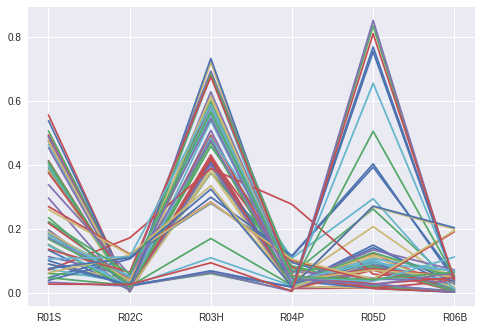

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S y !=R04P)", num_errors)
    

Errores (Pred !=R01S, pero puede ser R04P) 33  de  300


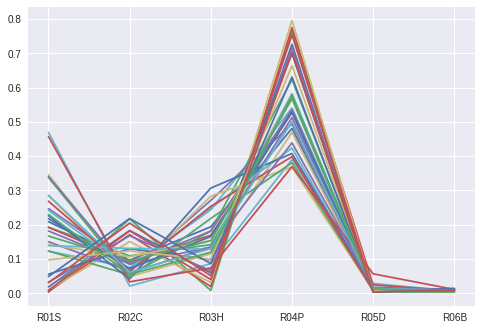

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R01S 210  de  300


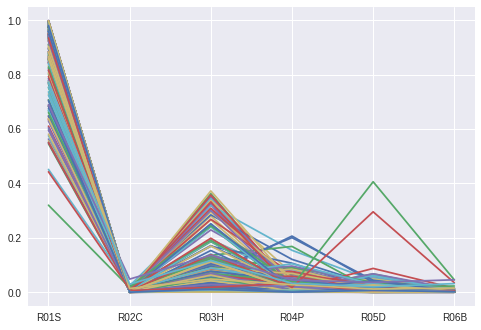

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R01S", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO2C

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R02C"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B' 'R06B'
 'R06B' 'R02C' 'R06B' 'R06B' 'R02C' 'R02C' 'R06B' 'R06B' 'R02C' 'R02C'
 'R02C' 'R06B' 'R06B' 'R02C' 'R02C' 'R06B' 'R02C' 'R06B' 'R06B' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P'
 'R02C' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R05D' 'R05D' 'R06B' 'R06B'
 'R02C' 'R04P' 'R06B' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D'
 'R06B' 'R05D' 'R05D' 'R02C' 'R02C' 'R05D' 'R02C' 'R06B' 'R02C' 'R02C'
 'R02C' 'R02C' 'R04P' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R04P' 'R03H' 'R04P' 'R04P'
 'R04P

Errores (Pred !=R02C y !=R04P) 72


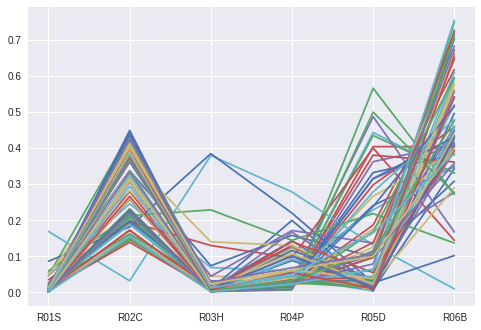

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C y !=R04P)", num_errors)
    

Errores (Pred !=R02C, pero puede ser R04P) 97  de  300


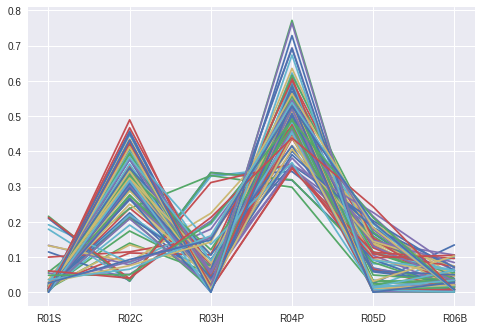

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R02C 131  de  300


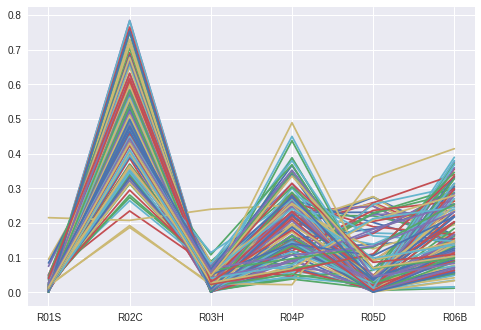

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R02C", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO5D

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R05D"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R02C' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R02C' 'R02C' 'R02C' 'R02C' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R04P' 'R05D' 'R04P' 'R05D'
 'R05D' 'R05D' 'R02C' 'R05D' 'R04P' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D

Errores (Pred !=R05D y !=R04P) 42


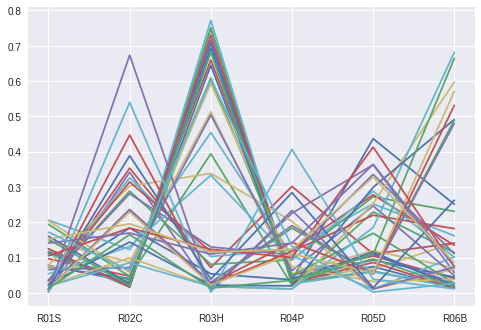

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D y !=R04P)", num_errors)
    

Errores (Pred !=R05D, pero puede ser R04P) 37  de  300


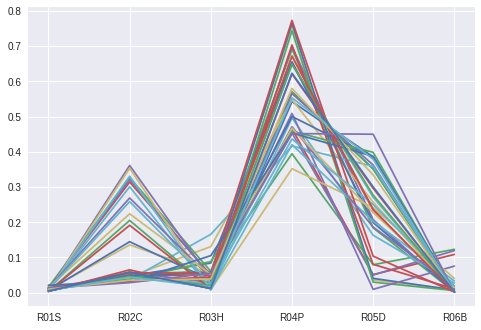

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R05D 221  de  300


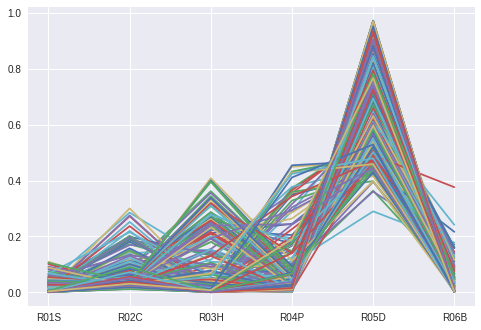

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R05D", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO6B

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R06B"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R04P' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R04P' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R02C' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B

Errores (Pred !=R06B y !=R04P) 32


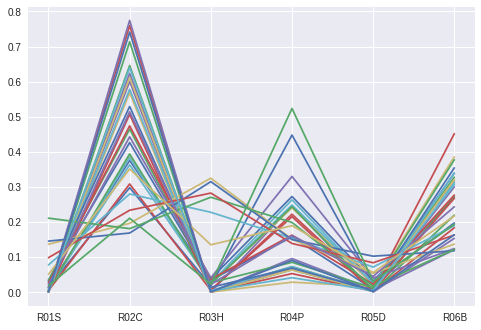

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B y !=R04P)", num_errors)
    

Errores (Pred !=R06B, pero puede ser R04P) 20  de  300


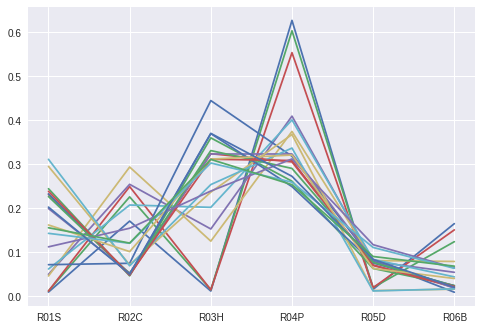

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R6B 248  de  300


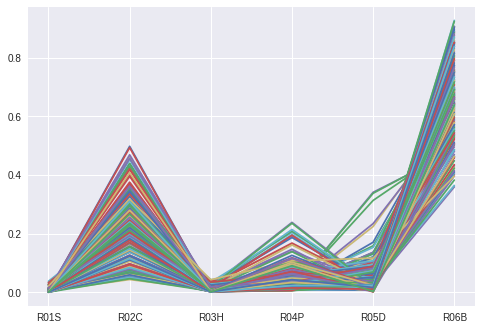

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R6B", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO4P

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R04P"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R06B' 'R04P' 'R02C' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R06B' 'R04P' 'R04P'
 'R06B' 'R02C' 'R04P' 'R04P' 'R04P' 'R02C' 'R02C' 'R06B' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R04P' 'R02C' 'R02C' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R02C' 'R04P' 'R04P' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P

Errores (!=R04P) 117


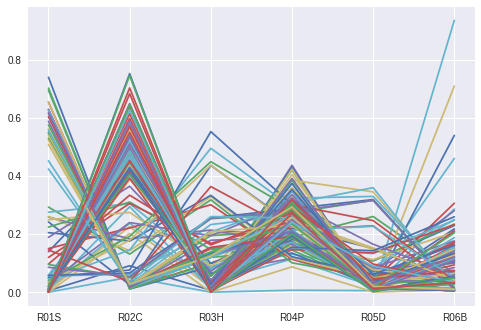

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    #if predictions_SVC[pred_id] != 'R06B':
    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (!=R04P)", num_errors)
    

Correctas (Pred ==R4P 183  de  300


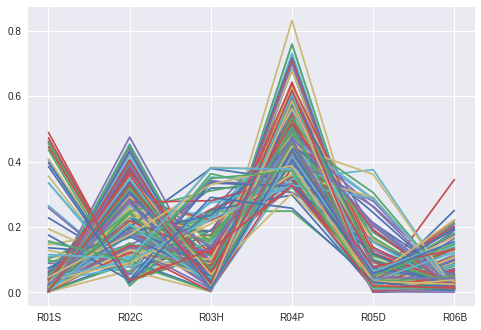

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R4P", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO3H

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R03H"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
542,1.206235,1.701422,1.096842,1.218,3.832,0.0,3.832,-0.994534,0.431214
543,1.184781,1.685465,1.087051,1.190,3.867,0.0,3.867,-1.005869,0.386140
544,1.518608,1.771450,1.230551,1.233,4.102,0.0,4.102,-1.271264,0.308910
545,1.377762,1.808869,1.172178,1.253,4.057,0.0,4.057,-1.220799,0.226902
546,1.343131,1.793451,1.157366,1.247,3.979,0.0,3.979,-1.180951,0.261371


In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R04P' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R01S' 'R03H' 'R03H' 'R01S' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R01S' 'R03H' 'R03H' 'R03H' 'R01S'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R04P' 'R03H'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R01S' 'R03H' 'R03H' 'R03H'
 'R01S' 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H

In [0]:
prob = clf.predict_proba(x_scans_test2)

Errores (Pred !=R03H y !=R04P) 31


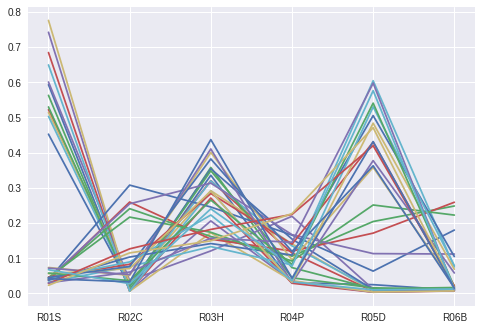

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] != 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H y !=R04P)", num_errors)
    

Errores (Pred !=R03H, pero puede ser R04P 32  de  300


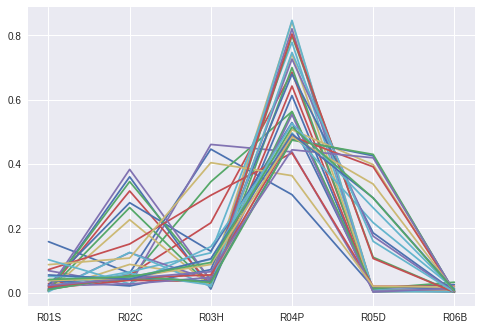

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] == 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H, pero puede ser R04P", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R03H 237  de  300


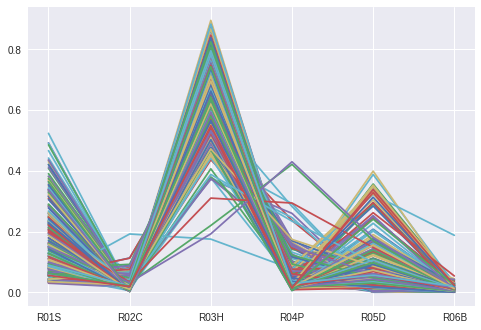

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R03H", num_errors, " de ", len(predictions_SVC))
    

### Using Context Filters & Semantic Graphs - CASA 4TR

#### Define and train a SVM (Kernel=linear) y PROBABILITIES - CASA 4TR

In [0]:
x_scans_train = x_scans_train_4TR
y_rooms_train = y_rooms_train_4TR

In [0]:
# lets try to get the probabilities:
import sklearn
import numpy as np
# Here we use LinearSVC
from sklearn.svm import SVC


# define the classifier
# clf = LinearSVC(random_state=0, tol=1e-8, dual=False)

# prepare/get the columns
X = x_scans_train[x_scans_train.columns[-9:]]
y = np.array(y_rooms_train)
y = y.ravel()

# Fit/train classifier
clf=sklearn.svm.SVC(kernel='linear',probability=True)
clf.fit(X,y)

# Preview coeficients
print(clf.coef_)
print(clf.intercept_)

[[-3.59532416e-01  2.48343388e+00 -1.12864576e-02  2.00876542e+00
   1.10022371e+00  0.00000000e+00  1.10022371e+00 -9.12227641e-01
  -4.17802912e-01]
 [-1.49714640e+00 -1.13346035e+00 -1.74276366e+00  1.49288415e+00
   8.07380693e-01  0.00000000e+00  8.07380693e-01 -1.95430127e-01
  -1.82841827e-02]
 [-8.35411176e-01  2.19410012e+00  6.47482498e-02  2.57655112e+00
   1.20507227e-01 -3.10999990e-01  4.31507217e-01  3.09890824e-01
  -8.99129170e-01]
 [-2.65293430e-01 -8.67030685e-01  1.42511453e-02  3.35499078e+00
   8.75043091e-01  0.00000000e+00  8.75043091e-01 -9.59262509e-01
   1.26634784e+00]
 [ 1.81925525e+00  3.30070659e+00  2.30661687e+00  1.91781301e-01
  -1.89554298e-01 -2.13306282e-01  2.37519839e-02  2.19772240e-01
  -2.18344652e-01]
 [-2.37559546e+00 -2.21633528e+00 -1.21629856e+00  4.96446649e-01
   2.82894773e-03  0.00000000e+00  2.82894773e-03 -2.53155652e-01
   1.12529674e+00]
 [ 8.42021619e-01 -1.62040192e+00  1.69402839e+00  2.02377530e+00
  -1.75985287e+00 -2.1084543

In [0]:
# This function allows us to save the model...
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_4TR-prob.joblib', 'wb')
pickle.dump(clf, save) 

In [0]:
# LOAD THE PREVIOUSLY DEFINED & TRAINED SVM MODEL
import pickle
save=open(DIR_SCANS_MODELS + 'room_teller_SVM_4TR-prob.joblib', 'rb')
room_teller_SVM_1SY = pickle.load(save) 

In [0]:
print(room_teller_SVM_1SY)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=True, random_state=None,
  shrinking=True, tol=0.001, verbose=False)


In [0]:
x_scans_test = x_scans_test_4TR
y_rooms_test = y_rooms_test_4TR

In [0]:
# Run and print predictions
X_test = x_scans_test[x_scans_train.columns[-9:]]
predictions_SVC = room_teller_SVM_1SY.predict(X_test)
print(predictions_SVC)

['R01S' 'R03H' 'R01S' 'R04P' 'R05D' 'R03H' 'R04P' 'R06B' 'R01S' 'R01S'
 'R01S' 'R03H' 'R01S' 'R05D' 'R04P' 'R02C' 'R02C' 'R03H' 'R06B' 'R04P'
 'R06B' 'R03H' 'R02C' 'R01S' 'R01S' 'R04P' 'R02C' 'R02C' 'R01S' 'R06B'
 'R03H' 'R04P' 'R05D' 'R02C' 'R05D' 'R01S' 'R04P' 'R02C' 'R05D' 'R06B'
 'R04P' 'R03H' 'R06B' 'R06B' 'R01S' 'R02C' 'R02C' 'R01S' 'R01S' 'R06B'
 'R04P' 'R06B' 'R06B' 'R03H' 'R02C' 'R01S' 'R02C' 'R03H' 'R02C' 'R05D'
 'R01S' 'R02C' 'R01S' 'R06B' 'R01S' 'R02C' 'R02C' 'R02C' 'R01S' 'R04P'
 'R05D' 'R02C' 'R04P' 'R01S' 'R03H' 'R01S' 'R02C' 'R04P' 'R04P' 'R01S'
 'R06B' 'R03H' 'R05D' 'R03H' 'R04P' 'R01S' 'R03H' 'R02C' 'R03H' 'R02C'
 'R01S' 'R01S' 'R02C' 'R06B' 'R01S' 'R06B' 'R02C' 'R01S' 'R04P' 'R05D'
 'R04P' 'R04P' 'R06B' 'R06B' 'R06B' 'R04P' 'R03H' 'R02C' 'R05D' 'R06B'
 'R06B' 'R06B' 'R06B' 'R01S' 'R05D' 'R05D' 'R02C' 'R04P' 'R05D' 'R03H'
 'R04P' 'R05D' 'R06B' 'R02C' 'R02C' 'R01S' 'R01S' 'R01S' 'R04P' 'R01S'
 'R03H' 'R03H' 'R03H' 'R01S' 'R03H' 'R04P' 'R01S' 'R04P' 'R06B' 'R01S'
 'R01S

#### Using Semantic Graph - CASA 4TR

##### Checking with a Semantic Map/Graph - RO1S

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R01S"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R04P' 'R04P' 'R04P' 'R04P' 'R01S' 'R04P' 'R04P' 'R01S' 'R01S' 'R04P'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R04P' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R04P' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R03H' 'R05D' 'R02C' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R06B' 'R01S' 'R04P' 'R01S' 'R06B'
 'R01S' 'R06B' 'R06B' 'R01S' 'R06B' 'R01S' 'R01S' 'R01S' 'R06B' 'R01S'
 'R06B

In [0]:
print(prob[61])

[0.14635677 0.01264113 0.83212694 0.00346417 0.00233575 0.00307524]


Errores (Pred !=R01S y !=R04P) 55


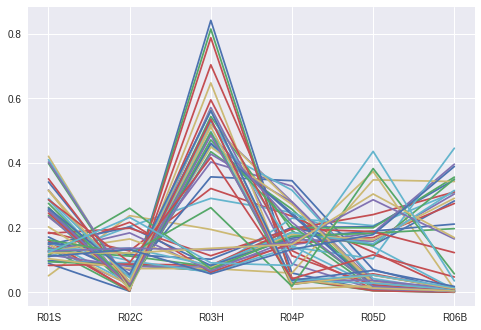

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S y !=R04P)", num_errors)
    

Errores (Pred !=R01S, pero puede ser R04P) 24  de  300


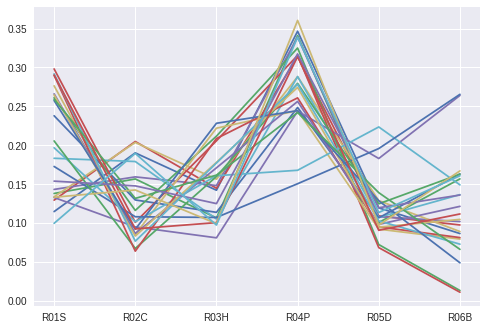

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R01S, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R01S 221  de  300


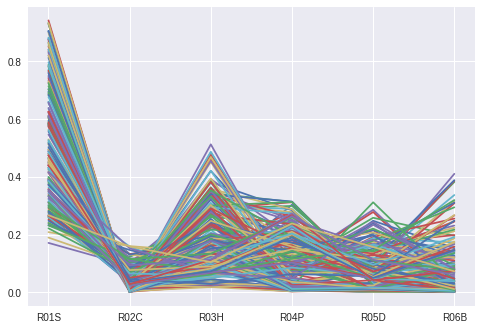

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R01S", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO2C

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R02C"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R03H' 'R02C' 'R02C' 'R02C' 'R01S' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R02C' 'R05D' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R01S' 'R06B' 'R01S'
 'R02C' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R05D' 'R05D'
 'R05D' 'R01S' 'R01S' 'R01S' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R04P' 'R06B' 'R06B' 'R06B' 'R04P'
 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C'
 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B' 'R02C'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C'
 'R04P' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C' 'R06B' 'R06B' 'R02C' 'R02C'
 'R02C

Errores (Pred !=R02C y !=R04P) 99


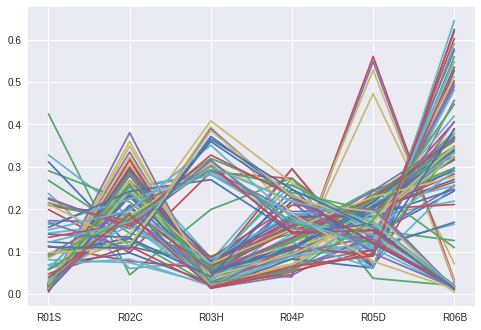

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C y !=R04P)", num_errors)
    

Errores (Pred !=R02C, pero puede ser R04P) 43  de  300


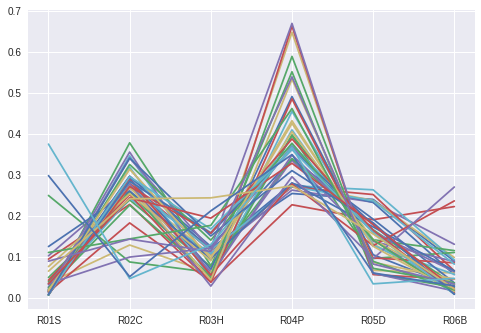

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R02C, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R02C 158  de  300


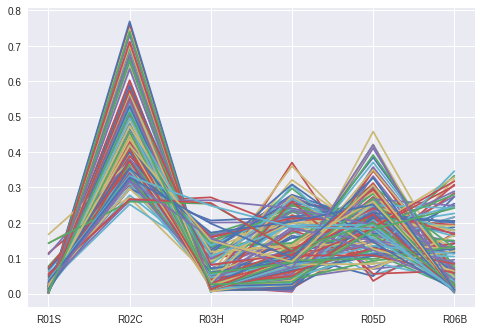

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R02C", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO5D

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R05D"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C'
 'R06B' 'R06B' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B'
 'R06B' 'R06B' 'R06B' 'R01S' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D'
 'R01S' 'R04P' 'R01S' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R02C' 'R04P'
 'R02C' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B' 'R06B' 'R05D' 'R05D' 'R06B'
 'R05D' 'R05D' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R05D' 'R05D' 'R05D' 'R06B' 'R06B' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R01S' 'R01S' 'R01S' 'R01S' 'R05D' 'R05D' 'R05D' 'R05D' 'R06B'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R05D' 'R05D' 'R01S' 'R01S' 'R05D'
 'R05D' 'R01S' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D' 'R05D'
 'R05D' 'R05D' 'R05D' 'R06B' 'R05D' 'R02C' 'R05D' 'R02C' 'R02C' 'R02C'
 'R02C' 'R03H' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P'
 'R04P

Errores (Pred !=R05D y !=R04P) 150


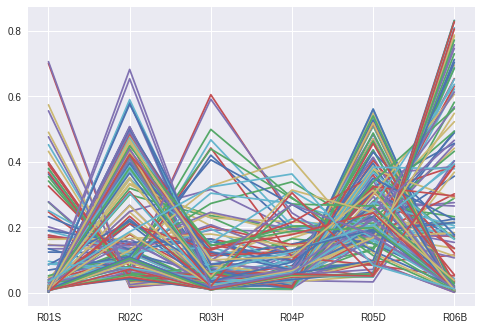

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D y !=R04P)", num_errors)
    

Errores (Pred !=R05D, pero puede ser R04P) 48  de  300


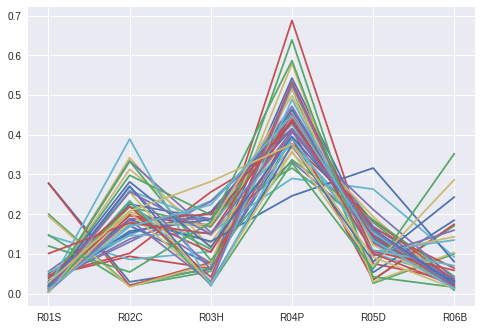

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R05D, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R05D 102  de  300


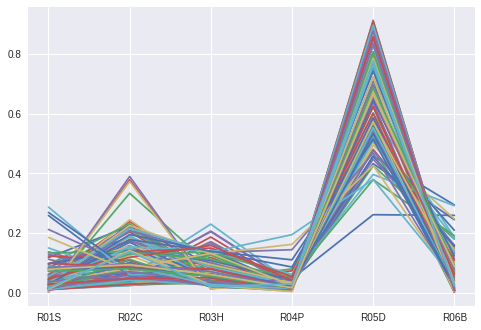

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R05D", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO6B

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R06B"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R01S'
 'R06B' 'R06B' 'R05D' 'R06B' 'R06B' 'R04P' 'R04P' 'R04P' 'R01S' 'R01S'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R04P' 'R04P'
 'R04P' 'R02C' 'R02C' 'R06B' 'R06B' 'R06B' 'R04P' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D' 'R02C' 'R05D'
 'R05D' 'R02C' 'R06B' 'R06B' 'R05D' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R05D' 'R05D'
 'R05D' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R02C' 'R02C' 'R02C' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C' 'R02C' 'R02C' 'R02C' 'R06B'
 'R06B' 'R06B' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B

Errores (Pred !=R06B y !=R04P) 74


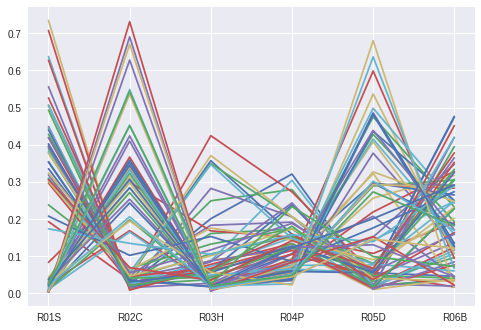

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] != 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B y !=R04P)", num_errors)
    

Errores (Pred !=R06B, pero puede ser R04P) 17  de  300


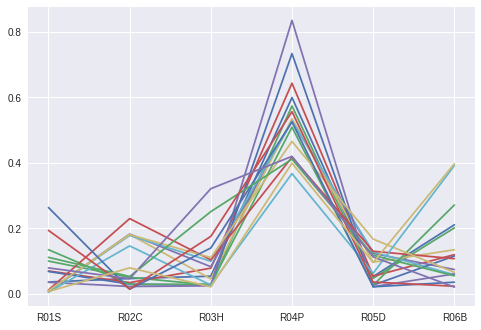

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if predictions_SVC[pred_id] == 'R04P':
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R06B, pero puede ser R04P)", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R6B 209  de  300


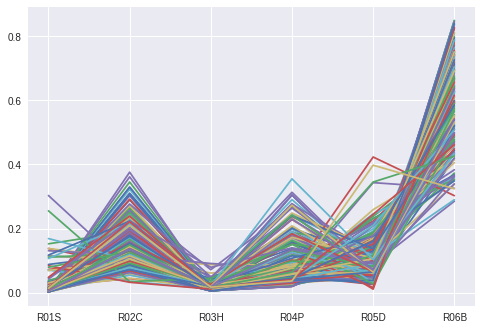

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R6B", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO4P

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R04P"]

In [0]:
x_test2.tail()

,Unnamed: 0,room_ID,house_ID,var,mean,std,median,max,min,range,kurtosis,skewness
1515,1515,R05D,1SY,0.519853,0.906689,0.720104,0.737000,3.985,0.0,3.985,1.852800,1.168907
1516,1516,R05D,1SY,0.617525,0.798351,0.784707,0.436000,4.457,0.0,4.457,3.001607,1.570183
1517,1517,R05D,1SY,0.630817,0.826130,0.793111,0.553000,4.200,0.0,4.200,2.734003,1.545081
1518,1518,R05D,1SY,0.585925,0.897072,0.764429,0.566000,4.047,0.0,4.047,2.314013,1.344526
1519,1519,R05D,1SY,0.573798,0.890142,0.756482,0.573798,4.016,0.0,4.016,1.369623,1.115390


In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
0,1.280102,1.727656,1.129888,2.177,4.305,0.0,4.305,-0.706080,-0.508396
1,1.424719,1.659540,1.191901,2.147,4.327,0.0,4.327,-0.924417,-0.316680
2,1.420910,1.645136,1.190304,2.115,4.316,0.0,4.316,-0.976682,-0.320166
3,1.554625,1.462976,1.245024,1.966,4.339,0.0,4.339,-1.183259,-0.013393
4,1.528801,1.566290,1.234636,2.003,4.332,0.0,4.332,-1.078383,-0.137667


In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R06B' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R02C'
 'R02C' 'R02C' 'R02C' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R02C'
 'R04P' 'R01S' 'R01S' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R04P' 'R03H' 'R02C' 'R02C' 'R02C' 'R06B' 'R06B' 'R06B' 'R06B'
 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R06B' 'R02C'
 'R06B' 'R06B' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R01S' 'R04P' 'R04P'
 'R03H' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R03H'
 'R04P' 'R02C' 'R03H' 'R02C' 'R04P' 'R02C' 'R02C' 'R04P' 'R02C' 'R02C'
 'R02C' 'R06B' 'R06B' 'R06B' 'R06B' 'R04P' 'R06B' 'R06B' 'R04P' 'R06B'
 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R04P' 'R01S'
 'R04P

Errores (!=R04P) 198


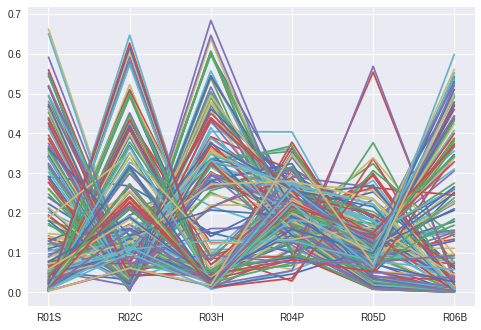

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    #if predictions_SVC[pred_id] != 'R06B':
    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (!=R04P)", num_errors)
    

Correctas (Pred ==R4P 102  de  300


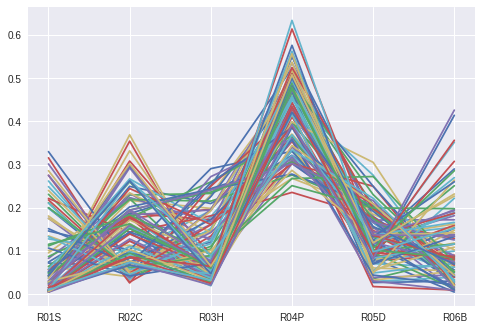

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R4P", num_errors, " de ", len(predictions_SVC))
    

##### Checking with a Semantic Map/Graph - RO3H

In [0]:
x_test2 = xy_scan_data[xy_scan_data.room_ID =="R03H"]

In [0]:
x_test2.tail()

In [0]:
x_scans_test2 = x_test2[x_test2.columns[-9:]]
y_rooms_test2 = x_test2.room_ID

In [0]:
x_scans_test2.head()

,var,mean,std,median,max,min,range,kurtosis,skewness
6052,0.881787,0.772426,0.937668,0.570,5.431,0.0,5.431,15.606359,5.789027
6053,0.208414,0.613794,0.456119,0.548,3.638,0.0,3.638,11.021231,7.800015
6054,1.824322,1.065279,1.349009,0.600,5.350,0.0,5.350,3.748342,2.274826
6055,0.543493,0.713081,0.736168,0.575,5.459,0.0,5.459,23.198658,11.931257
6056,0.718413,0.767809,0.846353,0.584,5.466,0.0,5.466,17.584362,7.365572


In [0]:
predictions_SVC = room_teller_SVM_1SY.predict(x_scans_test2)
print(predictions_SVC)

['R05D' 'R04P' 'R03H' 'R05D' 'R05D' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R01S' 'R03H' 'R01S' 'R03H' 'R03H' 'R03H' 'R01S' 'R04P'
 'R03H' 'R03H' 'R02C' 'R03H' 'R03H' 'R04P' 'R02C' 'R04P' 'R03H' 'R06B'
 'R04P' 'R04P' 'R04P' 'R04P' 'R03H' 'R01S' 'R01S' 'R04P' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S'
 'R03H' 'R03H' 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S'
 'R03H' 'R01S' 'R01S' 'R01S' 'R01S' 'R03H' 'R01S' 'R01S' 'R03H' 'R01S'
 'R01S' 'R01S' 'R01S' 'R03H' 'R03H' 'R01S' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R01S' 'R01S' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R01S' 'R01S'
 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R01S' 'R02C' 'R02C'
 'R01S' 'R04P' 'R04P' 'R04P' 'R02C' 'R02C' 'R02C' 'R02C' 'R04P' 'R04P'
 'R02C' 'R03H' 'R03H' 'R02C' 'R02C' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H' 'R03H'
 'R03H

In [0]:
prob = clf.predict_proba(x_scans_test2)

In [0]:
# PROBANDO MULTIPLICAR... PROB X MATRIZ DE MAPA/GRAFO SEMANTICO...
room_nr = 2 # HAB (R03H)
vector_move = [0,0,1,1,0,0]
count_ok = 0
count_not_ok = 0

for pred_id in range(len(predictions_SVC)):
  if room_nr == np.argmax(prob[pred_id]*vector_move):
    count_ok +=1
  else:
    count_not_ok +=1
    
print("OK:", count_ok)
print("NOT OK:", count_not_ok)
print("TOTAL: ", count_ok + count_not_ok)
print("Precisión (%)", count_ok/(count_ok + count_not_ok))
print(room_teller_SVM_1SY.classes_)

OK: 245
NOT OK: 55
TOTAL:  300
Precisión (%) 0.8166666666666667
['R01S' 'R02C' 'R03H' 'R04P' 'R05D' 'R06B']


Errores (Pred !=R03H y !=R04P) 110


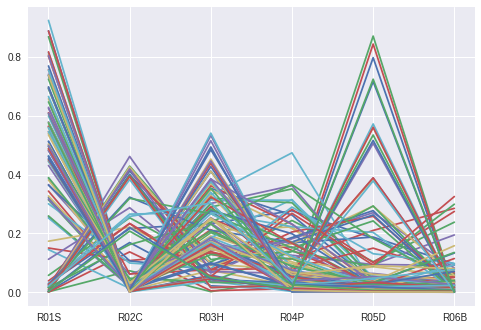

In [0]:
import matplotlib.pyplot as plt
num_errors = 0

for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] != 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H y !=R04P)", num_errors)
    

Errores (Pred !=R03H, pero puede ser R04P 29  de  300


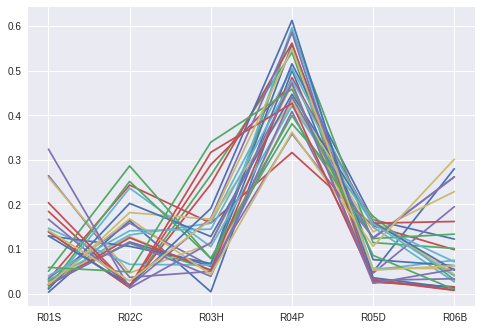

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] != y_rooms_test2.values[pred_id]:    
    if (predictions_SVC[pred_id] == 'R04P'):
      plt.plot(prob[pred_id])
      M1 = max(prob[pred_id])
      M2 = max(n for n in prob[pred_id] if n!=M1)
      # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
      num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Errores (Pred !=R03H, pero puede ser R04P", num_errors, " de ", len(predictions_SVC))
    

Correctas (Pred ==R03H 161  de  300


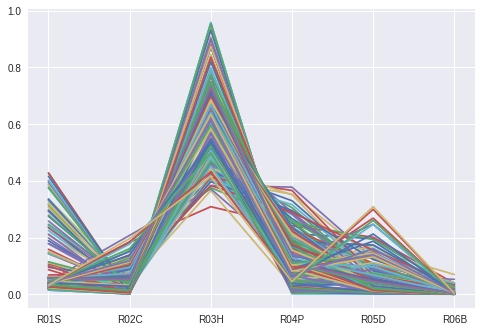

In [0]:
import matplotlib.pyplot as plt
num_errors = 0
for pred_id in range(len(predictions_SVC)):
  if predictions_SVC[pred_id] == y_rooms_test2.values[pred_id]:    

    plt.plot(prob[pred_id])
    M1 = max(prob[pred_id])
    M2 = max(n for n in prob[pred_id] if n!=M1)
    # print(pred_id, ":", predictions_SVC[pred_id], y_rooms_test2.values[pred_id], M1-M2)
    num_errors += 1

      
plt.xticks(range(6), ('R01S', 'R02C', 'R03H', 'R04P', 'R05D', 'R06B') )      
print("Correctas (Pred ==R03H", num_errors, " de ", len(predictions_SVC))
    

# 06 Support functions: Laser_print.py & Room_teller.py

## 6.1 Laser_print(): a function to collect measurements in a room

In [0]:
#!/usr/bin/env python
# -*-- coding: UTF-8 -*-

PKG = 'numpy_tutorial'Laser_print.py
import rospy
from rospy.numpy_msg import numpy_msg
from rospy_tutorials.msg import Floats
from datetime import datetime
import time

def  get_logfile_name(room_prefix="R00G"):

	# prepare the file name using a timestamp
	now_string = str(datetime.now())
	now_string = now_string.replace(":","_")
	now_string = now_string.replace(" ","_")
	now_string = now_string.replace(".","_")
	
	my_path = os.getcwd()    
	file_name = my_path + "/scan/SCAN_" + room_prefix + "_" + str(now_string) + ".txt"
	return file_name


def  save_laser_samples(my_data, room_prefix = "R00G"):
    # This function saves data samples from the laser

    # get the current time as a timestamp
    timestamp = int(time.mktime(datetime.now().timetuple()))

    file_name = get_logfile_name(room_prefix)
    
    # value of number of scan measurements
    number_of_points = my_data.shape[0]

    index_array = numpy.arange(my_data.shape[0]).reshape(number_of_points,1)
   
    now_array = numpy.full(my_data.shape[0], timestamp, dtype="int").reshape(number_of_points,1)
    my_data =  my_data.reshape(number_of_points,1)
    

    newarray = numpy.append(now_array, index_array, axis=1)  
    newarray = numpy.append(newarray, my_data, axis=1)
  
    numpy.savetxt(file_name, newarray, delimiter="," , newline = "\n", fmt=('%s, %s, %s'))
    print  "save_laser_samples():  file: " + file_name

def callback(data):
	print rospy.get_name(), "I heard %s"%str(data)
	save_laser_samples(data.ranges)

def listener():

	rospy.init_node('listener')	
	exitcode = False

	while not exitcode:
		room_number = int(input("Perform data collection in: \n 1-Salon \n 2-Cocina \n 3-Habitación \n 4-Pasillo\n 5-Despacho \n 6-Baño \n 0-STOP \n Enter your selection:"))
		if room_number == 1:
			room_code = "R01S"
		elif room_number == 2:
			room_code = "R02C"
		elif room_number == 3:
			room_code = "R03H"
		elif room_number == 4:
			room_code = "R04P"
		elif room_number == 5:
			room_code = "R05D"
		elif room_number == 6:
			room_code = "R06B"
		else:
			exitcode = True
		
		if not exitcode:
			for i in range(50):
				scan_msg = rospy.wait_for_message("scan",numpy_msg(sensor_msgs.msg.LaserScan))
				print room_code + " SCAN_NR:" + str(i)
				print scan_msg.ranges[100:120]
				save_laser_samples(scan_msg.ranges, room_code)
				print "-------------------------------------------------------------------------------------"
		else:
			return

	rospy.spin()

if __name__ == '__main__':
	listener()


## 6.2 Room_teller(): a function to predict in which room is the robot

In [0]:

# -*-- coding: UTF-8 -*-

PKG = 'numpy_tutorial'
import roslib; roslib.load_manifest(PKG)

import sensor_msgs.msg
import numpy 
import os, sys
import rospy
from rospy.numpy_msg import numpy_msg
from rospy_tutorials.msg import Floats
from datetime import datetime
import time

def  get_logfile_name(room_prefix="R00G"):

	# prepare the file name using a timestamp
	now_string = str(datetime.now())
	now_string = now_string.replace(":","_")
	now_string = now_string.replace(" ","_")
	now_string = now_string.replace(".","_")
	
	my_path = os.getcwd()    
	file_name = my_path + "/scan/SCAN_" + room_prefix + "_" + str(now_string) + ".txt"
	return file_name


def  save_laser_samples(my_data, room_prefix = "R00G"):
    # This function saves data samples from the laser

    # get the current time as a timestamp
    timestamp = int(time.mktime(datetime.now().timetuple()))

    file_name = get_logfile_name(room_prefix)
    
    # value of number of scan measurements
    number_of_points = my_data.shape[0]

    index_array = numpy.arange(my_data.shape[0]).reshape(number_of_points,1)
   
    now_array = numpy.full(my_data.shape[0], timestamp, dtype="int").reshape(number_of_points,1)
    my_data =  my_data.reshape(number_of_points,1)
    

    newarray = numpy.append(now_array, index_array, axis=1)  
    newarray = numpy.append(newarray, my_data, axis=1)
  
    numpy.savetxt(file_name, newarray, delimiter="," , newline = "\n", fmt=('%s, %s, %s'))
    print  "save_laser_samples():  file: " + file_name

def callback(data):
	print rospy.get_name(), "I heard %s"%str(data)
	save_laser_samples(data.ranges)

def listener():

	rospy.init_node('listener')	
	exitcode = False

	while not exitcode:
		room_number = int(input("Perform data collection in: \n 1-Salon \n 2-Cocina \n 3-Habitación \n 4-Pasillo\n 5-Despacho \n 6-Baño \n 0-STOP \n Enter your selection:"))
		if room_number == 1:
			room_code = "R01S"
		elif room_number == 2:
			room_code = "R02C"
		elif room_number == 3:
			room_code = "R03H"
		elif room_number == 4:
			room_code = "R04P"
		elif room_number == 5:
			room_code = "R05D"
		elif room_number == 6:
			room_code = "R06B"
		else:
			exitcode = True
		
		if not exitcode:
			for i in range(50):
				scan_msg = rospy.wait_for_message("scan",numpy_msg(sensor_msgs.msg.LaserScan))
				print room_code + " SCAN_NR:" + str(i)
				print scan_msg.ranges[100:120]
				save_laser_samples(scan_msg.ranges, room_code)
				print "-------------------------------------------------------------------------------------"
		else:
			return

	rospy.spin()

if __name__ == '__main__':
	listener()
